20240505 permutation更改为100,000次

20240905 Intention数据更改（顺带跑一下Cost_RiskyExpected和Allocation和Gratitude

In [1]:
from nltools.data import Adjacency
from nltools.mask import expand_mask, collapse_mask
from nltools.data import Brain_Data
from sklearn.metrics import pairwise_distances
import seaborn as sns
import numpy as np
import glob
import pandas as pd
import os
import matplotlib as mpl
import scipy
%matplotlib inline
from nltools.stats import fdr, threshold, fisher_r_to_z, one_sample_permutation
from nilearn.plotting import plot_glass_brain, plot_stat_map
from sklearn.metrics import pairwise_distances
from nilearn import image
import progressbar
import csv
import nltools

In [2]:
print(nltools.__file__)

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nltools\__init__.py


In [3]:
import nltools
nltools.__version__

'0.5.1'

In [4]:
raw_dir = 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\'
nii_dir = raw_dir + 'rsa_nii\\01_nii\\nii_12onset\\'

behavioral_filename = 'rsa_nii\\behavior_condi_info_241103.xlsx'

results_dir = 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\241103_rsa_12Onset\\WSRSA_condi_results_241103_12Onset\\'

if os.path.exists(results_dir):
    print("distance_dir路径存在")
else:
    print("distance_dir路径不存在")

distance_dir路径存在


# Read Data

In [8]:
niis_list = glob.glob(os.path.join(nii_dir,'s*.nii'))

In [9]:
print(len(list(np.sort(niis_list))))
list(np.sort(niis_list))

552


['E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0164_Outcome_Post_RTwo_Help.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0165_Outcome_Post_RTwo_Nohelp.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0166_Outcome_Post_REight_Help.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0167_Outcome_Post_REight_Nohelp.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0172_Decision_Risk_Help.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0173_Decision_Risk_Nohelp.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0174_Decision_CTwo_Help.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\01_nii\\nii_12onset\\sub7001_con_0175_Decision_CTwo_Nohelp.nii',
 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\rsa_nii\\

In [10]:
nilearn_data = image.load_img(list(np.sort(niis_list)))

data = Brain_Data(nilearn_data) # nltools data

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\maskers\nifti_masker.py:110: UserWarning: imgs are being resampled to the mask_img resolution. This process is memory intensive. You might want to provide a target_affine that is equal to the affine of the imgs or resample the mask beforehand to save memory and computation time.
  warnings.warn(


In [11]:
info = glob.glob(os.path.join(raw_dir,behavioral_filename))[0]
data.X = pd.read_excel(info, sheet_name = '12onset')

print(data.X.head())
data

   No  subID Situation  Mark  Gratitude  Intention  Cost  Allocation  Reeval  \
0   0   7001     Risky  OO2H       65.0       32.5     2   12.333333       1   
1   1   7001     Risky  OO2N        0.0       -8.5     2    5.833333       1   
2   2   7001     Risky  OO8H       75.0       35.0     8   13.416667       1   
3   3   7001     Risky  OO8N        0.0       -2.5     8    6.333333       1   
4   4   7001     Risky  DCRH       70.0       32.5     5   12.291667       0   

   Certainty  If_help  Mood  Surprise  Anxiety  Guilt  
0          1        1    36        75       20     21  
1          1        0   -13        60        0      0  
2          1        1   -25        61       86     63  
3          1        0    20        57        0      0  
4          0        1    30        55       60     65  


nltools.data.brain_data.Brain_Data(data=(552, 238955), Y=(0, 0), X=(552, 15), mask=MNI152_T1_2mm_brain_mask.nii.gz)

## Read and split mask 

nltools.data.brain_data.Brain_Data(data=(238955,), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)


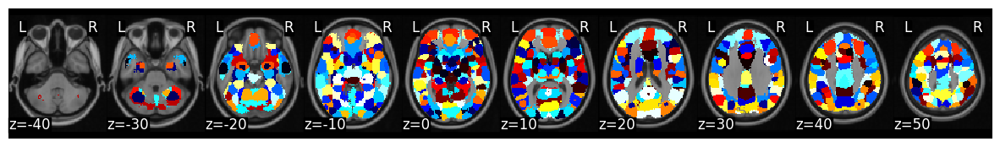

In [4]:
### Mask
maskdir = 'E:\\lxq\\jupyter\\Scripts\\RSA_MVPA\\'
mask = Brain_Data(os.path.join(maskdir,'Neurosynth_Parcellation_2.nii.gz'))
mask.plot()
print(mask)

In [9]:
### Split the mask
mask_all = expand_mask(mask)
print(type(mask_all))

mask_info = glob.glob(os.path.join(maskdir,'mask200_info.csv'))[0]
mask_all.X = pd.read_csv(mask_info)
print(mask_all)

<class 'nltools.data.brain_data.Brain_Data'>
nltools.data.brain_data.Brain_Data(data=(200, 238955), Y=(0, 0), X=(200, 1), mask=MNI152_T1_2mm_brain_mask.nii.gz)


### Behavioral RDM 

In [14]:
subID = data.X['subID'].unique()
subID

array([7001, 7002, 7003, 7004, 7005, 7007, 7008, 7009, 7011, 7012, 7013,
       7014, 7015, 7016, 7017, 7018, 7020, 7022, 7023, 7024, 7025, 7026,
       7027, 7028, 7029, 7030, 7031, 7032, 7033, 7034, 7035, 7036, 7037,
       7038, 7039, 7040, 7041, 7042, 7043, 7044, 7045, 7046, 7047, 7048,
       7049, 7050], dtype=int64)

In [19]:
t_item = 'Intention'

In [42]:
sub7001_data = data[data.X['Subject']==7001]
sub7001_bdata = data.X[data.X['Subject']==7001]
sub7001_bdata[t_item].values.reshape(-1,1)

# sub7001_bdata_np['Guilt'].reshape(-1, 1)

array([[ 32.5],
       [ -8.5],
       [ 35. ],
       [ -2.5],
       [ 32.5],
       [-13.5],
       [ 22. ],
       [-34. ],
       [ 35. ],
       [ -5. ],
       [ 47.5],
       [  5. ]])

In [31]:
sub7001_data

nltools.data.brain_data.Brain_Data(data=(12, 238955), Y=(0, 0), X=(12, 14), mask=MNI152_T1_2mm_brain_mask.nii.gz)

array([[ 0. , 41. ,  2.5, 35. ,  0. , 46. , 10.5, 66.5,  2.5, 37.5, 15. ,
        27.5],
       [41. ,  0. , 43.5,  6. , 41. ,  5. , 30.5, 25.5, 43.5,  3.5, 56. ,
        13.5],
       [ 2.5, 43.5,  0. , 37.5,  2.5, 48.5, 13. , 69. ,  0. , 40. , 12.5,
        30. ],
       [35. ,  6. , 37.5,  0. , 35. , 11. , 24.5, 31.5, 37.5,  2.5, 50. ,
         7.5],
       [ 0. , 41. ,  2.5, 35. ,  0. , 46. , 10.5, 66.5,  2.5, 37.5, 15. ,
        27.5],
       [46. ,  5. , 48.5, 11. , 46. ,  0. , 35.5, 20.5, 48.5,  8.5, 61. ,
        18.5],
       [10.5, 30.5, 13. , 24.5, 10.5, 35.5,  0. , 56. , 13. , 27. , 25.5,
        17. ],
       [66.5, 25.5, 69. , 31.5, 66.5, 20.5, 56. ,  0. , 69. , 29. , 81.5,
        39. ],
       [ 2.5, 43.5,  0. , 37.5,  2.5, 48.5, 13. , 69. ,  0. , 40. , 12.5,
        30. ],
       [37.5,  3.5, 40. ,  2.5, 37.5,  8.5, 27. , 29. , 40. ,  0. , 52.5,
        10. ],
       [15. , 56. , 12.5, 50. , 15. , 61. , 25.5, 81.5, 12.5, 52.5,  0. ,
        42.5],
       [27.5, 13.5, 3

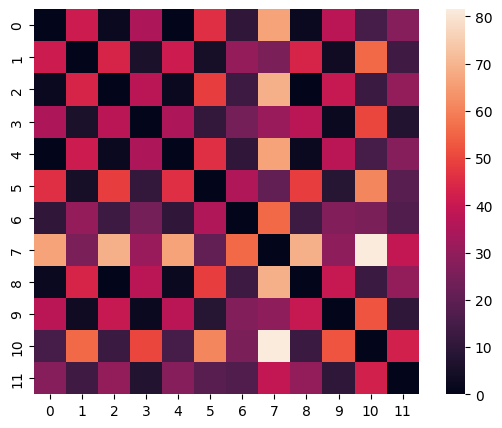

In [21]:
model_dist_1 = Adjacency(pairwise_distances(sub7001_bdata[t_item].values.reshape(-1, 1), metric = 'euclidean'))
model_dist_1.plot()
model_dist_1.squareform()

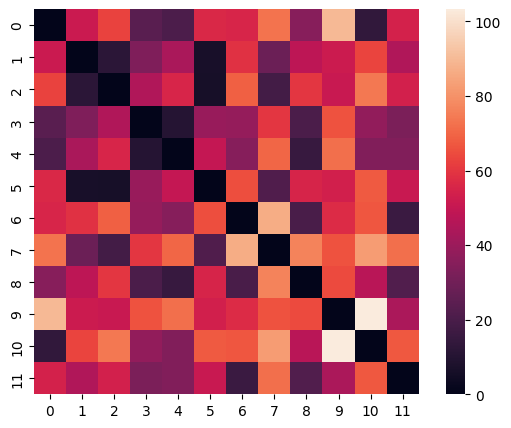

In [18]:
model_dist = Adjacency(pairwise_distances(sub7001_bdata[['Mood','Surprise']], metric = 'euclidean'))
model_dist.plot()

### Conduct RSA 

In [7]:
# For one ROI
ROI_mask = mask_all[mask_all.X['Cluster_num']==1]
masked_data  = sub7001_data.apply_mask(ROI_mask)    
ROI_dist = masked_data.distance(metric = 'correlation')
ROI_dist.plot()
ROI_dist.squareform()

# ROI_dist.squareform()

NameError: name 'mask_all' is not defined

In [15]:
####### all

t_items = ['Gratitude', 'Intention', 'Cost', 'Allocation']
# t_items = ['Cost', 'Allocation']


subID = data.X['subID'].unique()
sub_num = len(subID)
roi_num = 200

results_r = np.zeros((roi_num,sub_num))
results_p = np.zeros((roi_num,sub_num))


for t_item in t_items:
    print(t_item)

    for i,sub in enumerate(subID):
        print (t_item, sub)
        sub_data = data[data.X['subID']==sub]
        sub_bdata = data.X[data.X['subID']==sub]
        
        pair_dist = pairwise_distances(sub_bdata[t_item].values.reshape(-1, 1), metric = 'euclidean')
        pair_dist = (pair_dist + pair_dist.T)/2
        
        model_dist = Adjacency(pair_dist)
        
        bar = progressbar.ProgressBar(maxval=roi_num, widgets=[progressbar.Percentage(), ' ', progressbar.Bar(), ' ', progressbar.Timer()])
        
        # Start the progress bar
        bar.start()
        
        for k in mask_all.X['Cluster_num']:  
            # print (t_item, sub, k)
            ROI_mask = mask_all[mask_all.X['Cluster_num']==k]
            masked_data  =  sub_data.apply_mask(ROI_mask)    
            ROI_dist = masked_data.distance(metric = 'correlation')
            Brain_Beha_corr = ROI_dist.similarity(model_dist,plot = False, n_permute = 1, metric='spearman')

            results_r[k-1,i] = Brain_Beha_corr['correlation']
            # results_p[k-1,i] = Brain_Beha_corr['p']  
            
            bar.update(k)
        
        bar.finish()
    results_r_dir = results_dir + 'WSRSA_'+ t_item + '_200_r_value.txt'
    # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'

    np.savetxt(results_r_dir,results_r)    
    # np.savetxt(results_p_dir,results_p)  

    print(t_item, ' finished!')
    
# t_items = [  'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

Gratitude
Gratitude 7001


100% |##################################################| Elapsed Time: 0:01:31


Gratitude 7002


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7003


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7004


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7005


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7007


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7008


100% |##################################################| Elapsed Time: 0:00:47


Gratitude 7009


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7011


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7012


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7013


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7014


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7015


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7016


100% |##################################################| Elapsed Time: 0:00:41


Gratitude 7017


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7018


100% |##################################################| Elapsed Time: 0:00:41


Gratitude 7020


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7022


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7023


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7024


100% |##################################################| Elapsed Time: 0:00:42


Gratitude 7025


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7026


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7027


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7028


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7029


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7030


100% |##################################################| Elapsed Time: 0:00:43


Gratitude 7031


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7032


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7033


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7034


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7035


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7036


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7037


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7038


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7039


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7040


100% |##################################################| Elapsed Time: 0:00:44


Gratitude 7041


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7042


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7043


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7044


100% |##################################################| Elapsed Time: 0:00:45


Gratitude 7045


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7046


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7047


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7048


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7049


100% |##################################################| Elapsed Time: 0:00:46


Gratitude 7050


100% |##################################################| Elapsed Time: 0:00:47


Gratitude  finished!
Intention
Intention 7001


100% |##################################################| Elapsed Time: 0:00:47


Intention 7002


100% |##################################################| Elapsed Time: 0:00:47


Intention 7003


100% |##################################################| Elapsed Time: 0:00:47


Intention 7004


100% |##################################################| Elapsed Time: 0:00:47


Intention 7005


100% |##################################################| Elapsed Time: 0:00:47


Intention 7007


100% |##################################################| Elapsed Time: 0:00:47


Intention 7008


100% |##################################################| Elapsed Time: 0:00:47


Intention 7009


100% |##################################################| Elapsed Time: 0:00:47


Intention 7011


100% |##################################################| Elapsed Time: 0:00:47


Intention 7012


100% |##################################################| Elapsed Time: 0:00:47


Intention 7013


100% |##################################################| Elapsed Time: 0:00:48


Intention 7014


100% |##################################################| Elapsed Time: 0:00:48


Intention 7015


100% |##################################################| Elapsed Time: 0:00:48


Intention 7016


100% |##################################################| Elapsed Time: 0:00:49


Intention 7017


100% |##################################################| Elapsed Time: 0:00:49


Intention 7018


100% |##################################################| Elapsed Time: 0:00:49


Intention 7020


100% |##################################################| Elapsed Time: 0:00:49


Intention 7022


100% |##################################################| Elapsed Time: 0:00:50


Intention 7023


100% |##################################################| Elapsed Time: 0:00:50


Intention 7024


100% |##################################################| Elapsed Time: 0:00:50


Intention 7025


100% |##################################################| Elapsed Time: 0:00:50


Intention 7026


100% |##################################################| Elapsed Time: 0:00:50


Intention 7027


100% |##################################################| Elapsed Time: 0:00:50


Intention 7028


100% |##################################################| Elapsed Time: 0:00:50


Intention 7029


100% |##################################################| Elapsed Time: 0:00:50


Intention 7030


100% |##################################################| Elapsed Time: 0:00:50


Intention 7031


100% |##################################################| Elapsed Time: 0:00:50


Intention 7032


100% |##################################################| Elapsed Time: 0:00:50


Intention 7033


100% |##################################################| Elapsed Time: 0:00:51


Intention 7034


100% |##################################################| Elapsed Time: 0:00:51


Intention 7035


100% |##################################################| Elapsed Time: 0:00:51


Intention 7036


100% |##################################################| Elapsed Time: 0:00:51


Intention 7037


100% |##################################################| Elapsed Time: 0:00:51


Intention 7038


100% |##################################################| Elapsed Time: 0:00:52


Intention 7039


100% |##################################################| Elapsed Time: 0:00:53


Intention 7040


100% |##################################################| Elapsed Time: 0:00:59


Intention 7041


100% |##################################################| Elapsed Time: 0:00:57


Intention 7042


100% |##################################################| Elapsed Time: 0:00:57


Intention 7043


100% |##################################################| Elapsed Time: 0:00:57


Intention 7044


100% |##################################################| Elapsed Time: 0:00:55


Intention 7045


100% |##################################################| Elapsed Time: 0:00:58


Intention 7046


100% |##################################################| Elapsed Time: 0:00:58


Intention 7047


100% |##################################################| Elapsed Time: 0:00:59


Intention 7048


100% |##################################################| Elapsed Time: 0:00:56


Intention 7049


100% |##################################################| Elapsed Time: 0:00:56


Intention 7050


100% |##################################################| Elapsed Time: 0:00:56


Intention  finished!
Cost
Cost 7001


100% |##################################################| Elapsed Time: 0:00:57


Cost 7002


100% |##################################################| Elapsed Time: 0:00:57


Cost 7003


100% |##################################################| Elapsed Time: 0:00:59


Cost 7004


100% |##################################################| Elapsed Time: 0:00:58


Cost 7005


100% |##################################################| Elapsed Time: 0:00:58


Cost 7007


100% |##################################################| Elapsed Time: 0:00:59


Cost 7008


100% |##################################################| Elapsed Time: 0:00:59


Cost 7009


100% |##################################################| Elapsed Time: 0:01:00


Cost 7011


100% |##################################################| Elapsed Time: 0:01:00


Cost 7012


100% |##################################################| Elapsed Time: 0:00:58


Cost 7013


100% |##################################################| Elapsed Time: 0:00:57


Cost 7014


100% |##################################################| Elapsed Time: 0:00:59


Cost 7015


100% |##################################################| Elapsed Time: 0:00:57


Cost 7016


100% |##################################################| Elapsed Time: 0:00:57


Cost 7017


100% |##################################################| Elapsed Time: 0:00:57


Cost 7018


100% |##################################################| Elapsed Time: 0:00:58


Cost 7020


100% |##################################################| Elapsed Time: 0:00:58


Cost 7022


100% |##################################################| Elapsed Time: 0:01:00


Cost 7023


100% |##################################################| Elapsed Time: 0:01:02


Cost 7024


100% |##################################################| Elapsed Time: 0:01:01


Cost 7025


100% |##################################################| Elapsed Time: 0:01:01


Cost 7026


100% |##################################################| Elapsed Time: 0:01:01


Cost 7027


100% |##################################################| Elapsed Time: 0:01:00


Cost 7028


100% |##################################################| Elapsed Time: 0:01:02


Cost 7029


100% |##################################################| Elapsed Time: 0:01:01


Cost 7030


100% |##################################################| Elapsed Time: 0:01:02


Cost 7031


100% |##################################################| Elapsed Time: 0:01:02


Cost 7032


100% |##################################################| Elapsed Time: 0:01:01


Cost 7033


100% |##################################################| Elapsed Time: 0:01:03


Cost 7034


100% |##################################################| Elapsed Time: 0:01:02


Cost 7035


100% |##################################################| Elapsed Time: 0:01:03


Cost 7036


100% |##################################################| Elapsed Time: 0:01:04


Cost 7037


100% |##################################################| Elapsed Time: 0:01:04


Cost 7038


100% |##################################################| Elapsed Time: 0:01:03


Cost 7039


100% |##################################################| Elapsed Time: 0:01:04


Cost 7040


100% |##################################################| Elapsed Time: 0:01:03


Cost 7041


100% |##################################################| Elapsed Time: 0:01:04


Cost 7042


100% |##################################################| Elapsed Time: 0:01:04


Cost 7043


100% |##################################################| Elapsed Time: 0:01:04


Cost 7044


100% |##################################################| Elapsed Time: 0:01:03


Cost 7045


100% |##################################################| Elapsed Time: 0:01:05


Cost 7046


100% |##################################################| Elapsed Time: 0:01:05


Cost 7047


100% |##################################################| Elapsed Time: 0:01:07


Cost 7048


100% |##################################################| Elapsed Time: 0:01:05


Cost 7049


100% |##################################################| Elapsed Time: 0:01:07


Cost 7050


100% |##################################################| Elapsed Time: 0:01:04


Cost  finished!
Allocation
Allocation 7001


100% |##################################################| Elapsed Time: 0:01:04


Allocation 7002


100% |##################################################| Elapsed Time: 0:01:04


Allocation 7003


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7004


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7005


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7007


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7008


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7009


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7011


100% |##################################################| Elapsed Time: 0:01:05


Allocation 7012


100% |##################################################| Elapsed Time: 0:01:06


Allocation 7013


100% |##################################################| Elapsed Time: 0:01:06


Allocation 7014


100% |##################################################| Elapsed Time: 0:01:06


Allocation 7015


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7016


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7017


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7018


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7020


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7022


100% |##################################################| Elapsed Time: 0:01:07


Allocation 7023


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7024


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7025


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7026


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7027


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7028


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7029


100% |##################################################| Elapsed Time: 0:01:08


Allocation 7030


100% |##################################################| Elapsed Time: 0:01:09


Allocation 7031


100% |##################################################| Elapsed Time: 0:01:09


Allocation 7032


100% |##################################################| Elapsed Time: 0:01:09


Allocation 7033


100% |##################################################| Elapsed Time: 0:01:09


Allocation 7034


100% |##################################################| Elapsed Time: 0:01:09


Allocation 7035


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7036


100% |##################################################| Elapsed Time: 0:01:10


Allocation 7037


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7038


100% |##################################################| Elapsed Time: 0:01:10


Allocation 7039


100% |##################################################| Elapsed Time: 0:01:10


Allocation 7040


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7041


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7042


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7043


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7044


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7045


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7046


100% |##################################################| Elapsed Time: 0:01:11


Allocation 7047


100% |##################################################| Elapsed Time: 0:01:12


Allocation 7048


100% |##################################################| Elapsed Time: 0:01:12


Allocation 7049


100% |##################################################| Elapsed Time: 0:01:12


Allocation 7050


Allocation  finished!


In [142]:
np.savetxt(os.path.join(results_dir,'WSRSA_Intention_200_r_value.txt'),results_r)    
# np.savetxt(os.path.join(results_dir,'Withinsubject_RSA_Intention_200_p_value.txt'),results_p)  

In [143]:
results_r = np.loadtxt(os.path.join(results_dir,'WSRSA_Intention_200_r_value.txt'),delimiter = ' ', skiprows = 0)
# results_p = np.loadtxt(os.path.join(results_dir,'Withinsubject_RSA_Intention_200_p_value.txt'),delimiter = ' ', skiprows = 0)

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\image\resampling.py:756: UserWarning: Casting data from int32 to float32
  return resample_img(
c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\image\resampling.py:293: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(
c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



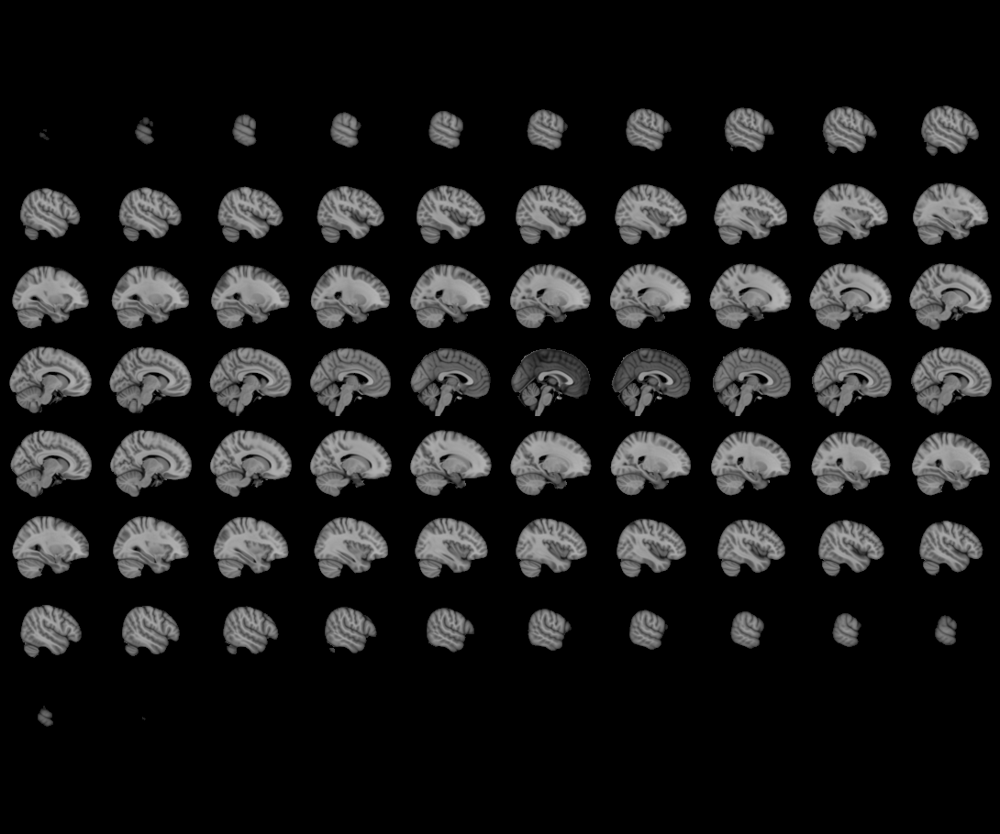
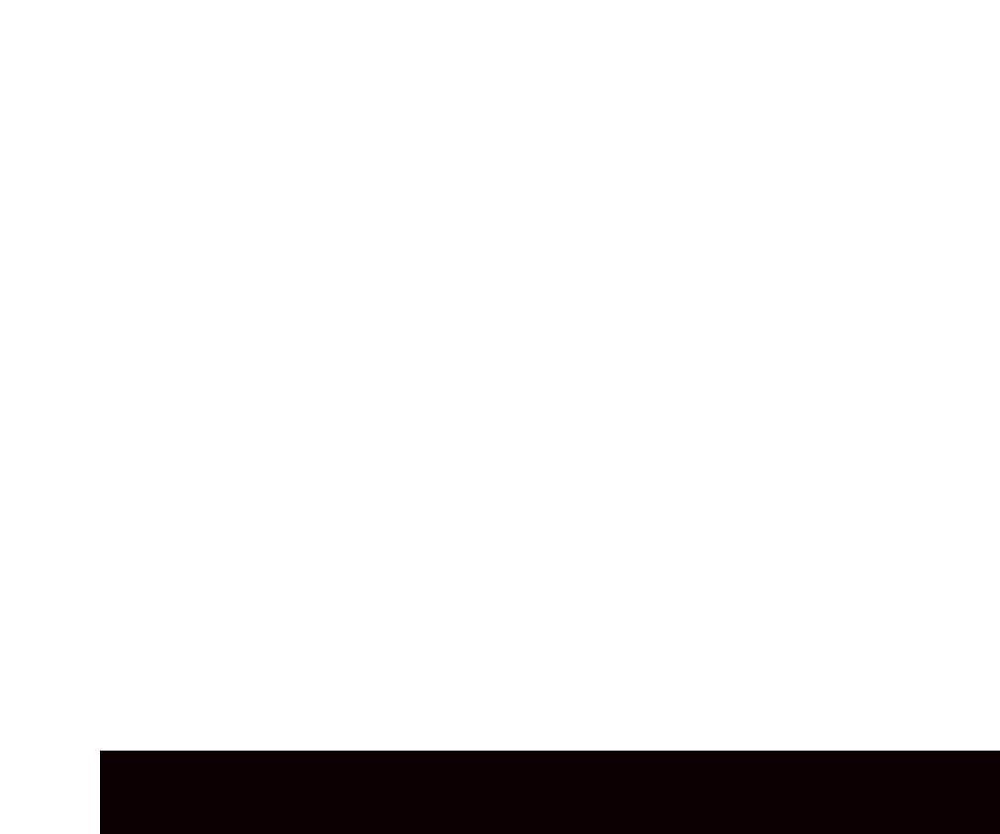

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [26]:
mask_all[116].iplot()

###  Significance test

In [16]:
from nltools.stats import fdr, threshold, fisher_r_to_z, one_sample_permutation

nltools.data.brain_data.Brain_Data(data=(238955,), Y=(0, 0), X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)
<class 'nltools.data.brain_data.Brain_Data'>
nltools.data.brain_data.Brain_Data(data=(200, 238955), Y=(0, 0), X=(200, 1), mask=MNI152_T1_2mm_brain_mask.nii.gz)


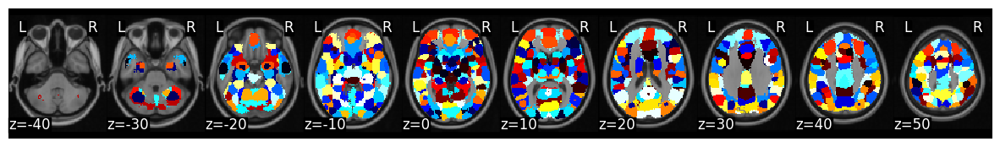

In [17]:
### Mask
maskdir = 'E:\\lxq\\jupyter\\Scripts\\RSA_MVPA\\'
mask = Brain_Data(os.path.join(maskdir,'Neurosynth_Parcellation_2.nii.gz'))
mask.plot()
print(mask)

### Split the mask
mask_all = expand_mask(mask)
print(type(mask_all))

mask_info = glob.glob(os.path.join(maskdir,'mask200_info.csv'))[0]
mask_all.X = pd.read_csv(mask_info)
print(mask_all)

In [29]:
print(mask_all)

nltools.data.brain_data.Brain_Data(data=(200, 238955), Y=(0, 0), X=(200, 1), mask=MNI152_T1_2mm_brain_mask.nii.gz)


Cost 20  (sig)


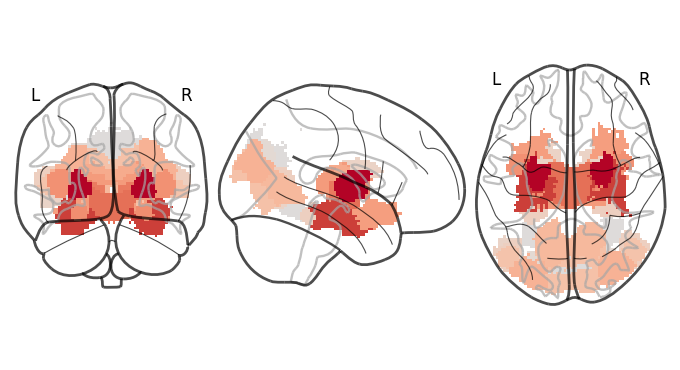

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Intention 31  (sig)


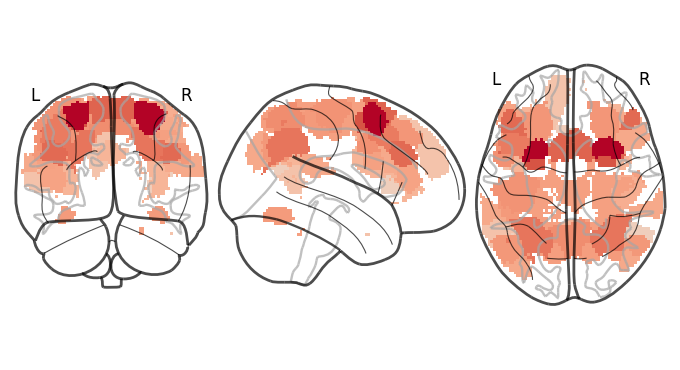

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Allocation 1  (sig)


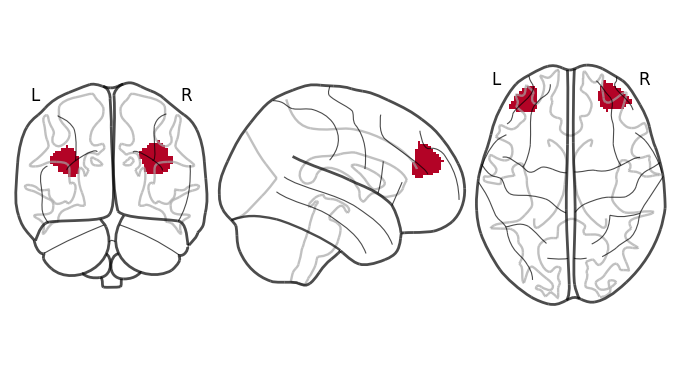

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Gratitude 23  (sig)


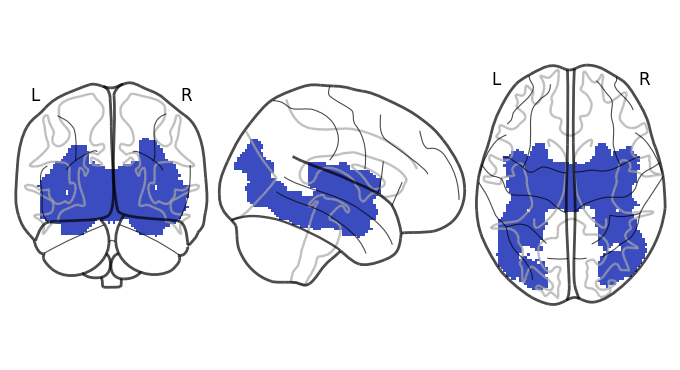

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [12]:
# ### bf 10000

# threshold_list = []
# rsa_p_list = []

# t_items = [ 'Cost', 'Intention', 'Allocation', 'Gratitude'] 

# for t_item in t_items:
#     rsa_stats = []

#     results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
#     # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
#     results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
#     # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

#     for k in mask_all.X['Cluster_num']:
#         rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=10000))

#     rsa_p_list.append(rsa_stats)
    
#     # 将字典写入CSV文件
#     csv_file_path = results_dir + t_item + '_r_p.csv'
    
#     # 将列表转换为 DataFrame
#     rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
#     rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
#     count = sum(1 for x in rsa_stats if x['p'] <= 0.00025)
#     print(t_item, count, " (sig)")

#     rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
#     rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

#     thresholded = threshold(rsa_r, rsa_p, thr=0.00025)

#     plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

#     thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_bf.nii.gz')))

#     thresholded.iplot()
    
#     threshold_list.append(thresholded)
    
#     # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

In [19]:
results_r_dir

'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\20241012_rsa_12Onset\\WSRSA_condition_results_20241012_12Onset\\Withinsubject_RSA_Intention_200_r_value.txt'

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



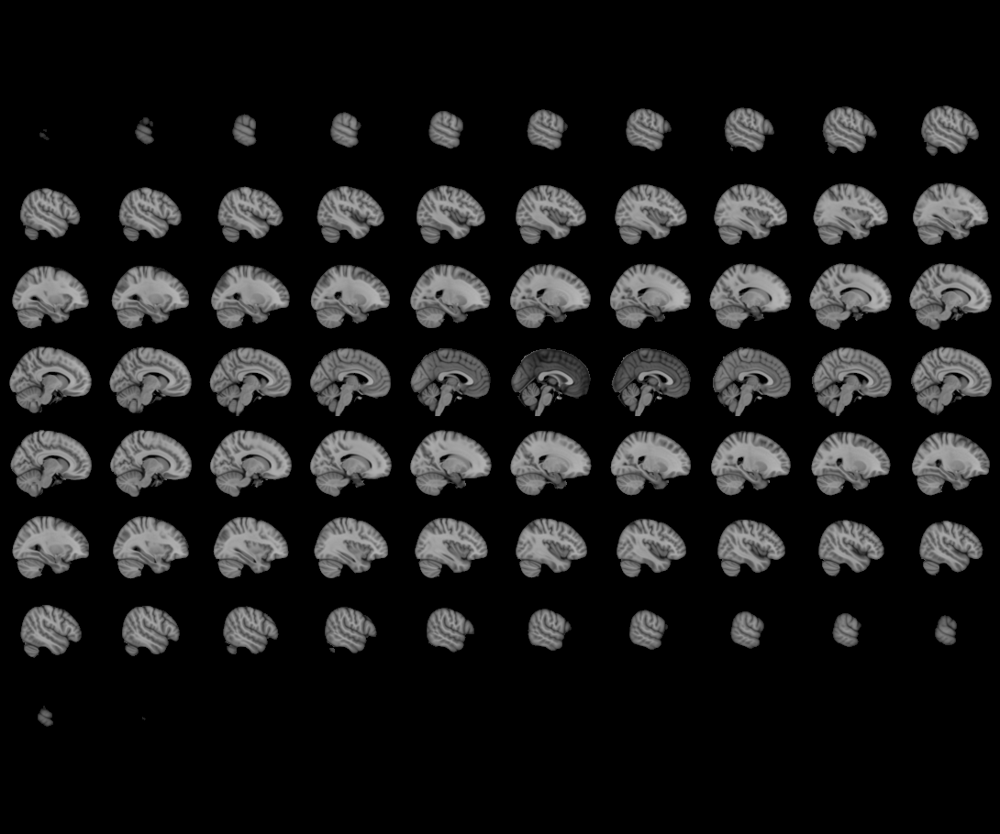
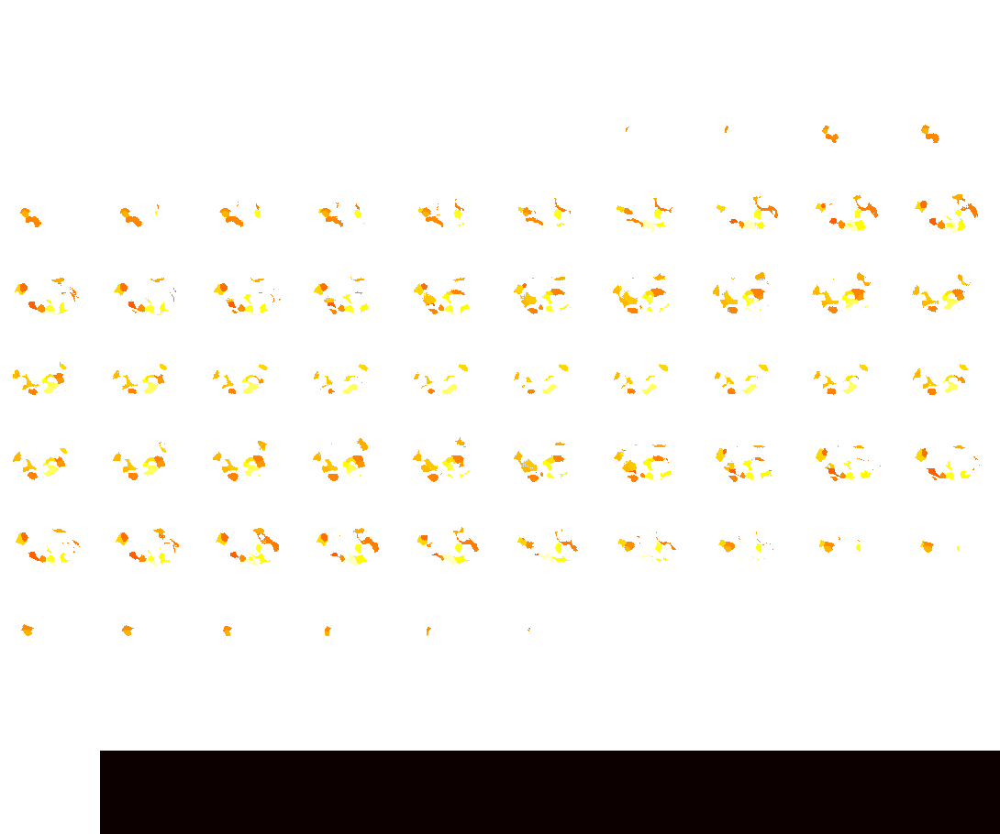

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [20]:
### bf permutation 100000
threshold_list = []
rsa_p_list = []

t_items = ['Allocation', 'Gratitude', 'Intention', 'Cost'] 

for t_item in t_items:
    rsa_stats = []

    results_r_dir = results_dir + 'WSRSA_'+ t_item + '_200_r_value.txt'
    # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
    results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
    # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

    for k in mask_all.X['Cluster_num']:
        rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=100000))

    rsa_p_list.append(rsa_stats)
    
    # 将字典写入CSV文件
    csv_file_path = results_dir + t_item + '_r_p_100000_241103.csv'
    
    # 将列表转换为 DataFrame
    rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
    rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
    count = sum(1 for x in rsa_stats if x['p'] <= 0.00025)
    print(t_item, count, " (sig)")

    rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
    rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

    thresholded = threshold(rsa_r, rsa_p, thr=0.00025)

    plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

    thresholded.write(os.path.join(results_dir,str('WSRSA_' + t_item + '_200_bf_100000_241103.nii.gz')))

    thresholded.iplot()
    
    threshold_list.append(thresholded)
    
    # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

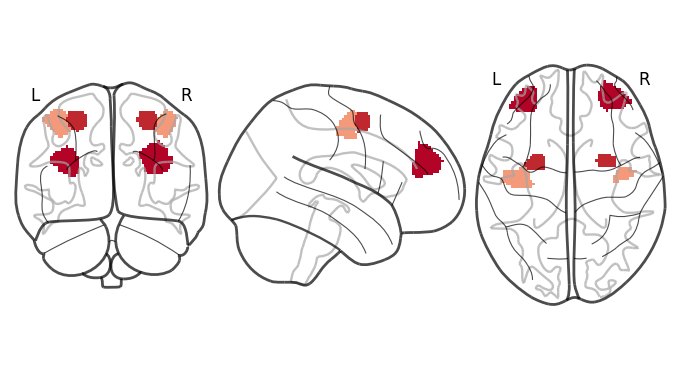

In [5]:
thresholded = Brain_Data(os.path.join(results_dir,str('WSRSA_Allocation_200_bf_100000_241103.nii.gz')))

plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



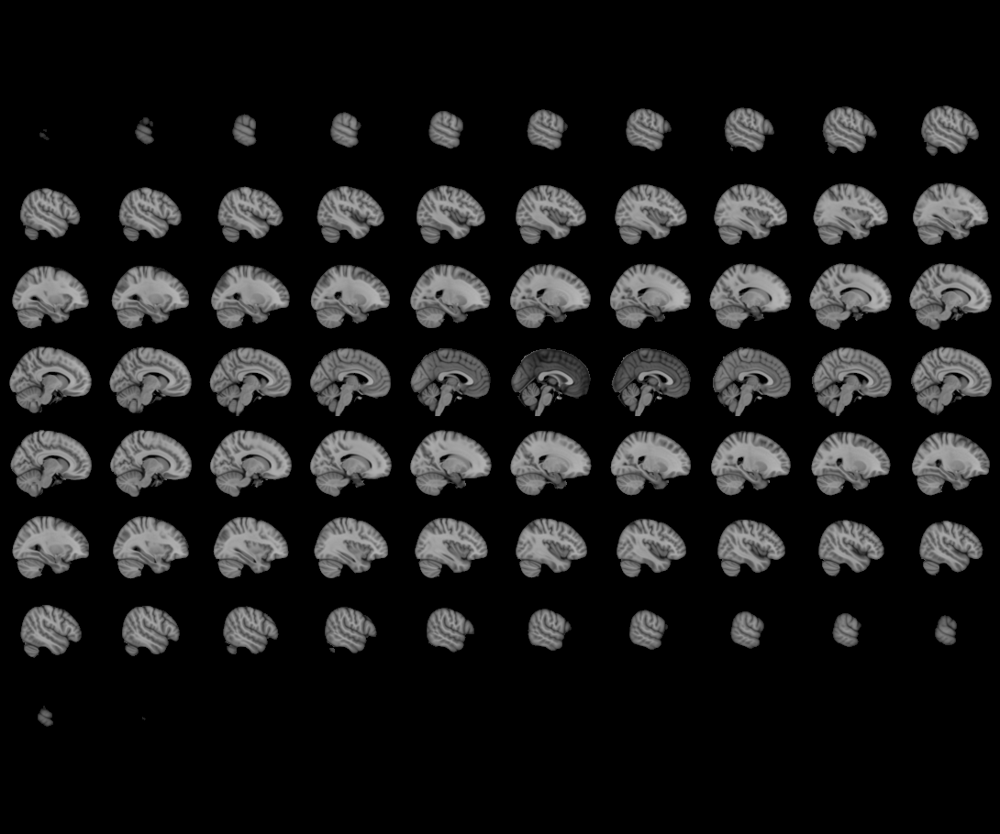
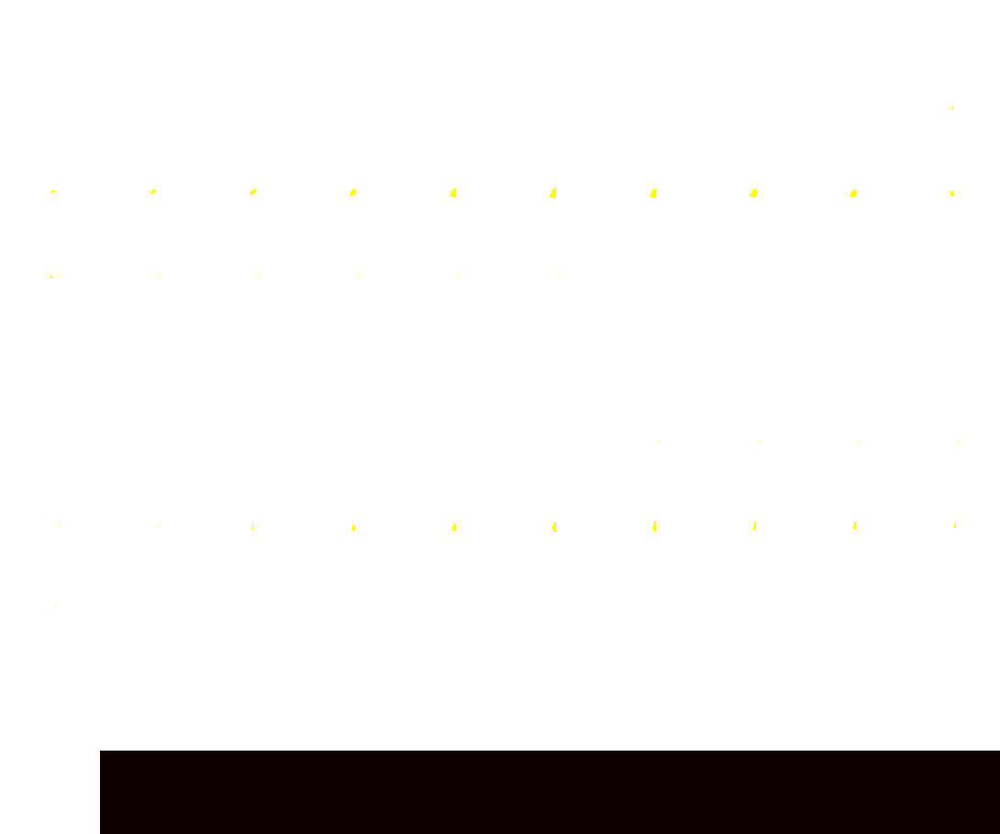

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [6]:
thresholded.iplot()

c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\image\resampling.py:756: UserWarning: Casting data from int32 to float32
  return resample_img(
c:\users\cbcs\appdata\local\programs\python\python38\lib\site-packages\nilearn\image\resampling.py:293: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(



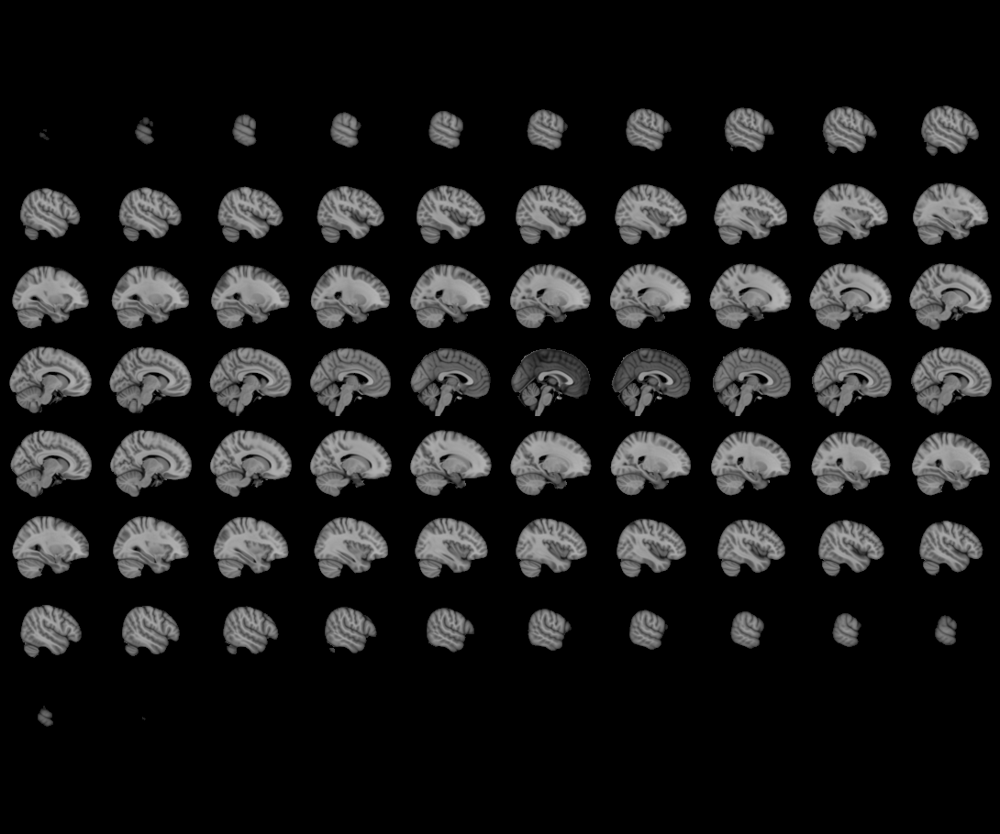
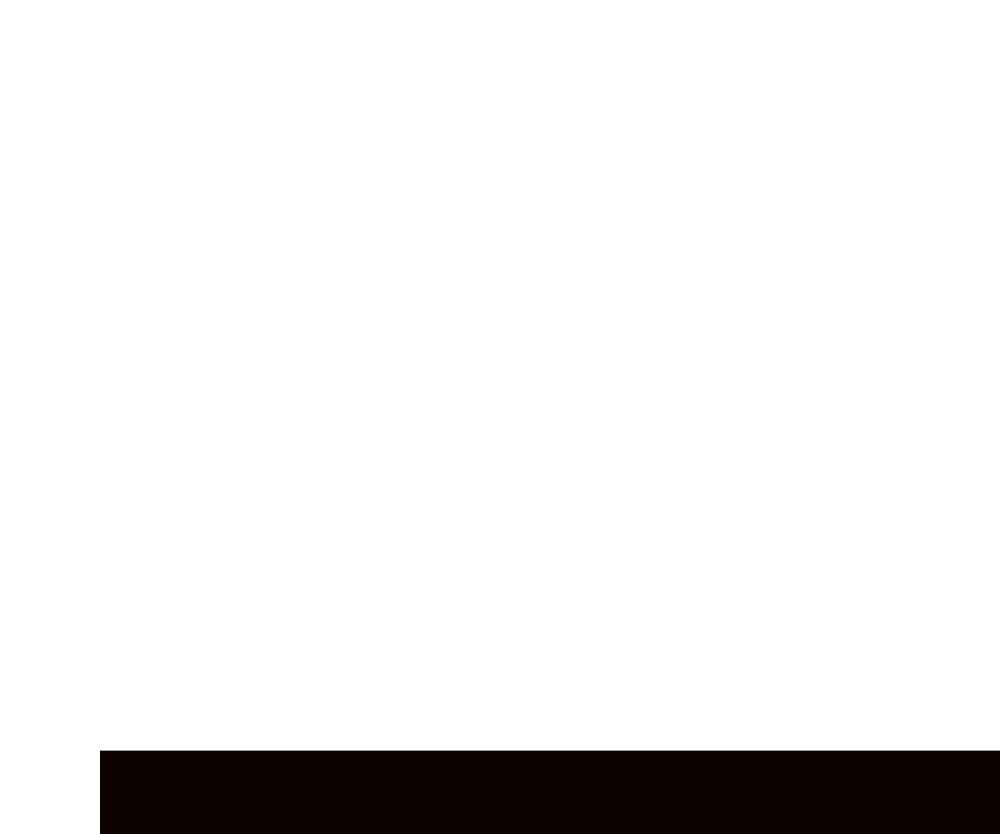

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [10]:
mask_all[10].iplot()

Cost 95  (sig)


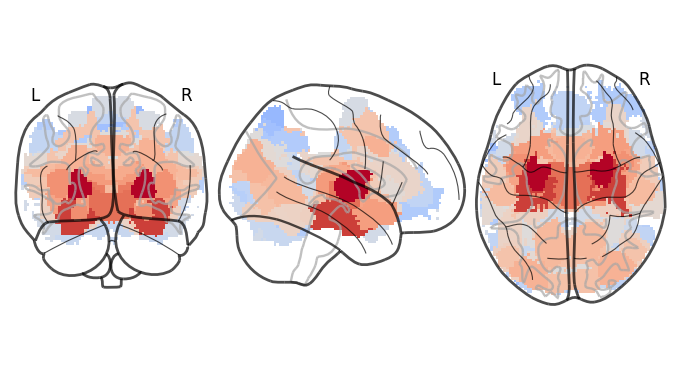

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Intention 136  (sig)


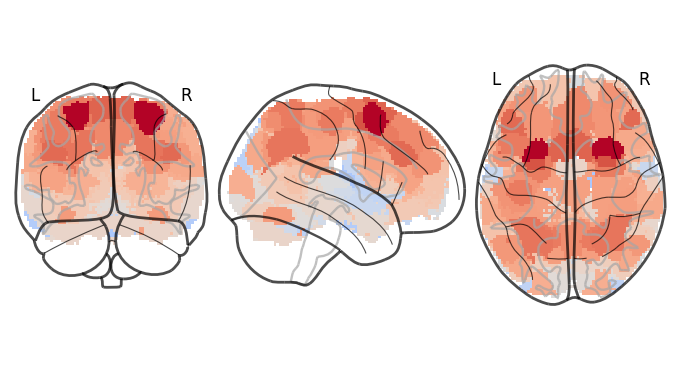

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Allocation 4  (sig)


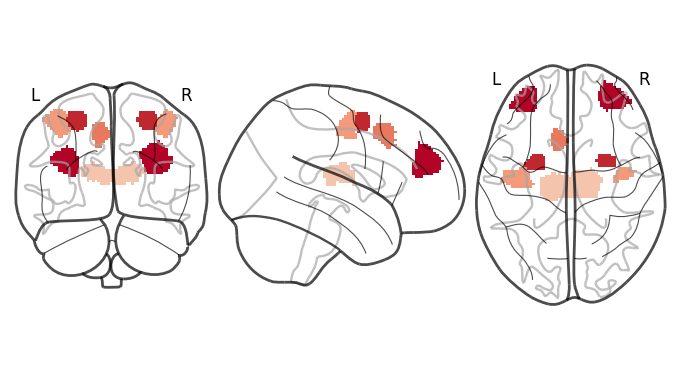

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Gratitude 47  (sig)


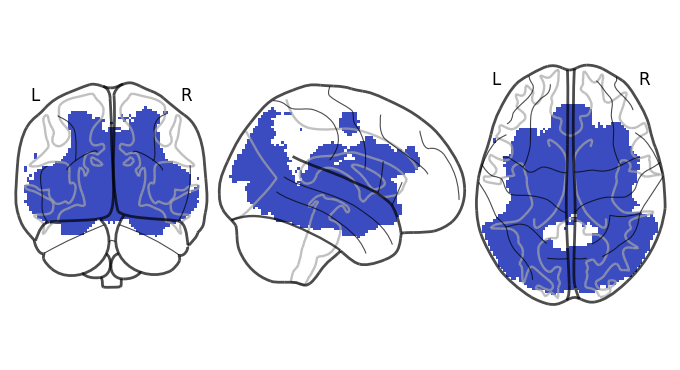

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [7]:
# ### fdr 10000

# threshold_list = []
# rsa_p_list = []

# t_items = [ 'Cost', 'Intention', 'Allocation', 'Gratitude'] 

# for t_item in t_items:
#     rsa_stats = []

#     results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
#     # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
#     results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
#     # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

#     for k in mask_all.X['Cluster_num']:
#         rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=10000))

#     rsa_p_list.append(rsa_stats)
    
#     fdr_p = fdr(np.array([x['p'] for x in rsa_stats]), q=0.05)
    
#     # 将字典写入CSV文件
#     csv_file_path = results_dir + t_item + '_fdr_r_p.csv'
    
#     # 将列表转换为 DataFrame
#     rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
#     rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
#     count = sum(1 for x in rsa_stats if x['p'] <= fdr_p)
#     print(t_item, count, " (sig)")

#     rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
#     rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

#     thresholded = threshold(rsa_r, rsa_p, thr=fdr_p)

#     plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

#     thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_fdr.nii.gz')))

#     thresholded.iplot()
    
#     threshold_list.append(thresholded)
    
#     # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

Cost 95  (sig)


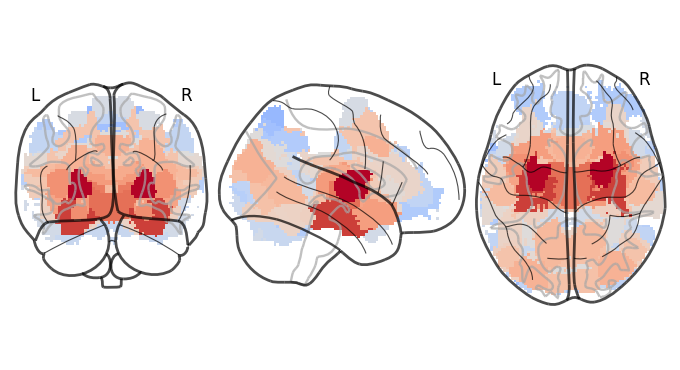

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Intention 139  (sig)


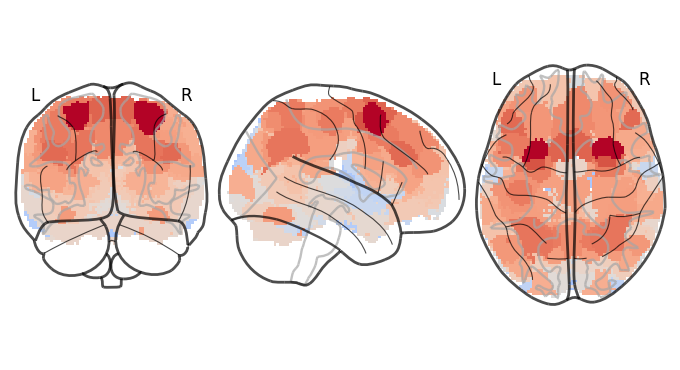

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Allocation 4  (sig)


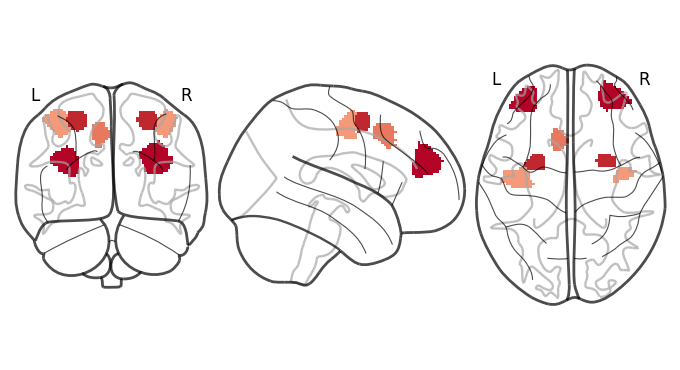

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Gratitude 47  (sig)


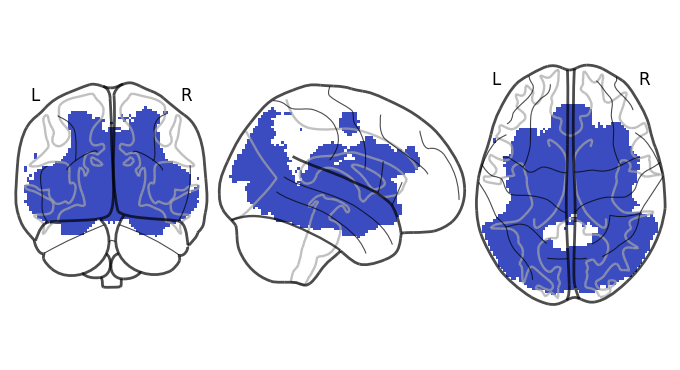

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [10]:
# ### fdr permutation 100000

# threshold_list = []
# rsa_p_list = []

# t_items = [ 'Cost', 'Intention', 'Allocation', 'Gratitude'] 

# for t_item in t_items:
#     rsa_stats = []

#     results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
#     # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
#     results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
#     # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

#     for k in mask_all.X['Cluster_num']:
#         rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=100000))

#     rsa_p_list.append(rsa_stats)
    
#     fdr_p = fdr(np.array([x['p'] for x in rsa_stats]), q=0.05)
    
#     # 将字典写入CSV文件
#     csv_file_path = results_dir + t_item + '_fdr_r_p_100000.csv'
    
#     # 将列表转换为 DataFrame
#     rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
#     rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
#     count = sum(1 for x in rsa_stats if x['p'] <= fdr_p)
#     print(t_item, count, " (sig)")

#     rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
#     rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

#     thresholded = threshold(rsa_r, rsa_p, thr=fdr_p)

#     plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

#     thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_fdr_100000.nii.gz')))

#     thresholded.iplot()
    
#     threshold_list.append(thresholded)
    
#     # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

c:\software\python38\lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Cost 22  (sig)


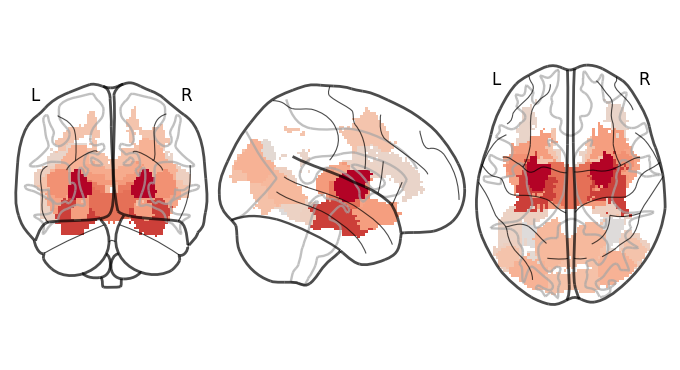

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Intention 31  (sig)


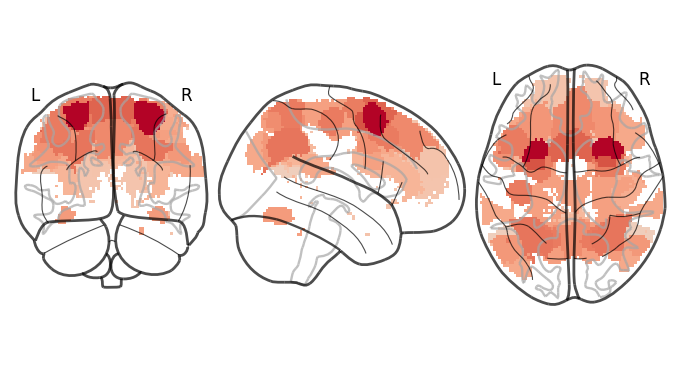

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Allocation 2  (sig)


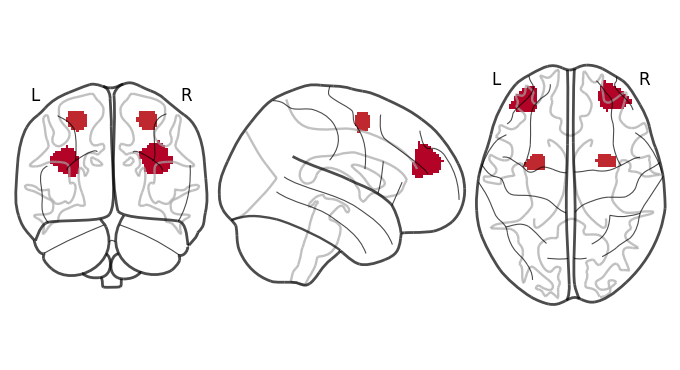

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Gratitude 20  (sig)


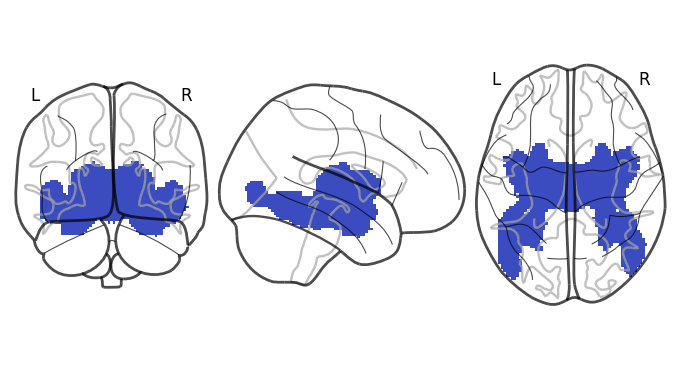

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [8]:
# ## test bf 10000

# threshold_list = []
# rsa_p_list = []

# t_items = [ 'Cost', 'Intention', 'Allocation', 'Gratitude'] 

# for t_item in t_items:
#     rsa_stats = []

#     results_r_dir = 'D:\\LXQ_fMRI\\LiuXuqi_CMF\\04_RSA\\20240118_RSA_12Onset\\WSRSA_condition_results_20240118_12Onset\\' + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
#     # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
#     results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
#     # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

#     for k in mask_all.X['Cluster_num']:
#         rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=10000))

#     rsa_p_list.append(rsa_stats)
    
#     # 将字典写入CSV文件
#     csv_file_path = results_dir + t_item + '_r_p_test0118.csv'
    
#     # 将列表转换为 DataFrame
#     rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
#     rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
#     count = sum(1 for x in rsa_stats if x['p'] <= 0.00025)
#     print(t_item, count, " (sig)")

#     rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
#     rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

#     thresholded = threshold(rsa_r, rsa_p, thr=0.00025)

#     plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

#     thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_bf_test0118.nii.gz')))

#     thresholded.iplot()
    
#     threshold_list.append(thresholded)
    
#     # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

Cost 25  (sig)


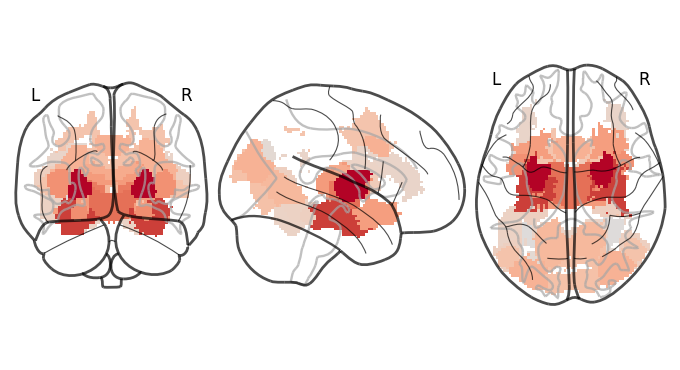

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Intention 38  (sig)


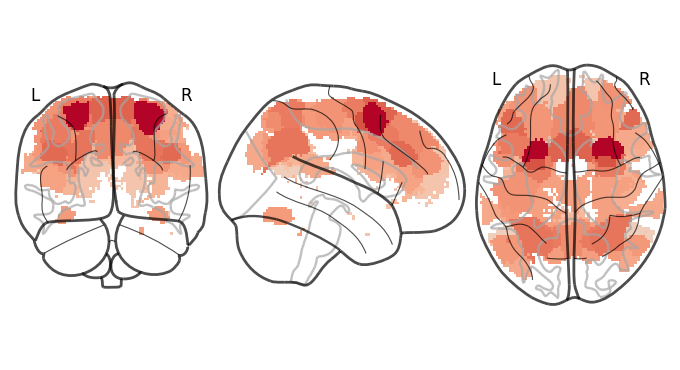

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Allocation 1  (sig)


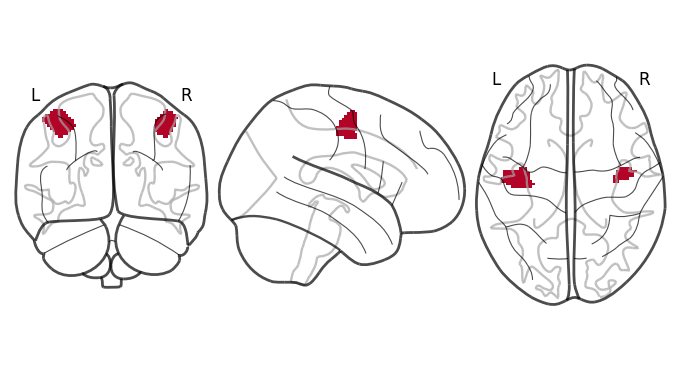

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Gratitude 22  (sig)


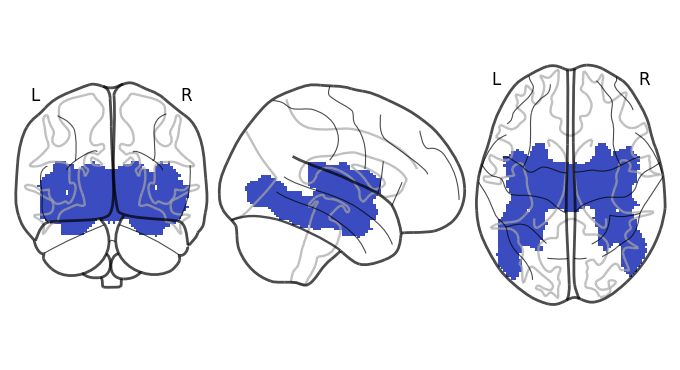

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [11]:
# ## test bf permutation 100000

# threshold_list = []
# rsa_p_list = []

# t_items = [ 'Cost', 'Intention', 'Allocation', 'Gratitude'] 

# for t_item in t_items:
#     rsa_stats = []

#     results_r_dir = 'D:\\LXQ_fMRI\\LiuXuqi_CMF\\04_RSA\\20240118_RSA_12Onset\\WSRSA_condition_results_20240118_12Onset\\' + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
#     # results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
#     results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
#     # results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

#     for k in mask_all.X['Cluster_num']:
#         rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=100000))

#     rsa_p_list.append(rsa_stats)
    
#     # 将字典写入CSV文件
#     csv_file_path = results_dir + t_item + '_r_p_test0118_100000.csv'
    
#     # 将列表转换为 DataFrame
#     rsa_stats_df = pd.DataFrame(rsa_stats, columns=["mean", "p"])
    
#     rsa_stats_df.to_csv(csv_file_path, index = False)
    
    
#     count = sum(1 for x in rsa_stats if x['p'] <= 0.00025)
#     print(t_item, count, " (sig)")

#     rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
#     rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

#     thresholded = threshold(rsa_r, rsa_p, thr=0.00025)

#     plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

#     thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_bf_test0118_100000.nii.gz')))

#     thresholded.iplot()
    
#     threshold_list.append(thresholded)
    
#     # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

In [144]:
# from nltools.stats import fdr, threshold, fisher_r_to_z, one_sample_permutation

# rsa_stats = []

# n_permute = 10000

# # 创建一个进度条
# bar = progressbar.ProgressBar(max_value = 200)
# for k in mask_all.X['Cluster_num']:
    
#     rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(np.array(results_r[k-1,:]))),n_permute=n_permute))
    
#     bar.update(k)

100% (200 of 200) |######################| Elapsed Time: 0:01:11 ETA:  00:00:00

0.027497250274972504


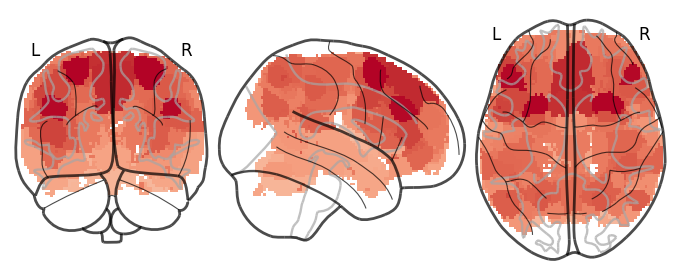

In [146]:
# fdr_p = fdr(np.array([x['p'] for x in rsa_stats]), q=0.05)
# print(fdr_p)

# rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
# rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

# thresholded = threshold(rsa_r, rsa_p, thr=fdr_p)

# plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

## Formal Use

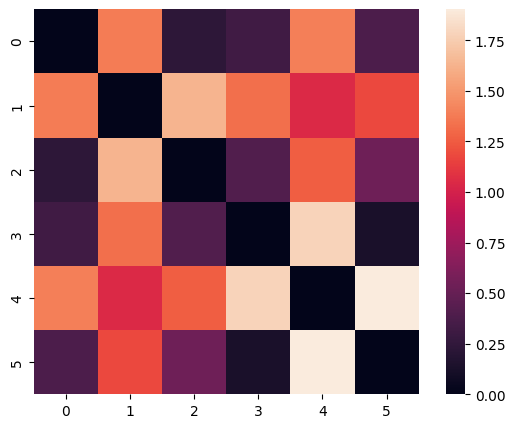

In [18]:
# For one ROI
ROI_mask = mask_all[mask_all.X['Cluster_num']==1]
masked_data  = sub7001_data.apply_mask(ROI_mask)    
ROI_dist = masked_data.distance(metric = 'correlation')
ROI_dist.plot()

In [20]:
print(mask_all.X['Cluster_num'])

0        1
1        2
2        3
3        4
4        5
      ... 
195    196
196    197
197    198
198    199
199    200
Name: Cluster_num, Length: 200, dtype: int64


In [28]:
# print(sub7001_bdata[t_item])
# print(ROI_dist.squareform())
# ROI_dist.plot()
print(len(model_dist.squareform()))
print(masked_data.data)

12
[[ 0.9595054   2.4449654   3.3287268  ...  5.4048676   4.5955715
   3.8761845 ]
 [ 1.0325725   1.6355785   1.1496806  ... -1.014704    0.0193834
  -1.6423075 ]
 [ 0.51909673  2.8600595   4.727964   ...  1.7114731   1.1990632
   0.8450667 ]
 ...
 [-2.3786125  -0.519389    0.02645831 ... -0.22826993  0.24137563
   0.16394904]
 [ 1.9160557   2.8952267   3.1325855  ...  2.3328123   1.893187
   1.7935088 ]
 [ 0.37021866  1.5298498   1.2032344  ...  4.1236167   3.58987
   3.1461308 ]]


Reeval
Reeval 7001
Reeval 7001 1
Reeval 7001 2
Reeval 7001 3
Reeval 7001 4
Reeval 7001 5
Reeval 7001 6
Reeval 7001 7
Reeval 7001 8
Reeval 7001 9
Reeval 7001 10
Reeval 7001 11
Reeval 7001 12
Reeval 7001 13
Reeval 7001 14
Reeval 7001 15
Reeval 7001 16
Reeval 7001 17
Reeval 7001 18
Reeval 7001 19
Reeval 7001 20
Reeval 7001 21
Reeval 7001 22
Reeval 7001 23
Reeval 7001 24
Reeval 7001 25
Reeval 7001 26
Reeval 7001 27
Reeval 7001 28
Reeval 7001 29
Reeval 7001 30
Reeval 7001 31
Reeval 7001 32
Reeval 7001 33
Reeval 7001 34
Reeval 7001 35
Reeval 7001 36
Reeval 7001 37
Reeval 7001 38
Reeval 7001 39
Reeval 7001 40
Reeval 7001 41
Reeval 7001 42
Reeval 7001 43
Reeval 7001 44
Reeval 7001 45
Reeval 7001 46
Reeval 7001 47
Reeval 7001 48
Reeval 7001 49
Reeval 7001 50
Reeval 7001 51
Reeval 7001 52
Reeval 7001 53
Reeval 7001 54
Reeval 7001 55
Reeval 7001 56
Reeval 7001 57
Reeval 7001 58
Reeval 7001 59
Reeval 7001 60
Reeval 7001 61
Reeval 7001 62
Reeval 7001 63
Reeval 7001 64
Reeval 7001 65
Reeval 7001 66


Reeval 7003 131
Reeval 7003 132
Reeval 7003 133
Reeval 7003 134
Reeval 7003 135
Reeval 7003 136
Reeval 7003 137
Reeval 7003 138
Reeval 7003 139
Reeval 7003 140
Reeval 7003 141
Reeval 7003 142
Reeval 7003 143
Reeval 7003 144
Reeval 7003 145
Reeval 7003 146
Reeval 7003 147
Reeval 7003 148
Reeval 7003 149
Reeval 7003 150
Reeval 7003 151
Reeval 7003 152
Reeval 7003 153
Reeval 7003 154
Reeval 7003 155
Reeval 7003 156
Reeval 7003 157
Reeval 7003 158
Reeval 7003 159
Reeval 7003 160
Reeval 7003 161
Reeval 7003 162
Reeval 7003 163
Reeval 7003 164
Reeval 7003 165
Reeval 7003 166
Reeval 7003 167
Reeval 7003 168
Reeval 7003 169
Reeval 7003 170
Reeval 7003 171
Reeval 7003 172
Reeval 7003 173
Reeval 7003 174
Reeval 7003 175
Reeval 7003 176
Reeval 7003 177
Reeval 7003 178
Reeval 7003 179
Reeval 7003 180
Reeval 7003 181
Reeval 7003 182
Reeval 7003 183
Reeval 7003 184
Reeval 7003 185
Reeval 7003 186
Reeval 7003 187
Reeval 7003 188
Reeval 7003 189
Reeval 7003 190
Reeval 7003 191
Reeval 7003 192
Reeval 7

Reeval 7007 59
Reeval 7007 60
Reeval 7007 61
Reeval 7007 62
Reeval 7007 63
Reeval 7007 64
Reeval 7007 65
Reeval 7007 66
Reeval 7007 67
Reeval 7007 68
Reeval 7007 69
Reeval 7007 70
Reeval 7007 71
Reeval 7007 72
Reeval 7007 73
Reeval 7007 74
Reeval 7007 75
Reeval 7007 76
Reeval 7007 77
Reeval 7007 78
Reeval 7007 79
Reeval 7007 80
Reeval 7007 81
Reeval 7007 82
Reeval 7007 83
Reeval 7007 84
Reeval 7007 85
Reeval 7007 86
Reeval 7007 87
Reeval 7007 88
Reeval 7007 89
Reeval 7007 90
Reeval 7007 91
Reeval 7007 92
Reeval 7007 93
Reeval 7007 94
Reeval 7007 95
Reeval 7007 96
Reeval 7007 97
Reeval 7007 98
Reeval 7007 99
Reeval 7007 100
Reeval 7007 101
Reeval 7007 102
Reeval 7007 103
Reeval 7007 104
Reeval 7007 105
Reeval 7007 106
Reeval 7007 107
Reeval 7007 108
Reeval 7007 109
Reeval 7007 110
Reeval 7007 111
Reeval 7007 112
Reeval 7007 113
Reeval 7007 114
Reeval 7007 115
Reeval 7007 116
Reeval 7007 117
Reeval 7007 118
Reeval 7007 119
Reeval 7007 120
Reeval 7007 121
Reeval 7007 122
Reeval 7007 123
R

Reeval 7009 186
Reeval 7009 187
Reeval 7009 188
Reeval 7009 189
Reeval 7009 190
Reeval 7009 191
Reeval 7009 192
Reeval 7009 193
Reeval 7009 194
Reeval 7009 195
Reeval 7009 196
Reeval 7009 197
Reeval 7009 198
Reeval 7009 199
Reeval 7009 200
Reeval 7011
Reeval 7011 1
Reeval 7011 2
Reeval 7011 3
Reeval 7011 4
Reeval 7011 5
Reeval 7011 6
Reeval 7011 7
Reeval 7011 8
Reeval 7011 9
Reeval 7011 10
Reeval 7011 11
Reeval 7011 12
Reeval 7011 13
Reeval 7011 14
Reeval 7011 15
Reeval 7011 16
Reeval 7011 17
Reeval 7011 18
Reeval 7011 19
Reeval 7011 20
Reeval 7011 21
Reeval 7011 22
Reeval 7011 23
Reeval 7011 24
Reeval 7011 25
Reeval 7011 26
Reeval 7011 27
Reeval 7011 28
Reeval 7011 29
Reeval 7011 30
Reeval 7011 31
Reeval 7011 32
Reeval 7011 33
Reeval 7011 34
Reeval 7011 35
Reeval 7011 36
Reeval 7011 37
Reeval 7011 38
Reeval 7011 39
Reeval 7011 40
Reeval 7011 41
Reeval 7011 42
Reeval 7011 43
Reeval 7011 44
Reeval 7011 45
Reeval 7011 46
Reeval 7011 47
Reeval 7011 48
Reeval 7011 49
Reeval 7011 50
Reeval 

Reeval 7013 117
Reeval 7013 118
Reeval 7013 119
Reeval 7013 120
Reeval 7013 121
Reeval 7013 122
Reeval 7013 123
Reeval 7013 124
Reeval 7013 125
Reeval 7013 126
Reeval 7013 127
Reeval 7013 128
Reeval 7013 129
Reeval 7013 130
Reeval 7013 131
Reeval 7013 132
Reeval 7013 133
Reeval 7013 134
Reeval 7013 135
Reeval 7013 136
Reeval 7013 137
Reeval 7013 138
Reeval 7013 139
Reeval 7013 140
Reeval 7013 141
Reeval 7013 142
Reeval 7013 143
Reeval 7013 144
Reeval 7013 145
Reeval 7013 146
Reeval 7013 147
Reeval 7013 148
Reeval 7013 149
Reeval 7013 150
Reeval 7013 151
Reeval 7013 152
Reeval 7013 153
Reeval 7013 154
Reeval 7013 155
Reeval 7013 156
Reeval 7013 157
Reeval 7013 158
Reeval 7013 159
Reeval 7013 160
Reeval 7013 161
Reeval 7013 162
Reeval 7013 163
Reeval 7013 164
Reeval 7013 165
Reeval 7013 166
Reeval 7013 167
Reeval 7013 168
Reeval 7013 169
Reeval 7013 170
Reeval 7013 171
Reeval 7013 172
Reeval 7013 173
Reeval 7013 174
Reeval 7013 175
Reeval 7013 176
Reeval 7013 177
Reeval 7013 178
Reeval 7

Reeval 7016 44
Reeval 7016 45
Reeval 7016 46
Reeval 7016 47
Reeval 7016 48
Reeval 7016 49
Reeval 7016 50
Reeval 7016 51
Reeval 7016 52
Reeval 7016 53
Reeval 7016 54
Reeval 7016 55
Reeval 7016 56
Reeval 7016 57
Reeval 7016 58
Reeval 7016 59
Reeval 7016 60
Reeval 7016 61
Reeval 7016 62
Reeval 7016 63
Reeval 7016 64
Reeval 7016 65
Reeval 7016 66
Reeval 7016 67
Reeval 7016 68
Reeval 7016 69
Reeval 7016 70
Reeval 7016 71
Reeval 7016 72
Reeval 7016 73
Reeval 7016 74
Reeval 7016 75
Reeval 7016 76
Reeval 7016 77
Reeval 7016 78
Reeval 7016 79
Reeval 7016 80
Reeval 7016 81
Reeval 7016 82
Reeval 7016 83
Reeval 7016 84
Reeval 7016 85
Reeval 7016 86
Reeval 7016 87
Reeval 7016 88
Reeval 7016 89
Reeval 7016 90
Reeval 7016 91
Reeval 7016 92
Reeval 7016 93
Reeval 7016 94
Reeval 7016 95
Reeval 7016 96
Reeval 7016 97
Reeval 7016 98
Reeval 7016 99
Reeval 7016 100
Reeval 7016 101
Reeval 7016 102
Reeval 7016 103
Reeval 7016 104
Reeval 7016 105
Reeval 7016 106
Reeval 7016 107
Reeval 7016 108
Reeval 7016 109


Reeval 7018 172
Reeval 7018 173
Reeval 7018 174
Reeval 7018 175
Reeval 7018 176
Reeval 7018 177
Reeval 7018 178
Reeval 7018 179
Reeval 7018 180
Reeval 7018 181
Reeval 7018 182
Reeval 7018 183
Reeval 7018 184
Reeval 7018 185
Reeval 7018 186
Reeval 7018 187
Reeval 7018 188
Reeval 7018 189
Reeval 7018 190
Reeval 7018 191
Reeval 7018 192
Reeval 7018 193
Reeval 7018 194
Reeval 7018 195
Reeval 7018 196
Reeval 7018 197
Reeval 7018 198
Reeval 7018 199
Reeval 7018 200
Reeval 7020
Reeval 7020 1
Reeval 7020 2
Reeval 7020 3
Reeval 7020 4
Reeval 7020 5
Reeval 7020 6
Reeval 7020 7
Reeval 7020 8
Reeval 7020 9
Reeval 7020 10
Reeval 7020 11
Reeval 7020 12
Reeval 7020 13
Reeval 7020 14
Reeval 7020 15
Reeval 7020 16
Reeval 7020 17
Reeval 7020 18
Reeval 7020 19
Reeval 7020 20
Reeval 7020 21
Reeval 7020 22
Reeval 7020 23
Reeval 7020 24
Reeval 7020 25
Reeval 7020 26
Reeval 7020 27
Reeval 7020 28
Reeval 7020 29
Reeval 7020 30
Reeval 7020 31
Reeval 7020 32
Reeval 7020 33
Reeval 7020 34
Reeval 7020 35
Reeval 7

Reeval 7023 103
Reeval 7023 104
Reeval 7023 105
Reeval 7023 106
Reeval 7023 107
Reeval 7023 108
Reeval 7023 109
Reeval 7023 110
Reeval 7023 111
Reeval 7023 112
Reeval 7023 113
Reeval 7023 114
Reeval 7023 115
Reeval 7023 116
Reeval 7023 117
Reeval 7023 118
Reeval 7023 119
Reeval 7023 120
Reeval 7023 121
Reeval 7023 122
Reeval 7023 123
Reeval 7023 124
Reeval 7023 125
Reeval 7023 126
Reeval 7023 127
Reeval 7023 128
Reeval 7023 129
Reeval 7023 130
Reeval 7023 131
Reeval 7023 132
Reeval 7023 133
Reeval 7023 134
Reeval 7023 135
Reeval 7023 136
Reeval 7023 137
Reeval 7023 138
Reeval 7023 139
Reeval 7023 140
Reeval 7023 141
Reeval 7023 142
Reeval 7023 143
Reeval 7023 144
Reeval 7023 145
Reeval 7023 146
Reeval 7023 147
Reeval 7023 148
Reeval 7023 149
Reeval 7023 150
Reeval 7023 151
Reeval 7023 152
Reeval 7023 153
Reeval 7023 154
Reeval 7023 155
Reeval 7023 156
Reeval 7023 157
Reeval 7023 158
Reeval 7023 159
Reeval 7023 160
Reeval 7023 161
Reeval 7023 162
Reeval 7023 163
Reeval 7023 164
Reeval 7

Reeval 7026 29
Reeval 7026 30
Reeval 7026 31
Reeval 7026 32
Reeval 7026 33
Reeval 7026 34
Reeval 7026 35
Reeval 7026 36
Reeval 7026 37
Reeval 7026 38
Reeval 7026 39
Reeval 7026 40
Reeval 7026 41
Reeval 7026 42
Reeval 7026 43
Reeval 7026 44
Reeval 7026 45
Reeval 7026 46
Reeval 7026 47
Reeval 7026 48
Reeval 7026 49
Reeval 7026 50
Reeval 7026 51
Reeval 7026 52
Reeval 7026 53
Reeval 7026 54
Reeval 7026 55
Reeval 7026 56
Reeval 7026 57
Reeval 7026 58
Reeval 7026 59
Reeval 7026 60
Reeval 7026 61
Reeval 7026 62
Reeval 7026 63
Reeval 7026 64
Reeval 7026 65
Reeval 7026 66
Reeval 7026 67
Reeval 7026 68
Reeval 7026 69
Reeval 7026 70
Reeval 7026 71
Reeval 7026 72
Reeval 7026 73
Reeval 7026 74
Reeval 7026 75
Reeval 7026 76
Reeval 7026 77
Reeval 7026 78
Reeval 7026 79
Reeval 7026 80
Reeval 7026 81
Reeval 7026 82
Reeval 7026 83
Reeval 7026 84
Reeval 7026 85
Reeval 7026 86
Reeval 7026 87
Reeval 7026 88
Reeval 7026 89
Reeval 7026 90
Reeval 7026 91
Reeval 7026 92
Reeval 7026 93
Reeval 7026 94
Reeval 702

Reeval 7028 158
Reeval 7028 159
Reeval 7028 160
Reeval 7028 161
Reeval 7028 162
Reeval 7028 163
Reeval 7028 164
Reeval 7028 165
Reeval 7028 166
Reeval 7028 167
Reeval 7028 168
Reeval 7028 169
Reeval 7028 170
Reeval 7028 171
Reeval 7028 172
Reeval 7028 173
Reeval 7028 174
Reeval 7028 175
Reeval 7028 176
Reeval 7028 177
Reeval 7028 178
Reeval 7028 179
Reeval 7028 180
Reeval 7028 181
Reeval 7028 182
Reeval 7028 183
Reeval 7028 184
Reeval 7028 185
Reeval 7028 186
Reeval 7028 187
Reeval 7028 188
Reeval 7028 189
Reeval 7028 190
Reeval 7028 191
Reeval 7028 192
Reeval 7028 193
Reeval 7028 194
Reeval 7028 195
Reeval 7028 196
Reeval 7028 197
Reeval 7028 198
Reeval 7028 199
Reeval 7028 200
Reeval 7029
Reeval 7029 1
Reeval 7029 2
Reeval 7029 3
Reeval 7029 4
Reeval 7029 5
Reeval 7029 6
Reeval 7029 7
Reeval 7029 8
Reeval 7029 9
Reeval 7029 10
Reeval 7029 11
Reeval 7029 12
Reeval 7029 13
Reeval 7029 14
Reeval 7029 15
Reeval 7029 16
Reeval 7029 17
Reeval 7029 18
Reeval 7029 19
Reeval 7029 20
Reeval 70

Reeval 7031 88
Reeval 7031 89
Reeval 7031 90
Reeval 7031 91
Reeval 7031 92
Reeval 7031 93
Reeval 7031 94
Reeval 7031 95
Reeval 7031 96
Reeval 7031 97
Reeval 7031 98
Reeval 7031 99
Reeval 7031 100
Reeval 7031 101
Reeval 7031 102
Reeval 7031 103
Reeval 7031 104
Reeval 7031 105
Reeval 7031 106
Reeval 7031 107
Reeval 7031 108
Reeval 7031 109
Reeval 7031 110
Reeval 7031 111
Reeval 7031 112
Reeval 7031 113
Reeval 7031 114
Reeval 7031 115
Reeval 7031 116
Reeval 7031 117
Reeval 7031 118
Reeval 7031 119
Reeval 7031 120
Reeval 7031 121
Reeval 7031 122
Reeval 7031 123
Reeval 7031 124
Reeval 7031 125
Reeval 7031 126
Reeval 7031 127
Reeval 7031 128
Reeval 7031 129
Reeval 7031 130
Reeval 7031 131
Reeval 7031 132
Reeval 7031 133
Reeval 7031 134
Reeval 7031 135
Reeval 7031 136
Reeval 7031 137
Reeval 7031 138
Reeval 7031 139
Reeval 7031 140
Reeval 7031 141
Reeval 7031 142
Reeval 7031 143
Reeval 7031 144
Reeval 7031 145
Reeval 7031 146
Reeval 7031 147
Reeval 7031 148
Reeval 7031 149
Reeval 7031 150
Reev

Reeval 7034 14
Reeval 7034 15
Reeval 7034 16
Reeval 7034 17
Reeval 7034 18
Reeval 7034 19
Reeval 7034 20
Reeval 7034 21
Reeval 7034 22
Reeval 7034 23
Reeval 7034 24
Reeval 7034 25
Reeval 7034 26
Reeval 7034 27
Reeval 7034 28
Reeval 7034 29
Reeval 7034 30
Reeval 7034 31
Reeval 7034 32
Reeval 7034 33
Reeval 7034 34
Reeval 7034 35
Reeval 7034 36
Reeval 7034 37
Reeval 7034 38
Reeval 7034 39
Reeval 7034 40
Reeval 7034 41
Reeval 7034 42
Reeval 7034 43
Reeval 7034 44
Reeval 7034 45
Reeval 7034 46
Reeval 7034 47
Reeval 7034 48
Reeval 7034 49
Reeval 7034 50
Reeval 7034 51
Reeval 7034 52
Reeval 7034 53
Reeval 7034 54
Reeval 7034 55
Reeval 7034 56
Reeval 7034 57
Reeval 7034 58
Reeval 7034 59
Reeval 7034 60
Reeval 7034 61
Reeval 7034 62
Reeval 7034 63
Reeval 7034 64
Reeval 7034 65
Reeval 7034 66
Reeval 7034 67
Reeval 7034 68
Reeval 7034 69
Reeval 7034 70
Reeval 7034 71
Reeval 7034 72
Reeval 7034 73
Reeval 7034 74
Reeval 7034 75
Reeval 7034 76
Reeval 7034 77
Reeval 7034 78
Reeval 7034 79
Reeval 703

Reeval 7036 144
Reeval 7036 145
Reeval 7036 146
Reeval 7036 147
Reeval 7036 148
Reeval 7036 149
Reeval 7036 150
Reeval 7036 151
Reeval 7036 152
Reeval 7036 153
Reeval 7036 154
Reeval 7036 155
Reeval 7036 156
Reeval 7036 157
Reeval 7036 158
Reeval 7036 159
Reeval 7036 160
Reeval 7036 161
Reeval 7036 162
Reeval 7036 163
Reeval 7036 164
Reeval 7036 165
Reeval 7036 166
Reeval 7036 167
Reeval 7036 168
Reeval 7036 169
Reeval 7036 170
Reeval 7036 171
Reeval 7036 172
Reeval 7036 173
Reeval 7036 174
Reeval 7036 175
Reeval 7036 176
Reeval 7036 177
Reeval 7036 178
Reeval 7036 179
Reeval 7036 180
Reeval 7036 181
Reeval 7036 182
Reeval 7036 183
Reeval 7036 184
Reeval 7036 185
Reeval 7036 186
Reeval 7036 187
Reeval 7036 188
Reeval 7036 189
Reeval 7036 190
Reeval 7036 191
Reeval 7036 192
Reeval 7036 193
Reeval 7036 194
Reeval 7036 195
Reeval 7036 196
Reeval 7036 197
Reeval 7036 198
Reeval 7036 199
Reeval 7036 200
Reeval 7037
Reeval 7037 1
Reeval 7037 2
Reeval 7037 3
Reeval 7037 4
Reeval 7037 5
Reeval

Reeval 7039 73
Reeval 7039 74
Reeval 7039 75
Reeval 7039 76
Reeval 7039 77
Reeval 7039 78
Reeval 7039 79
Reeval 7039 80
Reeval 7039 81
Reeval 7039 82
Reeval 7039 83
Reeval 7039 84
Reeval 7039 85
Reeval 7039 86
Reeval 7039 87
Reeval 7039 88
Reeval 7039 89
Reeval 7039 90
Reeval 7039 91
Reeval 7039 92
Reeval 7039 93
Reeval 7039 94
Reeval 7039 95
Reeval 7039 96
Reeval 7039 97
Reeval 7039 98
Reeval 7039 99
Reeval 7039 100
Reeval 7039 101
Reeval 7039 102
Reeval 7039 103
Reeval 7039 104
Reeval 7039 105
Reeval 7039 106
Reeval 7039 107
Reeval 7039 108
Reeval 7039 109
Reeval 7039 110
Reeval 7039 111
Reeval 7039 112
Reeval 7039 113
Reeval 7039 114
Reeval 7039 115
Reeval 7039 116
Reeval 7039 117
Reeval 7039 118
Reeval 7039 119
Reeval 7039 120
Reeval 7039 121
Reeval 7039 122
Reeval 7039 123
Reeval 7039 124
Reeval 7039 125
Reeval 7039 126
Reeval 7039 127
Reeval 7039 128
Reeval 7039 129
Reeval 7039 130
Reeval 7039 131
Reeval 7039 132
Reeval 7039 133
Reeval 7039 134
Reeval 7039 135
Reeval 7039 136
Ree

Reeval 7041 199
Reeval 7041 200
Reeval 7042
Reeval 7042 1
Reeval 7042 2
Reeval 7042 3
Reeval 7042 4
Reeval 7042 5
Reeval 7042 6
Reeval 7042 7
Reeval 7042 8
Reeval 7042 9
Reeval 7042 10
Reeval 7042 11
Reeval 7042 12
Reeval 7042 13
Reeval 7042 14
Reeval 7042 15
Reeval 7042 16
Reeval 7042 17
Reeval 7042 18
Reeval 7042 19
Reeval 7042 20
Reeval 7042 21
Reeval 7042 22
Reeval 7042 23
Reeval 7042 24
Reeval 7042 25
Reeval 7042 26
Reeval 7042 27
Reeval 7042 28
Reeval 7042 29
Reeval 7042 30
Reeval 7042 31
Reeval 7042 32
Reeval 7042 33
Reeval 7042 34
Reeval 7042 35
Reeval 7042 36
Reeval 7042 37
Reeval 7042 38
Reeval 7042 39
Reeval 7042 40
Reeval 7042 41
Reeval 7042 42
Reeval 7042 43
Reeval 7042 44
Reeval 7042 45
Reeval 7042 46
Reeval 7042 47
Reeval 7042 48
Reeval 7042 49
Reeval 7042 50
Reeval 7042 51
Reeval 7042 52
Reeval 7042 53
Reeval 7042 54
Reeval 7042 55
Reeval 7042 56
Reeval 7042 57
Reeval 7042 58
Reeval 7042 59
Reeval 7042 60
Reeval 7042 61
Reeval 7042 62
Reeval 7042 63
Reeval 7042 64
Reeva

Reeval 7044 130
Reeval 7044 131
Reeval 7044 132
Reeval 7044 133
Reeval 7044 134
Reeval 7044 135
Reeval 7044 136
Reeval 7044 137
Reeval 7044 138
Reeval 7044 139
Reeval 7044 140
Reeval 7044 141
Reeval 7044 142
Reeval 7044 143
Reeval 7044 144
Reeval 7044 145
Reeval 7044 146
Reeval 7044 147
Reeval 7044 148
Reeval 7044 149
Reeval 7044 150
Reeval 7044 151
Reeval 7044 152
Reeval 7044 153
Reeval 7044 154
Reeval 7044 155
Reeval 7044 156
Reeval 7044 157
Reeval 7044 158
Reeval 7044 159
Reeval 7044 160
Reeval 7044 161
Reeval 7044 162
Reeval 7044 163
Reeval 7044 164
Reeval 7044 165
Reeval 7044 166
Reeval 7044 167
Reeval 7044 168
Reeval 7044 169
Reeval 7044 170
Reeval 7044 171
Reeval 7044 172
Reeval 7044 173
Reeval 7044 174
Reeval 7044 175
Reeval 7044 176
Reeval 7044 177
Reeval 7044 178
Reeval 7044 179
Reeval 7044 180
Reeval 7044 181
Reeval 7044 182
Reeval 7044 183
Reeval 7044 184
Reeval 7044 185
Reeval 7044 186
Reeval 7044 187
Reeval 7044 188
Reeval 7044 189
Reeval 7044 190
Reeval 7044 191
Reeval 7

Reeval 7047 58
Reeval 7047 59
Reeval 7047 60
Reeval 7047 61
Reeval 7047 62
Reeval 7047 63
Reeval 7047 64
Reeval 7047 65
Reeval 7047 66
Reeval 7047 67
Reeval 7047 68
Reeval 7047 69
Reeval 7047 70
Reeval 7047 71
Reeval 7047 72
Reeval 7047 73
Reeval 7047 74
Reeval 7047 75
Reeval 7047 76
Reeval 7047 77
Reeval 7047 78
Reeval 7047 79
Reeval 7047 80
Reeval 7047 81
Reeval 7047 82
Reeval 7047 83
Reeval 7047 84
Reeval 7047 85
Reeval 7047 86
Reeval 7047 87
Reeval 7047 88
Reeval 7047 89
Reeval 7047 90
Reeval 7047 91
Reeval 7047 92
Reeval 7047 93
Reeval 7047 94
Reeval 7047 95
Reeval 7047 96
Reeval 7047 97
Reeval 7047 98
Reeval 7047 99
Reeval 7047 100
Reeval 7047 101
Reeval 7047 102
Reeval 7047 103
Reeval 7047 104
Reeval 7047 105
Reeval 7047 106
Reeval 7047 107
Reeval 7047 108
Reeval 7047 109
Reeval 7047 110
Reeval 7047 111
Reeval 7047 112
Reeval 7047 113
Reeval 7047 114
Reeval 7047 115
Reeval 7047 116
Reeval 7047 117
Reeval 7047 118
Reeval 7047 119
Reeval 7047 120
Reeval 7047 121
Reeval 7047 122
Re

Reeval 7049 185
Reeval 7049 186
Reeval 7049 187
Reeval 7049 188
Reeval 7049 189
Reeval 7049 190
Reeval 7049 191
Reeval 7049 192
Reeval 7049 193
Reeval 7049 194
Reeval 7049 195
Reeval 7049 196
Reeval 7049 197
Reeval 7049 198
Reeval 7049 199
Reeval 7049 200
Reeval 7050
Reeval 7050 1
Reeval 7050 2
Reeval 7050 3
Reeval 7050 4
Reeval 7050 5
Reeval 7050 6
Reeval 7050 7
Reeval 7050 8
Reeval 7050 9
Reeval 7050 10
Reeval 7050 11
Reeval 7050 12
Reeval 7050 13
Reeval 7050 14
Reeval 7050 15
Reeval 7050 16
Reeval 7050 17
Reeval 7050 18
Reeval 7050 19
Reeval 7050 20
Reeval 7050 21
Reeval 7050 22
Reeval 7050 23
Reeval 7050 24
Reeval 7050 25
Reeval 7050 26
Reeval 7050 27
Reeval 7050 28
Reeval 7050 29
Reeval 7050 30
Reeval 7050 31
Reeval 7050 32
Reeval 7050 33
Reeval 7050 34
Reeval 7050 35
Reeval 7050 36
Reeval 7050 37
Reeval 7050 38
Reeval 7050 39
Reeval 7050 40
Reeval 7050 41
Reeval 7050 42
Reeval 7050 43
Reeval 7050 44
Reeval 7050 45
Reeval 7050 46
Reeval 7050 47
Reeval 7050 48
Reeval 7050 49
Reeval

Certainty 7002 62
Certainty 7002 63
Certainty 7002 64
Certainty 7002 65
Certainty 7002 66
Certainty 7002 67
Certainty 7002 68
Certainty 7002 69
Certainty 7002 70
Certainty 7002 71
Certainty 7002 72
Certainty 7002 73
Certainty 7002 74
Certainty 7002 75
Certainty 7002 76
Certainty 7002 77
Certainty 7002 78
Certainty 7002 79
Certainty 7002 80
Certainty 7002 81
Certainty 7002 82
Certainty 7002 83
Certainty 7002 84
Certainty 7002 85
Certainty 7002 86
Certainty 7002 87
Certainty 7002 88
Certainty 7002 89
Certainty 7002 90
Certainty 7002 91
Certainty 7002 92
Certainty 7002 93
Certainty 7002 94
Certainty 7002 95
Certainty 7002 96
Certainty 7002 97
Certainty 7002 98
Certainty 7002 99
Certainty 7002 100
Certainty 7002 101
Certainty 7002 102
Certainty 7002 103
Certainty 7002 104
Certainty 7002 105
Certainty 7002 106
Certainty 7002 107
Certainty 7002 108
Certainty 7002 109
Certainty 7002 110
Certainty 7002 111
Certainty 7002 112
Certainty 7002 113
Certainty 7002 114
Certainty 7002 115
Certainty 70

Certainty 7004 105
Certainty 7004 106
Certainty 7004 107
Certainty 7004 108
Certainty 7004 109
Certainty 7004 110
Certainty 7004 111
Certainty 7004 112
Certainty 7004 113
Certainty 7004 114
Certainty 7004 115
Certainty 7004 116
Certainty 7004 117
Certainty 7004 118
Certainty 7004 119
Certainty 7004 120
Certainty 7004 121
Certainty 7004 122
Certainty 7004 123
Certainty 7004 124
Certainty 7004 125
Certainty 7004 126
Certainty 7004 127
Certainty 7004 128
Certainty 7004 129
Certainty 7004 130
Certainty 7004 131
Certainty 7004 132
Certainty 7004 133
Certainty 7004 134
Certainty 7004 135
Certainty 7004 136
Certainty 7004 137
Certainty 7004 138
Certainty 7004 139
Certainty 7004 140
Certainty 7004 141
Certainty 7004 142
Certainty 7004 143
Certainty 7004 144
Certainty 7004 145
Certainty 7004 146
Certainty 7004 147
Certainty 7004 148
Certainty 7004 149
Certainty 7004 150
Certainty 7004 151
Certainty 7004 152
Certainty 7004 153
Certainty 7004 154
Certainty 7004 155
Certainty 7004 156
Certainty 70

Certainty 7007 146
Certainty 7007 147
Certainty 7007 148
Certainty 7007 149
Certainty 7007 150
Certainty 7007 151
Certainty 7007 152
Certainty 7007 153
Certainty 7007 154
Certainty 7007 155
Certainty 7007 156
Certainty 7007 157
Certainty 7007 158
Certainty 7007 159
Certainty 7007 160
Certainty 7007 161
Certainty 7007 162
Certainty 7007 163
Certainty 7007 164
Certainty 7007 165
Certainty 7007 166
Certainty 7007 167
Certainty 7007 168
Certainty 7007 169
Certainty 7007 170
Certainty 7007 171
Certainty 7007 172
Certainty 7007 173
Certainty 7007 174
Certainty 7007 175
Certainty 7007 176
Certainty 7007 177
Certainty 7007 178
Certainty 7007 179
Certainty 7007 180
Certainty 7007 181
Certainty 7007 182
Certainty 7007 183
Certainty 7007 184
Certainty 7007 185
Certainty 7007 186
Certainty 7007 187
Certainty 7007 188
Certainty 7007 189
Certainty 7007 190
Certainty 7007 191
Certainty 7007 192
Certainty 7007 193
Certainty 7007 194
Certainty 7007 195
Certainty 7007 196
Certainty 7007 197
Certainty 70

Certainty 7009 187
Certainty 7009 188
Certainty 7009 189
Certainty 7009 190
Certainty 7009 191
Certainty 7009 192
Certainty 7009 193
Certainty 7009 194
Certainty 7009 195
Certainty 7009 196
Certainty 7009 197
Certainty 7009 198
Certainty 7009 199
Certainty 7009 200
Certainty 7011
Certainty 7011 1
Certainty 7011 2
Certainty 7011 3
Certainty 7011 4
Certainty 7011 5
Certainty 7011 6
Certainty 7011 7
Certainty 7011 8
Certainty 7011 9
Certainty 7011 10
Certainty 7011 11
Certainty 7011 12
Certainty 7011 13
Certainty 7011 14
Certainty 7011 15
Certainty 7011 16
Certainty 7011 17
Certainty 7011 18
Certainty 7011 19
Certainty 7011 20
Certainty 7011 21
Certainty 7011 22
Certainty 7011 23
Certainty 7011 24
Certainty 7011 25
Certainty 7011 26
Certainty 7011 27
Certainty 7011 28
Certainty 7011 29
Certainty 7011 30
Certainty 7011 31
Certainty 7011 32
Certainty 7011 33
Certainty 7011 34
Certainty 7011 35
Certainty 7011 36
Certainty 7011 37
Certainty 7011 38
Certainty 7011 39
Certainty 7011 40
Certaint

Certainty 7013 30
Certainty 7013 31
Certainty 7013 32
Certainty 7013 33
Certainty 7013 34
Certainty 7013 35
Certainty 7013 36
Certainty 7013 37
Certainty 7013 38
Certainty 7013 39
Certainty 7013 40
Certainty 7013 41
Certainty 7013 42
Certainty 7013 43
Certainty 7013 44
Certainty 7013 45
Certainty 7013 46
Certainty 7013 47
Certainty 7013 48
Certainty 7013 49
Certainty 7013 50
Certainty 7013 51
Certainty 7013 52
Certainty 7013 53
Certainty 7013 54
Certainty 7013 55
Certainty 7013 56
Certainty 7013 57
Certainty 7013 58
Certainty 7013 59
Certainty 7013 60
Certainty 7013 61
Certainty 7013 62
Certainty 7013 63
Certainty 7013 64
Certainty 7013 65
Certainty 7013 66
Certainty 7013 67
Certainty 7013 68
Certainty 7013 69
Certainty 7013 70
Certainty 7013 71
Certainty 7013 72
Certainty 7013 73
Certainty 7013 74
Certainty 7013 75
Certainty 7013 76
Certainty 7013 77
Certainty 7013 78
Certainty 7013 79
Certainty 7013 80
Certainty 7013 81
Certainty 7013 82
Certainty 7013 83
Certainty 7013 84
Certainty 

Certainty 7015 74
Certainty 7015 75
Certainty 7015 76
Certainty 7015 77
Certainty 7015 78
Certainty 7015 79
Certainty 7015 80
Certainty 7015 81
Certainty 7015 82
Certainty 7015 83
Certainty 7015 84
Certainty 7015 85
Certainty 7015 86
Certainty 7015 87
Certainty 7015 88
Certainty 7015 89
Certainty 7015 90
Certainty 7015 91
Certainty 7015 92
Certainty 7015 93
Certainty 7015 94
Certainty 7015 95
Certainty 7015 96
Certainty 7015 97
Certainty 7015 98
Certainty 7015 99
Certainty 7015 100
Certainty 7015 101
Certainty 7015 102
Certainty 7015 103
Certainty 7015 104
Certainty 7015 105
Certainty 7015 106
Certainty 7015 107
Certainty 7015 108
Certainty 7015 109
Certainty 7015 110
Certainty 7015 111
Certainty 7015 112
Certainty 7015 113
Certainty 7015 114
Certainty 7015 115
Certainty 7015 116
Certainty 7015 117
Certainty 7015 118
Certainty 7015 119
Certainty 7015 120
Certainty 7015 121
Certainty 7015 122
Certainty 7015 123
Certainty 7015 124
Certainty 7015 125
Certainty 7015 126
Certainty 7015 127


Certainty 7017 117
Certainty 7017 118
Certainty 7017 119
Certainty 7017 120
Certainty 7017 121
Certainty 7017 122
Certainty 7017 123
Certainty 7017 124
Certainty 7017 125
Certainty 7017 126
Certainty 7017 127
Certainty 7017 128
Certainty 7017 129
Certainty 7017 130
Certainty 7017 131
Certainty 7017 132
Certainty 7017 133
Certainty 7017 134
Certainty 7017 135
Certainty 7017 136
Certainty 7017 137
Certainty 7017 138
Certainty 7017 139
Certainty 7017 140
Certainty 7017 141
Certainty 7017 142
Certainty 7017 143
Certainty 7017 144
Certainty 7017 145
Certainty 7017 146
Certainty 7017 147
Certainty 7017 148
Certainty 7017 149
Certainty 7017 150
Certainty 7017 151
Certainty 7017 152
Certainty 7017 153
Certainty 7017 154
Certainty 7017 155
Certainty 7017 156
Certainty 7017 157
Certainty 7017 158
Certainty 7017 159
Certainty 7017 160
Certainty 7017 161
Certainty 7017 162
Certainty 7017 163
Certainty 7017 164
Certainty 7017 165
Certainty 7017 166
Certainty 7017 167
Certainty 7017 168
Certainty 70

Certainty 7020 158
Certainty 7020 159
Certainty 7020 160
Certainty 7020 161
Certainty 7020 162
Certainty 7020 163
Certainty 7020 164
Certainty 7020 165
Certainty 7020 166
Certainty 7020 167
Certainty 7020 168
Certainty 7020 169
Certainty 7020 170
Certainty 7020 171
Certainty 7020 172
Certainty 7020 173
Certainty 7020 174
Certainty 7020 175
Certainty 7020 176
Certainty 7020 177
Certainty 7020 178
Certainty 7020 179
Certainty 7020 180
Certainty 7020 181
Certainty 7020 182
Certainty 7020 183
Certainty 7020 184
Certainty 7020 185
Certainty 7020 186
Certainty 7020 187
Certainty 7020 188
Certainty 7020 189
Certainty 7020 190
Certainty 7020 191
Certainty 7020 192
Certainty 7020 193
Certainty 7020 194
Certainty 7020 195
Certainty 7020 196
Certainty 7020 197
Certainty 7020 198
Certainty 7020 199
Certainty 7020 200
Certainty 7022
Certainty 7022 1
Certainty 7022 2
Certainty 7022 3
Certainty 7022 4
Certainty 7022 5
Certainty 7022 6
Certainty 7022 7
Certainty 7022 8
Certainty 7022 9
Certainty 7022 

Certainty 7023 199
Certainty 7023 200
Certainty 7024
Certainty 7024 1
Certainty 7024 2
Certainty 7024 3
Certainty 7024 4
Certainty 7024 5
Certainty 7024 6
Certainty 7024 7
Certainty 7024 8
Certainty 7024 9
Certainty 7024 10
Certainty 7024 11
Certainty 7024 12
Certainty 7024 13
Certainty 7024 14
Certainty 7024 15
Certainty 7024 16
Certainty 7024 17
Certainty 7024 18
Certainty 7024 19
Certainty 7024 20
Certainty 7024 21
Certainty 7024 22
Certainty 7024 23
Certainty 7024 24
Certainty 7024 25
Certainty 7024 26
Certainty 7024 27
Certainty 7024 28
Certainty 7024 29
Certainty 7024 30
Certainty 7024 31
Certainty 7024 32
Certainty 7024 33
Certainty 7024 34
Certainty 7024 35
Certainty 7024 36
Certainty 7024 37
Certainty 7024 38
Certainty 7024 39
Certainty 7024 40
Certainty 7024 41
Certainty 7024 42
Certainty 7024 43
Certainty 7024 44
Certainty 7024 45
Certainty 7024 46
Certainty 7024 47
Certainty 7024 48
Certainty 7024 49
Certainty 7024 50
Certainty 7024 51
Certainty 7024 52
Certainty 7024 53
Ce

Certainty 7026 42
Certainty 7026 43
Certainty 7026 44
Certainty 7026 45
Certainty 7026 46
Certainty 7026 47
Certainty 7026 48
Certainty 7026 49
Certainty 7026 50
Certainty 7026 51
Certainty 7026 52
Certainty 7026 53
Certainty 7026 54
Certainty 7026 55
Certainty 7026 56
Certainty 7026 57
Certainty 7026 58
Certainty 7026 59
Certainty 7026 60
Certainty 7026 61
Certainty 7026 62
Certainty 7026 63
Certainty 7026 64
Certainty 7026 65
Certainty 7026 66
Certainty 7026 67
Certainty 7026 68
Certainty 7026 69
Certainty 7026 70
Certainty 7026 71
Certainty 7026 72
Certainty 7026 73
Certainty 7026 74
Certainty 7026 75
Certainty 7026 76
Certainty 7026 77
Certainty 7026 78
Certainty 7026 79
Certainty 7026 80
Certainty 7026 81
Certainty 7026 82
Certainty 7026 83
Certainty 7026 84
Certainty 7026 85
Certainty 7026 86
Certainty 7026 87
Certainty 7026 88
Certainty 7026 89
Certainty 7026 90
Certainty 7026 91
Certainty 7026 92
Certainty 7026 93
Certainty 7026 94
Certainty 7026 95
Certainty 7026 96
Certainty 

Certainty 7028 86
Certainty 7028 87
Certainty 7028 88
Certainty 7028 89
Certainty 7028 90
Certainty 7028 91
Certainty 7028 92
Certainty 7028 93
Certainty 7028 94
Certainty 7028 95
Certainty 7028 96
Certainty 7028 97
Certainty 7028 98
Certainty 7028 99
Certainty 7028 100
Certainty 7028 101
Certainty 7028 102
Certainty 7028 103
Certainty 7028 104
Certainty 7028 105
Certainty 7028 106
Certainty 7028 107
Certainty 7028 108
Certainty 7028 109
Certainty 7028 110
Certainty 7028 111
Certainty 7028 112
Certainty 7028 113
Certainty 7028 114
Certainty 7028 115
Certainty 7028 116
Certainty 7028 117
Certainty 7028 118
Certainty 7028 119
Certainty 7028 120
Certainty 7028 121
Certainty 7028 122
Certainty 7028 123
Certainty 7028 124
Certainty 7028 125
Certainty 7028 126
Certainty 7028 127
Certainty 7028 128
Certainty 7028 129
Certainty 7028 130
Certainty 7028 131
Certainty 7028 132
Certainty 7028 133
Certainty 7028 134
Certainty 7028 135
Certainty 7028 136
Certainty 7028 137
Certainty 7028 138
Certain

Certainty 7030 128
Certainty 7030 129
Certainty 7030 130
Certainty 7030 131
Certainty 7030 132
Certainty 7030 133
Certainty 7030 134
Certainty 7030 135
Certainty 7030 136
Certainty 7030 137
Certainty 7030 138
Certainty 7030 139
Certainty 7030 140
Certainty 7030 141
Certainty 7030 142
Certainty 7030 143
Certainty 7030 144
Certainty 7030 145
Certainty 7030 146
Certainty 7030 147
Certainty 7030 148
Certainty 7030 149
Certainty 7030 150
Certainty 7030 151
Certainty 7030 152
Certainty 7030 153
Certainty 7030 154
Certainty 7030 155
Certainty 7030 156
Certainty 7030 157
Certainty 7030 158
Certainty 7030 159
Certainty 7030 160
Certainty 7030 161
Certainty 7030 162
Certainty 7030 163
Certainty 7030 164
Certainty 7030 165
Certainty 7030 166
Certainty 7030 167
Certainty 7030 168
Certainty 7030 169
Certainty 7030 170
Certainty 7030 171
Certainty 7030 172
Certainty 7030 173
Certainty 7030 174
Certainty 7030 175
Certainty 7030 176
Certainty 7030 177
Certainty 7030 178
Certainty 7030 179
Certainty 70

Certainty 7032 169
Certainty 7032 170
Certainty 7032 171
Certainty 7032 172
Certainty 7032 173
Certainty 7032 174
Certainty 7032 175
Certainty 7032 176
Certainty 7032 177
Certainty 7032 178
Certainty 7032 179
Certainty 7032 180
Certainty 7032 181
Certainty 7032 182
Certainty 7032 183
Certainty 7032 184
Certainty 7032 185
Certainty 7032 186
Certainty 7032 187
Certainty 7032 188
Certainty 7032 189
Certainty 7032 190
Certainty 7032 191
Certainty 7032 192
Certainty 7032 193
Certainty 7032 194
Certainty 7032 195
Certainty 7032 196
Certainty 7032 197
Certainty 7032 198
Certainty 7032 199
Certainty 7032 200
Certainty 7033
Certainty 7033 1
Certainty 7033 2
Certainty 7033 3
Certainty 7033 4
Certainty 7033 5
Certainty 7033 6
Certainty 7033 7
Certainty 7033 8
Certainty 7033 9
Certainty 7033 10
Certainty 7033 11
Certainty 7033 12
Certainty 7033 13
Certainty 7033 14
Certainty 7033 15
Certainty 7033 16
Certainty 7033 17
Certainty 7033 18
Certainty 7033 19
Certainty 7033 20
Certainty 7033 21
Certaint

Certainty 7035 11
Certainty 7035 12
Certainty 7035 13
Certainty 7035 14
Certainty 7035 15
Certainty 7035 16
Certainty 7035 17
Certainty 7035 18
Certainty 7035 19
Certainty 7035 20
Certainty 7035 21
Certainty 7035 22
Certainty 7035 23
Certainty 7035 24
Certainty 7035 25
Certainty 7035 26
Certainty 7035 27
Certainty 7035 28
Certainty 7035 29
Certainty 7035 30
Certainty 7035 31
Certainty 7035 32
Certainty 7035 33
Certainty 7035 34
Certainty 7035 35
Certainty 7035 36
Certainty 7035 37
Certainty 7035 38
Certainty 7035 39
Certainty 7035 40
Certainty 7035 41
Certainty 7035 42
Certainty 7035 43
Certainty 7035 44
Certainty 7035 45
Certainty 7035 46
Certainty 7035 47
Certainty 7035 48
Certainty 7035 49
Certainty 7035 50
Certainty 7035 51
Certainty 7035 52
Certainty 7035 53
Certainty 7035 54
Certainty 7035 55
Certainty 7035 56
Certainty 7035 57
Certainty 7035 58
Certainty 7035 59
Certainty 7035 60
Certainty 7035 61
Certainty 7035 62
Certainty 7035 63
Certainty 7035 64
Certainty 7035 65
Certainty 

Certainty 7037 55
Certainty 7037 56
Certainty 7037 57
Certainty 7037 58
Certainty 7037 59
Certainty 7037 60
Certainty 7037 61
Certainty 7037 62
Certainty 7037 63
Certainty 7037 64
Certainty 7037 65
Certainty 7037 66
Certainty 7037 67
Certainty 7037 68
Certainty 7037 69
Certainty 7037 70
Certainty 7037 71
Certainty 7037 72
Certainty 7037 73
Certainty 7037 74
Certainty 7037 75
Certainty 7037 76
Certainty 7037 77
Certainty 7037 78
Certainty 7037 79
Certainty 7037 80
Certainty 7037 81
Certainty 7037 82
Certainty 7037 83
Certainty 7037 84
Certainty 7037 85
Certainty 7037 86
Certainty 7037 87
Certainty 7037 88
Certainty 7037 89
Certainty 7037 90
Certainty 7037 91
Certainty 7037 92
Certainty 7037 93
Certainty 7037 94
Certainty 7037 95
Certainty 7037 96
Certainty 7037 97
Certainty 7037 98
Certainty 7037 99
Certainty 7037 100
Certainty 7037 101
Certainty 7037 102
Certainty 7037 103
Certainty 7037 104
Certainty 7037 105
Certainty 7037 106
Certainty 7037 107
Certainty 7037 108
Certainty 7037 109


Certainty 7039 99
Certainty 7039 100
Certainty 7039 101
Certainty 7039 102
Certainty 7039 103
Certainty 7039 104
Certainty 7039 105
Certainty 7039 106
Certainty 7039 107
Certainty 7039 108
Certainty 7039 109
Certainty 7039 110
Certainty 7039 111
Certainty 7039 112
Certainty 7039 113
Certainty 7039 114
Certainty 7039 115
Certainty 7039 116
Certainty 7039 117
Certainty 7039 118
Certainty 7039 119
Certainty 7039 120
Certainty 7039 121
Certainty 7039 122
Certainty 7039 123
Certainty 7039 124
Certainty 7039 125
Certainty 7039 126
Certainty 7039 127
Certainty 7039 128
Certainty 7039 129
Certainty 7039 130
Certainty 7039 131
Certainty 7039 132
Certainty 7039 133
Certainty 7039 134
Certainty 7039 135
Certainty 7039 136
Certainty 7039 137
Certainty 7039 138
Certainty 7039 139
Certainty 7039 140
Certainty 7039 141
Certainty 7039 142
Certainty 7039 143
Certainty 7039 144
Certainty 7039 145
Certainty 7039 146
Certainty 7039 147
Certainty 7039 148
Certainty 7039 149
Certainty 7039 150
Certainty 703

Certainty 7041 141
Certainty 7041 142
Certainty 7041 143
Certainty 7041 144
Certainty 7041 145
Certainty 7041 146
Certainty 7041 147
Certainty 7041 148
Certainty 7041 149
Certainty 7041 150
Certainty 7041 151
Certainty 7041 152
Certainty 7041 153
Certainty 7041 154
Certainty 7041 155
Certainty 7041 156
Certainty 7041 157
Certainty 7041 158
Certainty 7041 159
Certainty 7041 160
Certainty 7041 161
Certainty 7041 162
Certainty 7041 163
Certainty 7041 164
Certainty 7041 165
Certainty 7041 166
Certainty 7041 167
Certainty 7041 168
Certainty 7041 169
Certainty 7041 170
Certainty 7041 171
Certainty 7041 172
Certainty 7041 173
Certainty 7041 174
Certainty 7041 175
Certainty 7041 176
Certainty 7041 177
Certainty 7041 178
Certainty 7041 179
Certainty 7041 180
Certainty 7041 181
Certainty 7041 182
Certainty 7041 183
Certainty 7041 184
Certainty 7041 185
Certainty 7041 186
Certainty 7041 187
Certainty 7041 188
Certainty 7041 189
Certainty 7041 190
Certainty 7041 191
Certainty 7041 192
Certainty 70

Certainty 7043 182
Certainty 7043 183
Certainty 7043 184
Certainty 7043 185
Certainty 7043 186
Certainty 7043 187
Certainty 7043 188
Certainty 7043 189
Certainty 7043 190
Certainty 7043 191
Certainty 7043 192
Certainty 7043 193
Certainty 7043 194
Certainty 7043 195
Certainty 7043 196
Certainty 7043 197
Certainty 7043 198
Certainty 7043 199
Certainty 7043 200
Certainty 7044
Certainty 7044 1
Certainty 7044 2
Certainty 7044 3
Certainty 7044 4
Certainty 7044 5
Certainty 7044 6
Certainty 7044 7
Certainty 7044 8
Certainty 7044 9
Certainty 7044 10
Certainty 7044 11
Certainty 7044 12
Certainty 7044 13
Certainty 7044 14
Certainty 7044 15
Certainty 7044 16
Certainty 7044 17
Certainty 7044 18
Certainty 7044 19
Certainty 7044 20
Certainty 7044 21
Certainty 7044 22
Certainty 7044 23
Certainty 7044 24
Certainty 7044 25
Certainty 7044 26
Certainty 7044 27
Certainty 7044 28
Certainty 7044 29
Certainty 7044 30
Certainty 7044 31
Certainty 7044 32
Certainty 7044 33
Certainty 7044 34
Certainty 7044 35
Cer

Certainty 7046 24
Certainty 7046 25
Certainty 7046 26
Certainty 7046 27
Certainty 7046 28
Certainty 7046 29
Certainty 7046 30
Certainty 7046 31
Certainty 7046 32
Certainty 7046 33
Certainty 7046 34
Certainty 7046 35
Certainty 7046 36
Certainty 7046 37
Certainty 7046 38
Certainty 7046 39
Certainty 7046 40
Certainty 7046 41
Certainty 7046 42
Certainty 7046 43
Certainty 7046 44
Certainty 7046 45
Certainty 7046 46
Certainty 7046 47
Certainty 7046 48
Certainty 7046 49
Certainty 7046 50
Certainty 7046 51
Certainty 7046 52
Certainty 7046 53
Certainty 7046 54
Certainty 7046 55
Certainty 7046 56
Certainty 7046 57
Certainty 7046 58
Certainty 7046 59
Certainty 7046 60
Certainty 7046 61
Certainty 7046 62
Certainty 7046 63
Certainty 7046 64
Certainty 7046 65
Certainty 7046 66
Certainty 7046 67
Certainty 7046 68
Certainty 7046 69
Certainty 7046 70
Certainty 7046 71
Certainty 7046 72
Certainty 7046 73
Certainty 7046 74
Certainty 7046 75
Certainty 7046 76
Certainty 7046 77
Certainty 7046 78
Certainty 

Certainty 7048 68
Certainty 7048 69
Certainty 7048 70
Certainty 7048 71
Certainty 7048 72
Certainty 7048 73
Certainty 7048 74
Certainty 7048 75
Certainty 7048 76
Certainty 7048 77
Certainty 7048 78
Certainty 7048 79
Certainty 7048 80
Certainty 7048 81
Certainty 7048 82
Certainty 7048 83
Certainty 7048 84
Certainty 7048 85
Certainty 7048 86
Certainty 7048 87
Certainty 7048 88
Certainty 7048 89
Certainty 7048 90
Certainty 7048 91
Certainty 7048 92
Certainty 7048 93
Certainty 7048 94
Certainty 7048 95
Certainty 7048 96
Certainty 7048 97
Certainty 7048 98
Certainty 7048 99
Certainty 7048 100
Certainty 7048 101
Certainty 7048 102
Certainty 7048 103
Certainty 7048 104
Certainty 7048 105
Certainty 7048 106
Certainty 7048 107
Certainty 7048 108
Certainty 7048 109
Certainty 7048 110
Certainty 7048 111
Certainty 7048 112
Certainty 7048 113
Certainty 7048 114
Certainty 7048 115
Certainty 7048 116
Certainty 7048 117
Certainty 7048 118
Certainty 7048 119
Certainty 7048 120
Certainty 7048 121
Certai

Certainty 7050 111
Certainty 7050 112
Certainty 7050 113
Certainty 7050 114
Certainty 7050 115
Certainty 7050 116
Certainty 7050 117
Certainty 7050 118
Certainty 7050 119
Certainty 7050 120
Certainty 7050 121
Certainty 7050 122
Certainty 7050 123
Certainty 7050 124
Certainty 7050 125
Certainty 7050 126
Certainty 7050 127
Certainty 7050 128
Certainty 7050 129
Certainty 7050 130
Certainty 7050 131
Certainty 7050 132
Certainty 7050 133
Certainty 7050 134
Certainty 7050 135
Certainty 7050 136
Certainty 7050 137
Certainty 7050 138
Certainty 7050 139
Certainty 7050 140
Certainty 7050 141
Certainty 7050 142
Certainty 7050 143
Certainty 7050 144
Certainty 7050 145
Certainty 7050 146
Certainty 7050 147
Certainty 7050 148
Certainty 7050 149
Certainty 7050 150
Certainty 7050 151
Certainty 7050 152
Certainty 7050 153
Certainty 7050 154
Certainty 7050 155
Certainty 7050 156
Certainty 7050 157
Certainty 7050 158
Certainty 7050 159
Certainty 7050 160
Certainty 7050 161
Certainty 7050 162
Certainty 70

Cost 7003 82
Cost 7003 83
Cost 7003 84
Cost 7003 85
Cost 7003 86
Cost 7003 87
Cost 7003 88
Cost 7003 89
Cost 7003 90
Cost 7003 91
Cost 7003 92
Cost 7003 93
Cost 7003 94
Cost 7003 95
Cost 7003 96
Cost 7003 97
Cost 7003 98
Cost 7003 99
Cost 7003 100
Cost 7003 101
Cost 7003 102
Cost 7003 103
Cost 7003 104
Cost 7003 105
Cost 7003 106
Cost 7003 107
Cost 7003 108
Cost 7003 109
Cost 7003 110
Cost 7003 111
Cost 7003 112
Cost 7003 113
Cost 7003 114
Cost 7003 115
Cost 7003 116
Cost 7003 117
Cost 7003 118
Cost 7003 119
Cost 7003 120
Cost 7003 121
Cost 7003 122
Cost 7003 123
Cost 7003 124
Cost 7003 125
Cost 7003 126
Cost 7003 127
Cost 7003 128
Cost 7003 129
Cost 7003 130
Cost 7003 131
Cost 7003 132
Cost 7003 133
Cost 7003 134
Cost 7003 135
Cost 7003 136
Cost 7003 137
Cost 7003 138
Cost 7003 139
Cost 7003 140
Cost 7003 141
Cost 7003 142
Cost 7003 143
Cost 7003 144
Cost 7003 145
Cost 7003 146
Cost 7003 147
Cost 7003 148
Cost 7003 149
Cost 7003 150
Cost 7003 151
Cost 7003 152
Cost 7003 153
Cost 7003 

Cost 7007 89
Cost 7007 90
Cost 7007 91
Cost 7007 92
Cost 7007 93
Cost 7007 94
Cost 7007 95
Cost 7007 96
Cost 7007 97
Cost 7007 98
Cost 7007 99
Cost 7007 100
Cost 7007 101
Cost 7007 102
Cost 7007 103
Cost 7007 104
Cost 7007 105
Cost 7007 106
Cost 7007 107
Cost 7007 108
Cost 7007 109
Cost 7007 110
Cost 7007 111
Cost 7007 112
Cost 7007 113
Cost 7007 114
Cost 7007 115
Cost 7007 116
Cost 7007 117
Cost 7007 118
Cost 7007 119
Cost 7007 120
Cost 7007 121
Cost 7007 122
Cost 7007 123
Cost 7007 124
Cost 7007 125
Cost 7007 126
Cost 7007 127
Cost 7007 128
Cost 7007 129
Cost 7007 130
Cost 7007 131
Cost 7007 132
Cost 7007 133
Cost 7007 134
Cost 7007 135
Cost 7007 136
Cost 7007 137
Cost 7007 138
Cost 7007 139
Cost 7007 140
Cost 7007 141
Cost 7007 142
Cost 7007 143
Cost 7007 144
Cost 7007 145
Cost 7007 146
Cost 7007 147
Cost 7007 148
Cost 7007 149
Cost 7007 150
Cost 7007 151
Cost 7007 152
Cost 7007 153
Cost 7007 154
Cost 7007 155
Cost 7007 156
Cost 7007 157
Cost 7007 158
Cost 7007 159
Cost 7007 160
Cos

Cost 7011 96
Cost 7011 97
Cost 7011 98
Cost 7011 99
Cost 7011 100
Cost 7011 101
Cost 7011 102
Cost 7011 103
Cost 7011 104
Cost 7011 105
Cost 7011 106
Cost 7011 107
Cost 7011 108
Cost 7011 109
Cost 7011 110
Cost 7011 111
Cost 7011 112
Cost 7011 113
Cost 7011 114
Cost 7011 115
Cost 7011 116
Cost 7011 117
Cost 7011 118
Cost 7011 119
Cost 7011 120
Cost 7011 121
Cost 7011 122
Cost 7011 123
Cost 7011 124
Cost 7011 125
Cost 7011 126
Cost 7011 127
Cost 7011 128
Cost 7011 129
Cost 7011 130
Cost 7011 131
Cost 7011 132
Cost 7011 133
Cost 7011 134
Cost 7011 135
Cost 7011 136
Cost 7011 137
Cost 7011 138
Cost 7011 139
Cost 7011 140
Cost 7011 141
Cost 7011 142
Cost 7011 143
Cost 7011 144
Cost 7011 145
Cost 7011 146
Cost 7011 147
Cost 7011 148
Cost 7011 149
Cost 7011 150
Cost 7011 151
Cost 7011 152
Cost 7011 153
Cost 7011 154
Cost 7011 155
Cost 7011 156
Cost 7011 157
Cost 7011 158
Cost 7011 159
Cost 7011 160
Cost 7011 161
Cost 7011 162
Cost 7011 163
Cost 7011 164
Cost 7011 165
Cost 7011 166
Cost 7011 

Cost 7014 103
Cost 7014 104
Cost 7014 105
Cost 7014 106
Cost 7014 107
Cost 7014 108
Cost 7014 109
Cost 7014 110
Cost 7014 111
Cost 7014 112
Cost 7014 113
Cost 7014 114
Cost 7014 115
Cost 7014 116
Cost 7014 117
Cost 7014 118
Cost 7014 119
Cost 7014 120
Cost 7014 121
Cost 7014 122
Cost 7014 123
Cost 7014 124
Cost 7014 125
Cost 7014 126
Cost 7014 127
Cost 7014 128
Cost 7014 129
Cost 7014 130
Cost 7014 131
Cost 7014 132
Cost 7014 133
Cost 7014 134
Cost 7014 135
Cost 7014 136
Cost 7014 137
Cost 7014 138
Cost 7014 139
Cost 7014 140
Cost 7014 141
Cost 7014 142
Cost 7014 143
Cost 7014 144
Cost 7014 145
Cost 7014 146
Cost 7014 147
Cost 7014 148
Cost 7014 149
Cost 7014 150
Cost 7014 151
Cost 7014 152
Cost 7014 153
Cost 7014 154
Cost 7014 155
Cost 7014 156
Cost 7014 157
Cost 7014 158
Cost 7014 159
Cost 7014 160
Cost 7014 161
Cost 7014 162
Cost 7014 163
Cost 7014 164
Cost 7014 165
Cost 7014 166
Cost 7014 167
Cost 7014 168
Cost 7014 169
Cost 7014 170
Cost 7014 171
Cost 7014 172
Cost 7014 173
Cost 7

Cost 7017 110
Cost 7017 111
Cost 7017 112
Cost 7017 113
Cost 7017 114
Cost 7017 115
Cost 7017 116
Cost 7017 117
Cost 7017 118
Cost 7017 119
Cost 7017 120
Cost 7017 121
Cost 7017 122
Cost 7017 123
Cost 7017 124
Cost 7017 125
Cost 7017 126
Cost 7017 127
Cost 7017 128
Cost 7017 129
Cost 7017 130
Cost 7017 131
Cost 7017 132
Cost 7017 133
Cost 7017 134
Cost 7017 135
Cost 7017 136
Cost 7017 137
Cost 7017 138
Cost 7017 139
Cost 7017 140
Cost 7017 141
Cost 7017 142
Cost 7017 143
Cost 7017 144
Cost 7017 145
Cost 7017 146
Cost 7017 147
Cost 7017 148
Cost 7017 149
Cost 7017 150
Cost 7017 151
Cost 7017 152
Cost 7017 153
Cost 7017 154
Cost 7017 155
Cost 7017 156
Cost 7017 157
Cost 7017 158
Cost 7017 159
Cost 7017 160
Cost 7017 161
Cost 7017 162
Cost 7017 163
Cost 7017 164
Cost 7017 165
Cost 7017 166
Cost 7017 167
Cost 7017 168
Cost 7017 169
Cost 7017 170
Cost 7017 171
Cost 7017 172
Cost 7017 173
Cost 7017 174
Cost 7017 175
Cost 7017 176
Cost 7017 177
Cost 7017 178
Cost 7017 179
Cost 7017 180
Cost 7

Cost 7022 117
Cost 7022 118
Cost 7022 119
Cost 7022 120
Cost 7022 121
Cost 7022 122
Cost 7022 123
Cost 7022 124
Cost 7022 125
Cost 7022 126
Cost 7022 127
Cost 7022 128
Cost 7022 129
Cost 7022 130
Cost 7022 131
Cost 7022 132
Cost 7022 133
Cost 7022 134
Cost 7022 135
Cost 7022 136
Cost 7022 137
Cost 7022 138
Cost 7022 139
Cost 7022 140
Cost 7022 141
Cost 7022 142
Cost 7022 143
Cost 7022 144
Cost 7022 145
Cost 7022 146
Cost 7022 147
Cost 7022 148
Cost 7022 149
Cost 7022 150
Cost 7022 151
Cost 7022 152
Cost 7022 153
Cost 7022 154
Cost 7022 155
Cost 7022 156
Cost 7022 157
Cost 7022 158
Cost 7022 159
Cost 7022 160
Cost 7022 161
Cost 7022 162
Cost 7022 163
Cost 7022 164
Cost 7022 165
Cost 7022 166
Cost 7022 167
Cost 7022 168
Cost 7022 169
Cost 7022 170
Cost 7022 171
Cost 7022 172
Cost 7022 173
Cost 7022 174
Cost 7022 175
Cost 7022 176
Cost 7022 177
Cost 7022 178
Cost 7022 179
Cost 7022 180
Cost 7022 181
Cost 7022 182
Cost 7022 183
Cost 7022 184
Cost 7022 185
Cost 7022 186
Cost 7022 187
Cost 7

Cost 7025 124
Cost 7025 125
Cost 7025 126
Cost 7025 127
Cost 7025 128
Cost 7025 129
Cost 7025 130
Cost 7025 131
Cost 7025 132
Cost 7025 133
Cost 7025 134
Cost 7025 135
Cost 7025 136
Cost 7025 137
Cost 7025 138
Cost 7025 139
Cost 7025 140
Cost 7025 141
Cost 7025 142
Cost 7025 143
Cost 7025 144
Cost 7025 145
Cost 7025 146
Cost 7025 147
Cost 7025 148
Cost 7025 149
Cost 7025 150
Cost 7025 151
Cost 7025 152
Cost 7025 153
Cost 7025 154
Cost 7025 155
Cost 7025 156
Cost 7025 157
Cost 7025 158
Cost 7025 159
Cost 7025 160
Cost 7025 161
Cost 7025 162
Cost 7025 163
Cost 7025 164
Cost 7025 165
Cost 7025 166
Cost 7025 167
Cost 7025 168
Cost 7025 169
Cost 7025 170
Cost 7025 171
Cost 7025 172
Cost 7025 173
Cost 7025 174
Cost 7025 175
Cost 7025 176
Cost 7025 177
Cost 7025 178
Cost 7025 179
Cost 7025 180
Cost 7025 181
Cost 7025 182
Cost 7025 183
Cost 7025 184
Cost 7025 185
Cost 7025 186
Cost 7025 187
Cost 7025 188
Cost 7025 189
Cost 7025 190
Cost 7025 191
Cost 7025 192
Cost 7025 193
Cost 7025 194
Cost 7

Cost 7028 131
Cost 7028 132
Cost 7028 133
Cost 7028 134
Cost 7028 135
Cost 7028 136
Cost 7028 137
Cost 7028 138
Cost 7028 139
Cost 7028 140
Cost 7028 141
Cost 7028 142
Cost 7028 143
Cost 7028 144
Cost 7028 145
Cost 7028 146
Cost 7028 147
Cost 7028 148
Cost 7028 149
Cost 7028 150
Cost 7028 151
Cost 7028 152
Cost 7028 153
Cost 7028 154
Cost 7028 155
Cost 7028 156
Cost 7028 157
Cost 7028 158
Cost 7028 159
Cost 7028 160
Cost 7028 161
Cost 7028 162
Cost 7028 163
Cost 7028 164
Cost 7028 165
Cost 7028 166
Cost 7028 167
Cost 7028 168
Cost 7028 169
Cost 7028 170
Cost 7028 171
Cost 7028 172
Cost 7028 173
Cost 7028 174
Cost 7028 175
Cost 7028 176
Cost 7028 177
Cost 7028 178
Cost 7028 179
Cost 7028 180
Cost 7028 181
Cost 7028 182
Cost 7028 183
Cost 7028 184
Cost 7028 185
Cost 7028 186
Cost 7028 187
Cost 7028 188
Cost 7028 189
Cost 7028 190
Cost 7028 191
Cost 7028 192
Cost 7028 193
Cost 7028 194
Cost 7028 195
Cost 7028 196
Cost 7028 197
Cost 7028 198
Cost 7028 199
Cost 7028 200
Cost 7029
Cost 7029 

Cost 7031 138
Cost 7031 139
Cost 7031 140
Cost 7031 141
Cost 7031 142
Cost 7031 143
Cost 7031 144
Cost 7031 145
Cost 7031 146
Cost 7031 147
Cost 7031 148
Cost 7031 149
Cost 7031 150
Cost 7031 151
Cost 7031 152
Cost 7031 153
Cost 7031 154
Cost 7031 155
Cost 7031 156
Cost 7031 157
Cost 7031 158
Cost 7031 159
Cost 7031 160
Cost 7031 161
Cost 7031 162
Cost 7031 163
Cost 7031 164
Cost 7031 165
Cost 7031 166
Cost 7031 167
Cost 7031 168
Cost 7031 169
Cost 7031 170
Cost 7031 171
Cost 7031 172
Cost 7031 173
Cost 7031 174
Cost 7031 175
Cost 7031 176
Cost 7031 177
Cost 7031 178
Cost 7031 179
Cost 7031 180
Cost 7031 181
Cost 7031 182
Cost 7031 183
Cost 7031 184
Cost 7031 185
Cost 7031 186
Cost 7031 187
Cost 7031 188
Cost 7031 189
Cost 7031 190
Cost 7031 191
Cost 7031 192
Cost 7031 193
Cost 7031 194
Cost 7031 195
Cost 7031 196
Cost 7031 197
Cost 7031 198
Cost 7031 199
Cost 7031 200
Cost 7032
Cost 7032 1
Cost 7032 2
Cost 7032 3
Cost 7032 4
Cost 7032 5
Cost 7032 6
Cost 7032 7
Cost 7032 8
Cost 7032 9


Cost 7034 145
Cost 7034 146
Cost 7034 147
Cost 7034 148
Cost 7034 149
Cost 7034 150
Cost 7034 151
Cost 7034 152
Cost 7034 153
Cost 7034 154
Cost 7034 155
Cost 7034 156
Cost 7034 157
Cost 7034 158
Cost 7034 159
Cost 7034 160
Cost 7034 161
Cost 7034 162
Cost 7034 163
Cost 7034 164
Cost 7034 165
Cost 7034 166
Cost 7034 167
Cost 7034 168
Cost 7034 169
Cost 7034 170
Cost 7034 171
Cost 7034 172
Cost 7034 173
Cost 7034 174
Cost 7034 175
Cost 7034 176
Cost 7034 177
Cost 7034 178
Cost 7034 179
Cost 7034 180
Cost 7034 181
Cost 7034 182
Cost 7034 183
Cost 7034 184
Cost 7034 185
Cost 7034 186
Cost 7034 187
Cost 7034 188
Cost 7034 189
Cost 7034 190
Cost 7034 191
Cost 7034 192
Cost 7034 193
Cost 7034 194
Cost 7034 195
Cost 7034 196
Cost 7034 197
Cost 7034 198
Cost 7034 199
Cost 7034 200
Cost 7035
Cost 7035 1
Cost 7035 2
Cost 7035 3
Cost 7035 4
Cost 7035 5
Cost 7035 6
Cost 7035 7
Cost 7035 8
Cost 7035 9
Cost 7035 10
Cost 7035 11
Cost 7035 12
Cost 7035 13
Cost 7035 14
Cost 7035 15
Cost 7035 16
Cost 70

Cost 7037 152
Cost 7037 153
Cost 7037 154
Cost 7037 155
Cost 7037 156
Cost 7037 157
Cost 7037 158
Cost 7037 159
Cost 7037 160
Cost 7037 161
Cost 7037 162
Cost 7037 163
Cost 7037 164
Cost 7037 165
Cost 7037 166
Cost 7037 167
Cost 7037 168
Cost 7037 169
Cost 7037 170
Cost 7037 171
Cost 7037 172
Cost 7037 173
Cost 7037 174
Cost 7037 175
Cost 7037 176
Cost 7037 177
Cost 7037 178
Cost 7037 179
Cost 7037 180
Cost 7037 181
Cost 7037 182
Cost 7037 183
Cost 7037 184
Cost 7037 185
Cost 7037 186
Cost 7037 187
Cost 7037 188
Cost 7037 189
Cost 7037 190
Cost 7037 191
Cost 7037 192
Cost 7037 193
Cost 7037 194
Cost 7037 195
Cost 7037 196
Cost 7037 197
Cost 7037 198
Cost 7037 199
Cost 7037 200
Cost 7038
Cost 7038 1
Cost 7038 2
Cost 7038 3
Cost 7038 4
Cost 7038 5
Cost 7038 6
Cost 7038 7
Cost 7038 8
Cost 7038 9
Cost 7038 10
Cost 7038 11
Cost 7038 12
Cost 7038 13
Cost 7038 14
Cost 7038 15
Cost 7038 16
Cost 7038 17
Cost 7038 18
Cost 7038 19
Cost 7038 20
Cost 7038 21
Cost 7038 22
Cost 7038 23
Cost 7038 24
C

Cost 7040 159
Cost 7040 160
Cost 7040 161
Cost 7040 162
Cost 7040 163
Cost 7040 164
Cost 7040 165
Cost 7040 166
Cost 7040 167
Cost 7040 168
Cost 7040 169
Cost 7040 170
Cost 7040 171
Cost 7040 172
Cost 7040 173
Cost 7040 174
Cost 7040 175
Cost 7040 176
Cost 7040 177
Cost 7040 178
Cost 7040 179
Cost 7040 180
Cost 7040 181
Cost 7040 182
Cost 7040 183
Cost 7040 184
Cost 7040 185
Cost 7040 186
Cost 7040 187
Cost 7040 188
Cost 7040 189
Cost 7040 190
Cost 7040 191
Cost 7040 192
Cost 7040 193
Cost 7040 194
Cost 7040 195
Cost 7040 196
Cost 7040 197
Cost 7040 198
Cost 7040 199
Cost 7040 200
Cost 7041
Cost 7041 1
Cost 7041 2
Cost 7041 3
Cost 7041 4
Cost 7041 5
Cost 7041 6
Cost 7041 7
Cost 7041 8
Cost 7041 9
Cost 7041 10
Cost 7041 11
Cost 7041 12
Cost 7041 13
Cost 7041 14
Cost 7041 15
Cost 7041 16
Cost 7041 17
Cost 7041 18
Cost 7041 19
Cost 7041 20
Cost 7041 21
Cost 7041 22
Cost 7041 23
Cost 7041 24
Cost 7041 25
Cost 7041 26
Cost 7041 27
Cost 7041 28
Cost 7041 29
Cost 7041 30
Cost 7041 31
Cost 704

Cost 7043 166
Cost 7043 167
Cost 7043 168
Cost 7043 169
Cost 7043 170
Cost 7043 171
Cost 7043 172
Cost 7043 173
Cost 7043 174
Cost 7043 175
Cost 7043 176
Cost 7043 177
Cost 7043 178
Cost 7043 179
Cost 7043 180
Cost 7043 181
Cost 7043 182
Cost 7043 183
Cost 7043 184
Cost 7043 185
Cost 7043 186
Cost 7043 187
Cost 7043 188
Cost 7043 189
Cost 7043 190
Cost 7043 191
Cost 7043 192
Cost 7043 193
Cost 7043 194
Cost 7043 195
Cost 7043 196
Cost 7043 197
Cost 7043 198
Cost 7043 199
Cost 7043 200
Cost 7044
Cost 7044 1
Cost 7044 2
Cost 7044 3
Cost 7044 4
Cost 7044 5
Cost 7044 6
Cost 7044 7
Cost 7044 8
Cost 7044 9
Cost 7044 10
Cost 7044 11
Cost 7044 12
Cost 7044 13
Cost 7044 14
Cost 7044 15
Cost 7044 16
Cost 7044 17
Cost 7044 18
Cost 7044 19
Cost 7044 20
Cost 7044 21
Cost 7044 22
Cost 7044 23
Cost 7044 24
Cost 7044 25
Cost 7044 26
Cost 7044 27
Cost 7044 28
Cost 7044 29
Cost 7044 30
Cost 7044 31
Cost 7044 32
Cost 7044 33
Cost 7044 34
Cost 7044 35
Cost 7044 36
Cost 7044 37
Cost 7044 38
Cost 7044 39
Co

Cost 7046 173
Cost 7046 174
Cost 7046 175
Cost 7046 176
Cost 7046 177
Cost 7046 178
Cost 7046 179
Cost 7046 180
Cost 7046 181
Cost 7046 182
Cost 7046 183
Cost 7046 184
Cost 7046 185
Cost 7046 186
Cost 7046 187
Cost 7046 188
Cost 7046 189
Cost 7046 190
Cost 7046 191
Cost 7046 192
Cost 7046 193
Cost 7046 194
Cost 7046 195
Cost 7046 196
Cost 7046 197
Cost 7046 198
Cost 7046 199
Cost 7046 200
Cost 7047
Cost 7047 1
Cost 7047 2
Cost 7047 3
Cost 7047 4
Cost 7047 5
Cost 7047 6
Cost 7047 7
Cost 7047 8
Cost 7047 9
Cost 7047 10
Cost 7047 11
Cost 7047 12
Cost 7047 13
Cost 7047 14
Cost 7047 15
Cost 7047 16
Cost 7047 17
Cost 7047 18
Cost 7047 19
Cost 7047 20
Cost 7047 21
Cost 7047 22
Cost 7047 23
Cost 7047 24
Cost 7047 25
Cost 7047 26
Cost 7047 27
Cost 7047 28
Cost 7047 29
Cost 7047 30
Cost 7047 31
Cost 7047 32
Cost 7047 33
Cost 7047 34
Cost 7047 35
Cost 7047 36
Cost 7047 37
Cost 7047 38
Cost 7047 39
Cost 7047 40
Cost 7047 41
Cost 7047 42
Cost 7047 43
Cost 7047 44
Cost 7047 45
Cost 7047 46
Cost 7047

Cost 7049 180
Cost 7049 181
Cost 7049 182
Cost 7049 183
Cost 7049 184
Cost 7049 185
Cost 7049 186
Cost 7049 187
Cost 7049 188
Cost 7049 189
Cost 7049 190
Cost 7049 191
Cost 7049 192
Cost 7049 193
Cost 7049 194
Cost 7049 195
Cost 7049 196
Cost 7049 197
Cost 7049 198
Cost 7049 199
Cost 7049 200
Cost 7050
Cost 7050 1
Cost 7050 2
Cost 7050 3
Cost 7050 4
Cost 7050 5
Cost 7050 6
Cost 7050 7
Cost 7050 8
Cost 7050 9
Cost 7050 10
Cost 7050 11
Cost 7050 12
Cost 7050 13
Cost 7050 14
Cost 7050 15
Cost 7050 16
Cost 7050 17
Cost 7050 18
Cost 7050 19
Cost 7050 20
Cost 7050 21
Cost 7050 22
Cost 7050 23
Cost 7050 24
Cost 7050 25
Cost 7050 26
Cost 7050 27
Cost 7050 28
Cost 7050 29
Cost 7050 30
Cost 7050 31
Cost 7050 32
Cost 7050 33
Cost 7050 34
Cost 7050 35
Cost 7050 36
Cost 7050 37
Cost 7050 38
Cost 7050 39
Cost 7050 40
Cost 7050 41
Cost 7050 42
Cost 7050 43
Cost 7050 44
Cost 7050 45
Cost 7050 46
Cost 7050 47
Cost 7050 48
Cost 7050 49
Cost 7050 50
Cost 7050 51
Cost 7050 52
Cost 7050 53
Cost 7050 54
Cos

If_help 7002 117
If_help 7002 118
If_help 7002 119
If_help 7002 120
If_help 7002 121
If_help 7002 122
If_help 7002 123
If_help 7002 124
If_help 7002 125
If_help 7002 126
If_help 7002 127
If_help 7002 128
If_help 7002 129
If_help 7002 130
If_help 7002 131
If_help 7002 132
If_help 7002 133
If_help 7002 134
If_help 7002 135
If_help 7002 136
If_help 7002 137
If_help 7002 138
If_help 7002 139
If_help 7002 140
If_help 7002 141
If_help 7002 142
If_help 7002 143
If_help 7002 144
If_help 7002 145
If_help 7002 146
If_help 7002 147
If_help 7002 148
If_help 7002 149
If_help 7002 150
If_help 7002 151
If_help 7002 152
If_help 7002 153
If_help 7002 154
If_help 7002 155
If_help 7002 156
If_help 7002 157
If_help 7002 158
If_help 7002 159
If_help 7002 160
If_help 7002 161
If_help 7002 162
If_help 7002 163
If_help 7002 164
If_help 7002 165
If_help 7002 166
If_help 7002 167
If_help 7002 168
If_help 7002 169
If_help 7002 170
If_help 7002 171
If_help 7002 172
If_help 7002 173
If_help 7002 174
If_help 7002 1

If_help 7005 11
If_help 7005 12
If_help 7005 13
If_help 7005 14
If_help 7005 15
If_help 7005 16
If_help 7005 17
If_help 7005 18
If_help 7005 19
If_help 7005 20
If_help 7005 21
If_help 7005 22
If_help 7005 23
If_help 7005 24
If_help 7005 25
If_help 7005 26
If_help 7005 27
If_help 7005 28
If_help 7005 29
If_help 7005 30
If_help 7005 31
If_help 7005 32
If_help 7005 33
If_help 7005 34
If_help 7005 35
If_help 7005 36
If_help 7005 37
If_help 7005 38
If_help 7005 39
If_help 7005 40
If_help 7005 41
If_help 7005 42
If_help 7005 43
If_help 7005 44
If_help 7005 45
If_help 7005 46
If_help 7005 47
If_help 7005 48
If_help 7005 49
If_help 7005 50
If_help 7005 51
If_help 7005 52
If_help 7005 53
If_help 7005 54
If_help 7005 55
If_help 7005 56
If_help 7005 57
If_help 7005 58
If_help 7005 59
If_help 7005 60
If_help 7005 61
If_help 7005 62
If_help 7005 63
If_help 7005 64
If_help 7005 65
If_help 7005 66
If_help 7005 67
If_help 7005 68
If_help 7005 69
If_help 7005 70
If_help 7005 71
If_help 7005 72
If_help 

If_help 7008 110
If_help 7008 111
If_help 7008 112
If_help 7008 113
If_help 7008 114
If_help 7008 115
If_help 7008 116
If_help 7008 117
If_help 7008 118
If_help 7008 119
If_help 7008 120
If_help 7008 121
If_help 7008 122
If_help 7008 123
If_help 7008 124
If_help 7008 125
If_help 7008 126
If_help 7008 127
If_help 7008 128
If_help 7008 129
If_help 7008 130
If_help 7008 131
If_help 7008 132
If_help 7008 133
If_help 7008 134
If_help 7008 135
If_help 7008 136
If_help 7008 137
If_help 7008 138
If_help 7008 139
If_help 7008 140
If_help 7008 141
If_help 7008 142
If_help 7008 143
If_help 7008 144
If_help 7008 145
If_help 7008 146
If_help 7008 147
If_help 7008 148
If_help 7008 149
If_help 7008 150
If_help 7008 151
If_help 7008 152
If_help 7008 153
If_help 7008 154
If_help 7008 155
If_help 7008 156
If_help 7008 157
If_help 7008 158
If_help 7008 159
If_help 7008 160
If_help 7008 161
If_help 7008 162
If_help 7008 163
If_help 7008 164
If_help 7008 165
If_help 7008 166
If_help 7008 167
If_help 7008 1

If_help 7012 3
If_help 7012 4
If_help 7012 5
If_help 7012 6
If_help 7012 7
If_help 7012 8
If_help 7012 9
If_help 7012 10
If_help 7012 11
If_help 7012 12
If_help 7012 13
If_help 7012 14
If_help 7012 15
If_help 7012 16
If_help 7012 17
If_help 7012 18
If_help 7012 19
If_help 7012 20
If_help 7012 21
If_help 7012 22
If_help 7012 23
If_help 7012 24
If_help 7012 25
If_help 7012 26
If_help 7012 27
If_help 7012 28
If_help 7012 29
If_help 7012 30
If_help 7012 31
If_help 7012 32
If_help 7012 33
If_help 7012 34
If_help 7012 35
If_help 7012 36
If_help 7012 37
If_help 7012 38
If_help 7012 39
If_help 7012 40
If_help 7012 41
If_help 7012 42
If_help 7012 43
If_help 7012 44
If_help 7012 45
If_help 7012 46
If_help 7012 47
If_help 7012 48
If_help 7012 49
If_help 7012 50
If_help 7012 51
If_help 7012 52
If_help 7012 53
If_help 7012 54
If_help 7012 55
If_help 7012 56
If_help 7012 57
If_help 7012 58
If_help 7012 59
If_help 7012 60
If_help 7012 61
If_help 7012 62
If_help 7012 63
If_help 7012 64
If_help 7012 65

If_help 7014 103
If_help 7014 104
If_help 7014 105
If_help 7014 106
If_help 7014 107
If_help 7014 108
If_help 7014 109
If_help 7014 110
If_help 7014 111
If_help 7014 112
If_help 7014 113
If_help 7014 114
If_help 7014 115
If_help 7014 116
If_help 7014 117
If_help 7014 118
If_help 7014 119
If_help 7014 120
If_help 7014 121
If_help 7014 122
If_help 7014 123
If_help 7014 124
If_help 7014 125
If_help 7014 126
If_help 7014 127
If_help 7014 128
If_help 7014 129
If_help 7014 130
If_help 7014 131
If_help 7014 132
If_help 7014 133
If_help 7014 134
If_help 7014 135
If_help 7014 136
If_help 7014 137
If_help 7014 138
If_help 7014 139
If_help 7014 140
If_help 7014 141
If_help 7014 142
If_help 7014 143
If_help 7014 144
If_help 7014 145
If_help 7014 146
If_help 7014 147
If_help 7014 148
If_help 7014 149
If_help 7014 150
If_help 7014 151
If_help 7014 152
If_help 7014 153
If_help 7014 154
If_help 7014 155
If_help 7014 156
If_help 7014 157
If_help 7014 158
If_help 7014 159
If_help 7014 160
If_help 7014 1

If_help 7016 197
If_help 7016 198
If_help 7016 199
If_help 7016 200
If_help 7017
If_help 7017 1
If_help 7017 2
If_help 7017 3
If_help 7017 4
If_help 7017 5
If_help 7017 6
If_help 7017 7
If_help 7017 8
If_help 7017 9
If_help 7017 10
If_help 7017 11
If_help 7017 12
If_help 7017 13
If_help 7017 14
If_help 7017 15
If_help 7017 16
If_help 7017 17
If_help 7017 18
If_help 7017 19
If_help 7017 20
If_help 7017 21
If_help 7017 22
If_help 7017 23
If_help 7017 24
If_help 7017 25
If_help 7017 26
If_help 7017 27
If_help 7017 28
If_help 7017 29
If_help 7017 30
If_help 7017 31
If_help 7017 32
If_help 7017 33
If_help 7017 34
If_help 7017 35
If_help 7017 36
If_help 7017 37
If_help 7017 38
If_help 7017 39
If_help 7017 40
If_help 7017 41
If_help 7017 42
If_help 7017 43
If_help 7017 44
If_help 7017 45
If_help 7017 46
If_help 7017 47
If_help 7017 48
If_help 7017 49
If_help 7017 50
If_help 7017 51
If_help 7017 52
If_help 7017 53
If_help 7017 54
If_help 7017 55
If_help 7017 56
If_help 7017 57
If_help 7017 58


If_help 7020 96
If_help 7020 97
If_help 7020 98
If_help 7020 99
If_help 7020 100
If_help 7020 101
If_help 7020 102
If_help 7020 103
If_help 7020 104
If_help 7020 105
If_help 7020 106
If_help 7020 107
If_help 7020 108
If_help 7020 109
If_help 7020 110
If_help 7020 111
If_help 7020 112
If_help 7020 113
If_help 7020 114
If_help 7020 115
If_help 7020 116
If_help 7020 117
If_help 7020 118
If_help 7020 119
If_help 7020 120
If_help 7020 121
If_help 7020 122
If_help 7020 123
If_help 7020 124
If_help 7020 125
If_help 7020 126
If_help 7020 127
If_help 7020 128
If_help 7020 129
If_help 7020 130
If_help 7020 131
If_help 7020 132
If_help 7020 133
If_help 7020 134
If_help 7020 135
If_help 7020 136
If_help 7020 137
If_help 7020 138
If_help 7020 139
If_help 7020 140
If_help 7020 141
If_help 7020 142
If_help 7020 143
If_help 7020 144
If_help 7020 145
If_help 7020 146
If_help 7020 147
If_help 7020 148
If_help 7020 149
If_help 7020 150
If_help 7020 151
If_help 7020 152
If_help 7020 153
If_help 7020 154
I

If_help 7023 190
If_help 7023 191
If_help 7023 192
If_help 7023 193
If_help 7023 194
If_help 7023 195
If_help 7023 196
If_help 7023 197
If_help 7023 198
If_help 7023 199
If_help 7023 200
If_help 7024
If_help 7024 1
If_help 7024 2
If_help 7024 3
If_help 7024 4
If_help 7024 5
If_help 7024 6
If_help 7024 7
If_help 7024 8
If_help 7024 9
If_help 7024 10
If_help 7024 11
If_help 7024 12
If_help 7024 13
If_help 7024 14
If_help 7024 15
If_help 7024 16
If_help 7024 17
If_help 7024 18
If_help 7024 19
If_help 7024 20
If_help 7024 21
If_help 7024 22
If_help 7024 23
If_help 7024 24
If_help 7024 25
If_help 7024 26
If_help 7024 27
If_help 7024 28
If_help 7024 29
If_help 7024 30
If_help 7024 31
If_help 7024 32
If_help 7024 33
If_help 7024 34
If_help 7024 35
If_help 7024 36
If_help 7024 37
If_help 7024 38
If_help 7024 39
If_help 7024 40
If_help 7024 41
If_help 7024 42
If_help 7024 43
If_help 7024 44
If_help 7024 45
If_help 7024 46
If_help 7024 47
If_help 7024 48
If_help 7024 49
If_help 7024 50
If_help 7

If_help 7026 88
If_help 7026 89
If_help 7026 90
If_help 7026 91
If_help 7026 92
If_help 7026 93
If_help 7026 94
If_help 7026 95
If_help 7026 96
If_help 7026 97
If_help 7026 98
If_help 7026 99
If_help 7026 100
If_help 7026 101
If_help 7026 102
If_help 7026 103
If_help 7026 104
If_help 7026 105
If_help 7026 106
If_help 7026 107
If_help 7026 108
If_help 7026 109
If_help 7026 110
If_help 7026 111
If_help 7026 112
If_help 7026 113
If_help 7026 114
If_help 7026 115
If_help 7026 116
If_help 7026 117
If_help 7026 118
If_help 7026 119
If_help 7026 120
If_help 7026 121
If_help 7026 122
If_help 7026 123
If_help 7026 124
If_help 7026 125
If_help 7026 126
If_help 7026 127
If_help 7026 128
If_help 7026 129
If_help 7026 130
If_help 7026 131
If_help 7026 132
If_help 7026 133
If_help 7026 134
If_help 7026 135
If_help 7026 136
If_help 7026 137
If_help 7026 138
If_help 7026 139
If_help 7026 140
If_help 7026 141
If_help 7026 142
If_help 7026 143
If_help 7026 144
If_help 7026 145
If_help 7026 146
If_help 7

If_help 7028 182
If_help 7028 183
If_help 7028 184
If_help 7028 185
If_help 7028 186
If_help 7028 187
If_help 7028 188
If_help 7028 189
If_help 7028 190
If_help 7028 191
If_help 7028 192
If_help 7028 193
If_help 7028 194
If_help 7028 195
If_help 7028 196
If_help 7028 197
If_help 7028 198
If_help 7028 199
If_help 7028 200
If_help 7029
If_help 7029 1
If_help 7029 2
If_help 7029 3
If_help 7029 4
If_help 7029 5
If_help 7029 6
If_help 7029 7
If_help 7029 8
If_help 7029 9
If_help 7029 10
If_help 7029 11
If_help 7029 12
If_help 7029 13
If_help 7029 14
If_help 7029 15
If_help 7029 16
If_help 7029 17
If_help 7029 18
If_help 7029 19
If_help 7029 20
If_help 7029 21
If_help 7029 22
If_help 7029 23
If_help 7029 24
If_help 7029 25
If_help 7029 26
If_help 7029 27
If_help 7029 28
If_help 7029 29
If_help 7029 30
If_help 7029 31
If_help 7029 32
If_help 7029 33
If_help 7029 34
If_help 7029 35
If_help 7029 36
If_help 7029 37
If_help 7029 38
If_help 7029 39
If_help 7029 40
If_help 7029 41
If_help 7029 42
I

If_help 7031 80
If_help 7031 81
If_help 7031 82
If_help 7031 83
If_help 7031 84
If_help 7031 85
If_help 7031 86
If_help 7031 87
If_help 7031 88
If_help 7031 89
If_help 7031 90
If_help 7031 91
If_help 7031 92
If_help 7031 93
If_help 7031 94
If_help 7031 95
If_help 7031 96
If_help 7031 97
If_help 7031 98
If_help 7031 99
If_help 7031 100
If_help 7031 101
If_help 7031 102
If_help 7031 103
If_help 7031 104
If_help 7031 105
If_help 7031 106
If_help 7031 107
If_help 7031 108
If_help 7031 109
If_help 7031 110
If_help 7031 111
If_help 7031 112
If_help 7031 113
If_help 7031 114
If_help 7031 115
If_help 7031 116
If_help 7031 117
If_help 7031 118
If_help 7031 119
If_help 7031 120
If_help 7031 121
If_help 7031 122
If_help 7031 123
If_help 7031 124
If_help 7031 125
If_help 7031 126
If_help 7031 127
If_help 7031 128
If_help 7031 129
If_help 7031 130
If_help 7031 131
If_help 7031 132
If_help 7031 133
If_help 7031 134
If_help 7031 135
If_help 7031 136
If_help 7031 137
If_help 7031 138
If_help 7031 139


If_help 7033 175
If_help 7033 176
If_help 7033 177
If_help 7033 178
If_help 7033 179
If_help 7033 180
If_help 7033 181
If_help 7033 182
If_help 7033 183
If_help 7033 184
If_help 7033 185
If_help 7033 186
If_help 7033 187
If_help 7033 188
If_help 7033 189
If_help 7033 190
If_help 7033 191
If_help 7033 192
If_help 7033 193
If_help 7033 194
If_help 7033 195
If_help 7033 196
If_help 7033 197
If_help 7033 198
If_help 7033 199
If_help 7033 200
If_help 7034
If_help 7034 1
If_help 7034 2
If_help 7034 3
If_help 7034 4
If_help 7034 5
If_help 7034 6
If_help 7034 7
If_help 7034 8
If_help 7034 9
If_help 7034 10
If_help 7034 11
If_help 7034 12
If_help 7034 13
If_help 7034 14
If_help 7034 15
If_help 7034 16
If_help 7034 17
If_help 7034 18
If_help 7034 19
If_help 7034 20
If_help 7034 21
If_help 7034 22
If_help 7034 23
If_help 7034 24
If_help 7034 25
If_help 7034 26
If_help 7034 27
If_help 7034 28
If_help 7034 29
If_help 7034 30
If_help 7034 31
If_help 7034 32
If_help 7034 33
If_help 7034 34
If_help 70

If_help 7036 73
If_help 7036 74
If_help 7036 75
If_help 7036 76
If_help 7036 77
If_help 7036 78
If_help 7036 79
If_help 7036 80
If_help 7036 81
If_help 7036 82
If_help 7036 83
If_help 7036 84
If_help 7036 85
If_help 7036 86
If_help 7036 87
If_help 7036 88
If_help 7036 89
If_help 7036 90
If_help 7036 91
If_help 7036 92
If_help 7036 93
If_help 7036 94
If_help 7036 95
If_help 7036 96
If_help 7036 97
If_help 7036 98
If_help 7036 99
If_help 7036 100
If_help 7036 101
If_help 7036 102
If_help 7036 103
If_help 7036 104
If_help 7036 105
If_help 7036 106
If_help 7036 107
If_help 7036 108
If_help 7036 109
If_help 7036 110
If_help 7036 111
If_help 7036 112
If_help 7036 113
If_help 7036 114
If_help 7036 115
If_help 7036 116
If_help 7036 117
If_help 7036 118
If_help 7036 119
If_help 7036 120
If_help 7036 121
If_help 7036 122
If_help 7036 123
If_help 7036 124
If_help 7036 125
If_help 7036 126
If_help 7036 127
If_help 7036 128
If_help 7036 129
If_help 7036 130
If_help 7036 131
If_help 7036 132
If_help

If_help 7038 168
If_help 7038 169
If_help 7038 170
If_help 7038 171
If_help 7038 172
If_help 7038 173
If_help 7038 174
If_help 7038 175
If_help 7038 176
If_help 7038 177
If_help 7038 178
If_help 7038 179
If_help 7038 180
If_help 7038 181
If_help 7038 182
If_help 7038 183
If_help 7038 184
If_help 7038 185
If_help 7038 186
If_help 7038 187
If_help 7038 188
If_help 7038 189
If_help 7038 190
If_help 7038 191
If_help 7038 192
If_help 7038 193
If_help 7038 194
If_help 7038 195
If_help 7038 196
If_help 7038 197
If_help 7038 198
If_help 7038 199
If_help 7038 200
If_help 7039
If_help 7039 1
If_help 7039 2
If_help 7039 3
If_help 7039 4
If_help 7039 5
If_help 7039 6
If_help 7039 7
If_help 7039 8
If_help 7039 9
If_help 7039 10
If_help 7039 11
If_help 7039 12
If_help 7039 13
If_help 7039 14
If_help 7039 15
If_help 7039 16
If_help 7039 17
If_help 7039 18
If_help 7039 19
If_help 7039 20
If_help 7039 21
If_help 7039 22
If_help 7039 23
If_help 7039 24
If_help 7039 25
If_help 7039 26
If_help 7039 27
If_

If_help 7041 65
If_help 7041 66
If_help 7041 67
If_help 7041 68
If_help 7041 69
If_help 7041 70
If_help 7041 71
If_help 7041 72
If_help 7041 73
If_help 7041 74
If_help 7041 75
If_help 7041 76
If_help 7041 77
If_help 7041 78
If_help 7041 79
If_help 7041 80
If_help 7041 81
If_help 7041 82
If_help 7041 83
If_help 7041 84
If_help 7041 85
If_help 7041 86
If_help 7041 87
If_help 7041 88
If_help 7041 89
If_help 7041 90
If_help 7041 91
If_help 7041 92
If_help 7041 93
If_help 7041 94
If_help 7041 95
If_help 7041 96
If_help 7041 97
If_help 7041 98
If_help 7041 99
If_help 7041 100
If_help 7041 101
If_help 7041 102
If_help 7041 103
If_help 7041 104
If_help 7041 105
If_help 7041 106
If_help 7041 107
If_help 7041 108
If_help 7041 109
If_help 7041 110
If_help 7041 111
If_help 7041 112
If_help 7041 113
If_help 7041 114
If_help 7041 115
If_help 7041 116
If_help 7041 117
If_help 7041 118
If_help 7041 119
If_help 7041 120
If_help 7041 121
If_help 7041 122
If_help 7041 123
If_help 7041 124
If_help 7041 12

If_help 7043 161
If_help 7043 162
If_help 7043 163
If_help 7043 164
If_help 7043 165
If_help 7043 166
If_help 7043 167
If_help 7043 168
If_help 7043 169
If_help 7043 170
If_help 7043 171
If_help 7043 172
If_help 7043 173
If_help 7043 174
If_help 7043 175
If_help 7043 176
If_help 7043 177
If_help 7043 178
If_help 7043 179
If_help 7043 180
If_help 7043 181
If_help 7043 182
If_help 7043 183
If_help 7043 184
If_help 7043 185
If_help 7043 186
If_help 7043 187
If_help 7043 188
If_help 7043 189
If_help 7043 190
If_help 7043 191
If_help 7043 192
If_help 7043 193
If_help 7043 194
If_help 7043 195
If_help 7043 196
If_help 7043 197
If_help 7043 198
If_help 7043 199
If_help 7043 200
If_help 7044
If_help 7044 1
If_help 7044 2
If_help 7044 3
If_help 7044 4
If_help 7044 5
If_help 7044 6
If_help 7044 7
If_help 7044 8
If_help 7044 9
If_help 7044 10
If_help 7044 11
If_help 7044 12
If_help 7044 13
If_help 7044 14
If_help 7044 15
If_help 7044 16
If_help 7044 17
If_help 7044 18
If_help 7044 19
If_help 7044

If_help 7046 58
If_help 7046 59
If_help 7046 60
If_help 7046 61
If_help 7046 62
If_help 7046 63
If_help 7046 64
If_help 7046 65
If_help 7046 66
If_help 7046 67
If_help 7046 68
If_help 7046 69
If_help 7046 70
If_help 7046 71
If_help 7046 72
If_help 7046 73
If_help 7046 74
If_help 7046 75
If_help 7046 76
If_help 7046 77
If_help 7046 78
If_help 7046 79
If_help 7046 80
If_help 7046 81
If_help 7046 82
If_help 7046 83
If_help 7046 84
If_help 7046 85
If_help 7046 86
If_help 7046 87
If_help 7046 88
If_help 7046 89
If_help 7046 90
If_help 7046 91
If_help 7046 92
If_help 7046 93
If_help 7046 94
If_help 7046 95
If_help 7046 96
If_help 7046 97
If_help 7046 98
If_help 7046 99
If_help 7046 100
If_help 7046 101
If_help 7046 102
If_help 7046 103
If_help 7046 104
If_help 7046 105
If_help 7046 106
If_help 7046 107
If_help 7046 108
If_help 7046 109
If_help 7046 110
If_help 7046 111
If_help 7046 112
If_help 7046 113
If_help 7046 114
If_help 7046 115
If_help 7046 116
If_help 7046 117
If_help 7046 118
If_he

If_help 7048 154
If_help 7048 155
If_help 7048 156
If_help 7048 157
If_help 7048 158
If_help 7048 159
If_help 7048 160
If_help 7048 161
If_help 7048 162
If_help 7048 163
If_help 7048 164
If_help 7048 165
If_help 7048 166
If_help 7048 167
If_help 7048 168
If_help 7048 169
If_help 7048 170
If_help 7048 171
If_help 7048 172
If_help 7048 173
If_help 7048 174
If_help 7048 175
If_help 7048 176
If_help 7048 177
If_help 7048 178
If_help 7048 179
If_help 7048 180
If_help 7048 181
If_help 7048 182
If_help 7048 183
If_help 7048 184
If_help 7048 185
If_help 7048 186
If_help 7048 187
If_help 7048 188
If_help 7048 189
If_help 7048 190
If_help 7048 191
If_help 7048 192
If_help 7048 193
If_help 7048 194
If_help 7048 195
If_help 7048 196
If_help 7048 197
If_help 7048 198
If_help 7048 199
If_help 7048 200
If_help 7049
If_help 7049 1
If_help 7049 2
If_help 7049 3
If_help 7049 4
If_help 7049 5
If_help 7049 6
If_help 7049 7
If_help 7049 8
If_help 7049 9
If_help 7049 10
If_help 7049 11
If_help 7049 12
If_he

Intention 7001 43
Intention 7001 44
Intention 7001 45
Intention 7001 46
Intention 7001 47
Intention 7001 48
Intention 7001 49
Intention 7001 50
Intention 7001 51
Intention 7001 52
Intention 7001 53
Intention 7001 54
Intention 7001 55
Intention 7001 56
Intention 7001 57
Intention 7001 58
Intention 7001 59
Intention 7001 60
Intention 7001 61
Intention 7001 62
Intention 7001 63
Intention 7001 64
Intention 7001 65
Intention 7001 66
Intention 7001 67
Intention 7001 68
Intention 7001 69
Intention 7001 70
Intention 7001 71
Intention 7001 72
Intention 7001 73
Intention 7001 74
Intention 7001 75
Intention 7001 76
Intention 7001 77
Intention 7001 78
Intention 7001 79
Intention 7001 80
Intention 7001 81
Intention 7001 82
Intention 7001 83
Intention 7001 84
Intention 7001 85
Intention 7001 86
Intention 7001 87
Intention 7001 88
Intention 7001 89
Intention 7001 90
Intention 7001 91
Intention 7001 92
Intention 7001 93
Intention 7001 94
Intention 7001 95
Intention 7001 96
Intention 7001 97
Intention 

Intention 7003 87
Intention 7003 88
Intention 7003 89
Intention 7003 90
Intention 7003 91
Intention 7003 92
Intention 7003 93
Intention 7003 94
Intention 7003 95
Intention 7003 96
Intention 7003 97
Intention 7003 98
Intention 7003 99
Intention 7003 100
Intention 7003 101
Intention 7003 102
Intention 7003 103
Intention 7003 104
Intention 7003 105
Intention 7003 106
Intention 7003 107
Intention 7003 108
Intention 7003 109
Intention 7003 110
Intention 7003 111
Intention 7003 112
Intention 7003 113
Intention 7003 114
Intention 7003 115
Intention 7003 116
Intention 7003 117
Intention 7003 118
Intention 7003 119
Intention 7003 120
Intention 7003 121
Intention 7003 122
Intention 7003 123
Intention 7003 124
Intention 7003 125
Intention 7003 126
Intention 7003 127
Intention 7003 128
Intention 7003 129
Intention 7003 130
Intention 7003 131
Intention 7003 132
Intention 7003 133
Intention 7003 134
Intention 7003 135
Intention 7003 136
Intention 7003 137
Intention 7003 138
Intention 7003 139
Intent

Intention 7005 129
Intention 7005 130
Intention 7005 131
Intention 7005 132
Intention 7005 133
Intention 7005 134
Intention 7005 135
Intention 7005 136
Intention 7005 137
Intention 7005 138
Intention 7005 139
Intention 7005 140
Intention 7005 141
Intention 7005 142
Intention 7005 143
Intention 7005 144
Intention 7005 145
Intention 7005 146
Intention 7005 147
Intention 7005 148
Intention 7005 149
Intention 7005 150
Intention 7005 151
Intention 7005 152
Intention 7005 153
Intention 7005 154
Intention 7005 155
Intention 7005 156
Intention 7005 157
Intention 7005 158
Intention 7005 159
Intention 7005 160
Intention 7005 161
Intention 7005 162
Intention 7005 163
Intention 7005 164
Intention 7005 165
Intention 7005 166
Intention 7005 167
Intention 7005 168
Intention 7005 169
Intention 7005 170
Intention 7005 171
Intention 7005 172
Intention 7005 173
Intention 7005 174
Intention 7005 175
Intention 7005 176
Intention 7005 177
Intention 7005 178
Intention 7005 179
Intention 7005 180
Intention 70

Intention 7008 170
Intention 7008 171
Intention 7008 172
Intention 7008 173
Intention 7008 174
Intention 7008 175
Intention 7008 176
Intention 7008 177
Intention 7008 178
Intention 7008 179
Intention 7008 180
Intention 7008 181
Intention 7008 182
Intention 7008 183
Intention 7008 184
Intention 7008 185
Intention 7008 186
Intention 7008 187
Intention 7008 188
Intention 7008 189
Intention 7008 190
Intention 7008 191
Intention 7008 192
Intention 7008 193
Intention 7008 194
Intention 7008 195
Intention 7008 196
Intention 7008 197
Intention 7008 198
Intention 7008 199
Intention 7008 200
Intention 7009
Intention 7009 1
Intention 7009 2
Intention 7009 3
Intention 7009 4
Intention 7009 5
Intention 7009 6
Intention 7009 7
Intention 7009 8
Intention 7009 9
Intention 7009 10
Intention 7009 11
Intention 7009 12
Intention 7009 13
Intention 7009 14
Intention 7009 15
Intention 7009 16
Intention 7009 17
Intention 7009 18
Intention 7009 19
Intention 7009 20
Intention 7009 21
Intention 7009 22
Intention

Intention 7012 12
Intention 7012 13
Intention 7012 14
Intention 7012 15
Intention 7012 16
Intention 7012 17
Intention 7012 18
Intention 7012 19
Intention 7012 20
Intention 7012 21
Intention 7012 22
Intention 7012 23
Intention 7012 24
Intention 7012 25
Intention 7012 26
Intention 7012 27
Intention 7012 28
Intention 7012 29
Intention 7012 30
Intention 7012 31
Intention 7012 32
Intention 7012 33
Intention 7012 34
Intention 7012 35
Intention 7012 36
Intention 7012 37
Intention 7012 38
Intention 7012 39
Intention 7012 40
Intention 7012 41
Intention 7012 42
Intention 7012 43
Intention 7012 44
Intention 7012 45
Intention 7012 46
Intention 7012 47
Intention 7012 48
Intention 7012 49
Intention 7012 50
Intention 7012 51
Intention 7012 52
Intention 7012 53
Intention 7012 54
Intention 7012 55
Intention 7012 56
Intention 7012 57
Intention 7012 58
Intention 7012 59
Intention 7012 60
Intention 7012 61
Intention 7012 62
Intention 7012 63
Intention 7012 64
Intention 7012 65
Intention 7012 66
Intention 

Intention 7014 56
Intention 7014 57
Intention 7014 58
Intention 7014 59
Intention 7014 60
Intention 7014 61
Intention 7014 62
Intention 7014 63
Intention 7014 64
Intention 7014 65
Intention 7014 66
Intention 7014 67
Intention 7014 68
Intention 7014 69
Intention 7014 70
Intention 7014 71
Intention 7014 72
Intention 7014 73
Intention 7014 74
Intention 7014 75
Intention 7014 76
Intention 7014 77
Intention 7014 78
Intention 7014 79
Intention 7014 80
Intention 7014 81
Intention 7014 82
Intention 7014 83
Intention 7014 84
Intention 7014 85
Intention 7014 86
Intention 7014 87
Intention 7014 88
Intention 7014 89
Intention 7014 90
Intention 7014 91
Intention 7014 92
Intention 7014 93
Intention 7014 94
Intention 7014 95
Intention 7014 96
Intention 7014 97
Intention 7014 98
Intention 7014 99
Intention 7014 100
Intention 7014 101
Intention 7014 102
Intention 7014 103
Intention 7014 104
Intention 7014 105
Intention 7014 106
Intention 7014 107
Intention 7014 108
Intention 7014 109
Intention 7014 110

Intention 7016 100
Intention 7016 101
Intention 7016 102
Intention 7016 103
Intention 7016 104
Intention 7016 105
Intention 7016 106
Intention 7016 107
Intention 7016 108
Intention 7016 109
Intention 7016 110
Intention 7016 111
Intention 7016 112
Intention 7016 113
Intention 7016 114
Intention 7016 115
Intention 7016 116
Intention 7016 117
Intention 7016 118
Intention 7016 119
Intention 7016 120
Intention 7016 121
Intention 7016 122
Intention 7016 123
Intention 7016 124
Intention 7016 125
Intention 7016 126
Intention 7016 127
Intention 7016 128
Intention 7016 129
Intention 7016 130
Intention 7016 131
Intention 7016 132
Intention 7016 133
Intention 7016 134
Intention 7016 135
Intention 7016 136
Intention 7016 137
Intention 7016 138
Intention 7016 139
Intention 7016 140
Intention 7016 141
Intention 7016 142
Intention 7016 143
Intention 7016 144
Intention 7016 145
Intention 7016 146
Intention 7016 147
Intention 7016 148
Intention 7016 149
Intention 7016 150
Intention 7016 151
Intention 70

Intention 7018 141
Intention 7018 142
Intention 7018 143
Intention 7018 144
Intention 7018 145
Intention 7018 146
Intention 7018 147
Intention 7018 148
Intention 7018 149
Intention 7018 150
Intention 7018 151
Intention 7018 152
Intention 7018 153
Intention 7018 154
Intention 7018 155
Intention 7018 156
Intention 7018 157
Intention 7018 158
Intention 7018 159
Intention 7018 160
Intention 7018 161
Intention 7018 162
Intention 7018 163
Intention 7018 164
Intention 7018 165
Intention 7018 166
Intention 7018 167
Intention 7018 168
Intention 7018 169
Intention 7018 170
Intention 7018 171
Intention 7018 172
Intention 7018 173
Intention 7018 174
Intention 7018 175
Intention 7018 176
Intention 7018 177
Intention 7018 178
Intention 7018 179
Intention 7018 180
Intention 7018 181
Intention 7018 182
Intention 7018 183
Intention 7018 184
Intention 7018 185
Intention 7018 186
Intention 7018 187
Intention 7018 188
Intention 7018 189
Intention 7018 190
Intention 7018 191
Intention 7018 192
Intention 70

C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 2


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 3


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 4


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 5


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 6


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 7


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 8


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 9


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 10


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 11


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 12


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 13


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 14


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 15


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 16


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 17


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 18


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 19


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 20


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 21


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 22


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 23


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 24


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 25


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 26


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 27


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 28


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 29


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 30


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 31


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 32


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 33


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 34


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 35


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 36


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 37


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 38


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 39


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 40


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 41


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 42


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 43


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 44


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 45


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 46


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 47


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 48


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 49


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 50


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 51


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 52


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 53


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 54


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 55


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 56


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 57


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 58


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 59


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 60


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 61


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 62


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 63


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 64


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 65


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 66


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 67


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 68


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 69


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 70


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 71


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 72


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 73


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 74


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 75


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 76


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 77


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 78


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 79


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 80


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 81


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 82


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 83


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 84


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 85


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 86


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 87


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 88


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 89


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 90


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 91


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 92


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 93


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 94


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 95


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 96


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 97


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 98


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 99


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 100


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 101


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 102


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 103


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 104


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 105


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 106


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 107


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 108


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 109


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 110


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 111


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 112


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 113


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 114


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 115


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 116


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 117


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 118


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 119


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 120


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 121


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 122


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 123


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 124


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 125


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 126


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 127


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 128


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 129


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 130


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 131


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 132


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 133


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 134


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 135


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 136


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 137


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 138


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 139


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 140


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 141


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 142


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 143


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 144


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 145


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 146


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 147


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 148


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 149


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 150


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 151


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 152


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 153


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 154


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 155


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 156


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 157


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 158


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 159


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 160


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 161


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 162


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 163


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 164


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 165


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 166


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 167


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 168


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 169


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 170


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 171


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 172


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 173


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 174


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 175


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 176


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 177


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 178


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 179


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 180


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 181


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 182


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 183


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 184


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 185


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 186


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 187


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 188


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 189


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 190


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 191


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 192


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 193


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 194


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 195


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 196


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 197


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 198


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 199


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7022 200


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Intention 7023
Intention 7023 1
Intention 7023 2
Intention 7023 3
Intention 7023 4
Intention 7023 5
Intention 7023 6
Intention 7023 7
Intention 7023 8
Intention 7023 9
Intention 7023 10
Intention 7023 11
Intention 7023 12
Intention 7023 13
Intention 7023 14
Intention 7023 15
Intention 7023 16
Intention 7023 17
Intention 7023 18
Intention 7023 19
Intention 7023 20
Intention 7023 21
Intention 7023 22
Intention 7023 23
Intention 7023 24
Intention 7023 25
Intention 7023 26
Intention 7023 27
Intention 7023 28
Intention 7023 29
Intention 7023 30
Intention 7023 31
Intention 7023 32
Intention 7023 33
Intention 7023 34
Intention 7023 35
Intention 7023 36
Intention 7023 37
Intention 7023 38
Intention 7023 39
Intention 7023 40
Intention 7023 41
Intention 7023 42
Intention 7023 43
Intention 7023 44
Intention 7023 45
Intention 7023 46
Intention 7023 47
Intention 7023 48
Intention 7023 49
Intention 7023 50
Intention 7023 51
Intention 7023 52
Intention 7023 53
Intention 7023 54
Intention 7023 55
Inte

Intention 7025 44
Intention 7025 45
Intention 7025 46
Intention 7025 47
Intention 7025 48
Intention 7025 49
Intention 7025 50
Intention 7025 51
Intention 7025 52
Intention 7025 53
Intention 7025 54
Intention 7025 55
Intention 7025 56
Intention 7025 57
Intention 7025 58
Intention 7025 59
Intention 7025 60
Intention 7025 61
Intention 7025 62
Intention 7025 63
Intention 7025 64
Intention 7025 65
Intention 7025 66
Intention 7025 67
Intention 7025 68
Intention 7025 69
Intention 7025 70
Intention 7025 71
Intention 7025 72
Intention 7025 73
Intention 7025 74
Intention 7025 75
Intention 7025 76
Intention 7025 77
Intention 7025 78
Intention 7025 79
Intention 7025 80
Intention 7025 81
Intention 7025 82
Intention 7025 83
Intention 7025 84
Intention 7025 85
Intention 7025 86
Intention 7025 87
Intention 7025 88
Intention 7025 89
Intention 7025 90
Intention 7025 91
Intention 7025 92
Intention 7025 93
Intention 7025 94
Intention 7025 95
Intention 7025 96
Intention 7025 97
Intention 7025 98
Intention 

Intention 7027 88
Intention 7027 89
Intention 7027 90
Intention 7027 91
Intention 7027 92
Intention 7027 93
Intention 7027 94
Intention 7027 95
Intention 7027 96
Intention 7027 97
Intention 7027 98
Intention 7027 99
Intention 7027 100
Intention 7027 101
Intention 7027 102
Intention 7027 103
Intention 7027 104
Intention 7027 105
Intention 7027 106
Intention 7027 107
Intention 7027 108
Intention 7027 109
Intention 7027 110
Intention 7027 111
Intention 7027 112
Intention 7027 113
Intention 7027 114
Intention 7027 115
Intention 7027 116
Intention 7027 117
Intention 7027 118
Intention 7027 119
Intention 7027 120
Intention 7027 121
Intention 7027 122
Intention 7027 123
Intention 7027 124
Intention 7027 125
Intention 7027 126
Intention 7027 127
Intention 7027 128
Intention 7027 129
Intention 7027 130
Intention 7027 131
Intention 7027 132
Intention 7027 133
Intention 7027 134
Intention 7027 135
Intention 7027 136
Intention 7027 137
Intention 7027 138
Intention 7027 139
Intention 7027 140
Inten

Intention 7029 130
Intention 7029 131
Intention 7029 132
Intention 7029 133
Intention 7029 134
Intention 7029 135
Intention 7029 136
Intention 7029 137
Intention 7029 138
Intention 7029 139
Intention 7029 140
Intention 7029 141
Intention 7029 142
Intention 7029 143
Intention 7029 144
Intention 7029 145
Intention 7029 146
Intention 7029 147
Intention 7029 148
Intention 7029 149
Intention 7029 150
Intention 7029 151
Intention 7029 152
Intention 7029 153
Intention 7029 154
Intention 7029 155
Intention 7029 156
Intention 7029 157
Intention 7029 158
Intention 7029 159
Intention 7029 160
Intention 7029 161
Intention 7029 162
Intention 7029 163
Intention 7029 164
Intention 7029 165
Intention 7029 166
Intention 7029 167
Intention 7029 168
Intention 7029 169
Intention 7029 170
Intention 7029 171
Intention 7029 172
Intention 7029 173
Intention 7029 174
Intention 7029 175
Intention 7029 176
Intention 7029 177
Intention 7029 178
Intention 7029 179
Intention 7029 180
Intention 7029 181
Intention 70

Intention 7031 171
Intention 7031 172
Intention 7031 173
Intention 7031 174
Intention 7031 175
Intention 7031 176
Intention 7031 177
Intention 7031 178
Intention 7031 179
Intention 7031 180
Intention 7031 181
Intention 7031 182
Intention 7031 183
Intention 7031 184
Intention 7031 185
Intention 7031 186
Intention 7031 187
Intention 7031 188
Intention 7031 189
Intention 7031 190
Intention 7031 191
Intention 7031 192
Intention 7031 193
Intention 7031 194
Intention 7031 195
Intention 7031 196
Intention 7031 197
Intention 7031 198
Intention 7031 199
Intention 7031 200
Intention 7032
Intention 7032 1
Intention 7032 2
Intention 7032 3
Intention 7032 4
Intention 7032 5
Intention 7032 6
Intention 7032 7
Intention 7032 8
Intention 7032 9
Intention 7032 10
Intention 7032 11
Intention 7032 12
Intention 7032 13
Intention 7032 14
Intention 7032 15
Intention 7032 16
Intention 7032 17
Intention 7032 18
Intention 7032 19
Intention 7032 20
Intention 7032 21
Intention 7032 22
Intention 7032 23
Intention 

Intention 7034 13
Intention 7034 14
Intention 7034 15
Intention 7034 16
Intention 7034 17
Intention 7034 18
Intention 7034 19
Intention 7034 20
Intention 7034 21
Intention 7034 22
Intention 7034 23
Intention 7034 24
Intention 7034 25
Intention 7034 26
Intention 7034 27
Intention 7034 28
Intention 7034 29
Intention 7034 30
Intention 7034 31
Intention 7034 32
Intention 7034 33
Intention 7034 34
Intention 7034 35
Intention 7034 36
Intention 7034 37
Intention 7034 38
Intention 7034 39
Intention 7034 40
Intention 7034 41
Intention 7034 42
Intention 7034 43
Intention 7034 44
Intention 7034 45
Intention 7034 46
Intention 7034 47
Intention 7034 48
Intention 7034 49
Intention 7034 50
Intention 7034 51
Intention 7034 52
Intention 7034 53
Intention 7034 54
Intention 7034 55
Intention 7034 56
Intention 7034 57
Intention 7034 58
Intention 7034 59
Intention 7034 60
Intention 7034 61
Intention 7034 62
Intention 7034 63
Intention 7034 64
Intention 7034 65
Intention 7034 66
Intention 7034 67
Intention 

Intention 7036 57
Intention 7036 58
Intention 7036 59
Intention 7036 60
Intention 7036 61
Intention 7036 62
Intention 7036 63
Intention 7036 64
Intention 7036 65
Intention 7036 66
Intention 7036 67
Intention 7036 68
Intention 7036 69
Intention 7036 70
Intention 7036 71
Intention 7036 72
Intention 7036 73
Intention 7036 74
Intention 7036 75
Intention 7036 76
Intention 7036 77
Intention 7036 78
Intention 7036 79
Intention 7036 80
Intention 7036 81
Intention 7036 82
Intention 7036 83
Intention 7036 84
Intention 7036 85
Intention 7036 86
Intention 7036 87
Intention 7036 88
Intention 7036 89
Intention 7036 90
Intention 7036 91
Intention 7036 92
Intention 7036 93
Intention 7036 94
Intention 7036 95
Intention 7036 96
Intention 7036 97
Intention 7036 98
Intention 7036 99
Intention 7036 100
Intention 7036 101
Intention 7036 102
Intention 7036 103
Intention 7036 104
Intention 7036 105
Intention 7036 106
Intention 7036 107
Intention 7036 108
Intention 7036 109
Intention 7036 110
Intention 7036 11

Intention 7038 101
Intention 7038 102
Intention 7038 103
Intention 7038 104
Intention 7038 105
Intention 7038 106
Intention 7038 107
Intention 7038 108
Intention 7038 109
Intention 7038 110
Intention 7038 111
Intention 7038 112
Intention 7038 113
Intention 7038 114
Intention 7038 115
Intention 7038 116
Intention 7038 117
Intention 7038 118
Intention 7038 119
Intention 7038 120
Intention 7038 121
Intention 7038 122
Intention 7038 123
Intention 7038 124
Intention 7038 125
Intention 7038 126
Intention 7038 127
Intention 7038 128
Intention 7038 129
Intention 7038 130
Intention 7038 131
Intention 7038 132
Intention 7038 133
Intention 7038 134
Intention 7038 135
Intention 7038 136
Intention 7038 137
Intention 7038 138
Intention 7038 139
Intention 7038 140
Intention 7038 141
Intention 7038 142
Intention 7038 143
Intention 7038 144
Intention 7038 145
Intention 7038 146
Intention 7038 147
Intention 7038 148
Intention 7038 149
Intention 7038 150
Intention 7038 151
Intention 7038 152
Intention 70

Intention 7040 142
Intention 7040 143
Intention 7040 144
Intention 7040 145
Intention 7040 146
Intention 7040 147
Intention 7040 148
Intention 7040 149
Intention 7040 150
Intention 7040 151
Intention 7040 152
Intention 7040 153
Intention 7040 154
Intention 7040 155
Intention 7040 156
Intention 7040 157
Intention 7040 158
Intention 7040 159
Intention 7040 160
Intention 7040 161
Intention 7040 162
Intention 7040 163
Intention 7040 164
Intention 7040 165
Intention 7040 166
Intention 7040 167
Intention 7040 168
Intention 7040 169
Intention 7040 170
Intention 7040 171
Intention 7040 172
Intention 7040 173
Intention 7040 174
Intention 7040 175
Intention 7040 176
Intention 7040 177
Intention 7040 178
Intention 7040 179
Intention 7040 180
Intention 7040 181
Intention 7040 182
Intention 7040 183
Intention 7040 184
Intention 7040 185
Intention 7040 186
Intention 7040 187
Intention 7040 188
Intention 7040 189
Intention 7040 190
Intention 7040 191
Intention 7040 192
Intention 7040 193
Intention 70

Intention 7042 183
Intention 7042 184
Intention 7042 185
Intention 7042 186
Intention 7042 187
Intention 7042 188
Intention 7042 189
Intention 7042 190
Intention 7042 191
Intention 7042 192
Intention 7042 193
Intention 7042 194
Intention 7042 195
Intention 7042 196
Intention 7042 197
Intention 7042 198
Intention 7042 199
Intention 7042 200
Intention 7043
Intention 7043 1
Intention 7043 2
Intention 7043 3
Intention 7043 4
Intention 7043 5
Intention 7043 6
Intention 7043 7
Intention 7043 8
Intention 7043 9
Intention 7043 10
Intention 7043 11
Intention 7043 12
Intention 7043 13
Intention 7043 14
Intention 7043 15
Intention 7043 16
Intention 7043 17
Intention 7043 18
Intention 7043 19
Intention 7043 20
Intention 7043 21
Intention 7043 22
Intention 7043 23
Intention 7043 24
Intention 7043 25
Intention 7043 26
Intention 7043 27
Intention 7043 28
Intention 7043 29
Intention 7043 30
Intention 7043 31
Intention 7043 32
Intention 7043 33
Intention 7043 34
Intention 7043 35
Intention 7043 36
Inte

Intention 7045 25
Intention 7045 26
Intention 7045 27
Intention 7045 28
Intention 7045 29
Intention 7045 30
Intention 7045 31
Intention 7045 32
Intention 7045 33
Intention 7045 34
Intention 7045 35
Intention 7045 36
Intention 7045 37
Intention 7045 38
Intention 7045 39
Intention 7045 40
Intention 7045 41
Intention 7045 42
Intention 7045 43
Intention 7045 44
Intention 7045 45
Intention 7045 46
Intention 7045 47
Intention 7045 48
Intention 7045 49
Intention 7045 50
Intention 7045 51
Intention 7045 52
Intention 7045 53
Intention 7045 54
Intention 7045 55
Intention 7045 56
Intention 7045 57
Intention 7045 58
Intention 7045 59
Intention 7045 60
Intention 7045 61
Intention 7045 62
Intention 7045 63
Intention 7045 64
Intention 7045 65
Intention 7045 66
Intention 7045 67
Intention 7045 68
Intention 7045 69
Intention 7045 70
Intention 7045 71
Intention 7045 72
Intention 7045 73
Intention 7045 74
Intention 7045 75
Intention 7045 76
Intention 7045 77
Intention 7045 78
Intention 7045 79
Intention 

Intention 7047 69
Intention 7047 70
Intention 7047 71
Intention 7047 72
Intention 7047 73
Intention 7047 74
Intention 7047 75
Intention 7047 76
Intention 7047 77
Intention 7047 78
Intention 7047 79
Intention 7047 80
Intention 7047 81
Intention 7047 82
Intention 7047 83
Intention 7047 84
Intention 7047 85
Intention 7047 86
Intention 7047 87
Intention 7047 88
Intention 7047 89
Intention 7047 90
Intention 7047 91
Intention 7047 92
Intention 7047 93
Intention 7047 94
Intention 7047 95
Intention 7047 96
Intention 7047 97
Intention 7047 98
Intention 7047 99
Intention 7047 100
Intention 7047 101
Intention 7047 102
Intention 7047 103
Intention 7047 104
Intention 7047 105
Intention 7047 106
Intention 7047 107
Intention 7047 108
Intention 7047 109
Intention 7047 110
Intention 7047 111
Intention 7047 112
Intention 7047 113
Intention 7047 114
Intention 7047 115
Intention 7047 116
Intention 7047 117
Intention 7047 118
Intention 7047 119
Intention 7047 120
Intention 7047 121
Intention 7047 122
Inten

Intention 7049 112
Intention 7049 113
Intention 7049 114
Intention 7049 115
Intention 7049 116
Intention 7049 117
Intention 7049 118
Intention 7049 119
Intention 7049 120
Intention 7049 121
Intention 7049 122
Intention 7049 123
Intention 7049 124
Intention 7049 125
Intention 7049 126
Intention 7049 127
Intention 7049 128
Intention 7049 129
Intention 7049 130
Intention 7049 131
Intention 7049 132
Intention 7049 133
Intention 7049 134
Intention 7049 135
Intention 7049 136
Intention 7049 137
Intention 7049 138
Intention 7049 139
Intention 7049 140
Intention 7049 141
Intention 7049 142
Intention 7049 143
Intention 7049 144
Intention 7049 145
Intention 7049 146
Intention 7049 147
Intention 7049 148
Intention 7049 149
Intention 7049 150
Intention 7049 151
Intention 7049 152
Intention 7049 153
Intention 7049 154
Intention 7049 155
Intention 7049 156
Intention 7049 157
Intention 7049 158
Intention 7049 159
Intention 7049 160
Intention 7049 161
Intention 7049 162
Intention 7049 163
Intention 70

Allocation 7001 144
Allocation 7001 145
Allocation 7001 146
Allocation 7001 147
Allocation 7001 148
Allocation 7001 149
Allocation 7001 150
Allocation 7001 151
Allocation 7001 152
Allocation 7001 153
Allocation 7001 154
Allocation 7001 155
Allocation 7001 156
Allocation 7001 157
Allocation 7001 158
Allocation 7001 159
Allocation 7001 160
Allocation 7001 161
Allocation 7001 162
Allocation 7001 163
Allocation 7001 164
Allocation 7001 165
Allocation 7001 166
Allocation 7001 167
Allocation 7001 168
Allocation 7001 169
Allocation 7001 170
Allocation 7001 171
Allocation 7001 172
Allocation 7001 173
Allocation 7001 174
Allocation 7001 175
Allocation 7001 176
Allocation 7001 177
Allocation 7001 178
Allocation 7001 179
Allocation 7001 180
Allocation 7001 181
Allocation 7001 182
Allocation 7001 183
Allocation 7001 184
Allocation 7001 185
Allocation 7001 186
Allocation 7001 187
Allocation 7001 188
Allocation 7001 189
Allocation 7001 190
Allocation 7001 191
Allocation 7001 192
Allocation 7001 193


Allocation 7003 163
Allocation 7003 164
Allocation 7003 165
Allocation 7003 166
Allocation 7003 167
Allocation 7003 168
Allocation 7003 169
Allocation 7003 170
Allocation 7003 171
Allocation 7003 172
Allocation 7003 173
Allocation 7003 174
Allocation 7003 175
Allocation 7003 176
Allocation 7003 177
Allocation 7003 178
Allocation 7003 179
Allocation 7003 180
Allocation 7003 181
Allocation 7003 182
Allocation 7003 183
Allocation 7003 184
Allocation 7003 185
Allocation 7003 186
Allocation 7003 187
Allocation 7003 188
Allocation 7003 189
Allocation 7003 190
Allocation 7003 191
Allocation 7003 192
Allocation 7003 193
Allocation 7003 194
Allocation 7003 195
Allocation 7003 196
Allocation 7003 197
Allocation 7003 198
Allocation 7003 199
Allocation 7003 200
Allocation 7004
Allocation 7004 1
Allocation 7004 2
Allocation 7004 3
Allocation 7004 4
Allocation 7004 5
Allocation 7004 6
Allocation 7004 7
Allocation 7004 8
Allocation 7004 9
Allocation 7004 10
Allocation 7004 11
Allocation 7004 12
Alloc

Allocation 7005 182
Allocation 7005 183
Allocation 7005 184
Allocation 7005 185
Allocation 7005 186
Allocation 7005 187
Allocation 7005 188
Allocation 7005 189
Allocation 7005 190
Allocation 7005 191
Allocation 7005 192
Allocation 7005 193
Allocation 7005 194
Allocation 7005 195
Allocation 7005 196
Allocation 7005 197
Allocation 7005 198
Allocation 7005 199
Allocation 7005 200
Allocation 7007
Allocation 7007 1
Allocation 7007 2
Allocation 7007 3
Allocation 7007 4
Allocation 7007 5
Allocation 7007 6
Allocation 7007 7
Allocation 7007 8
Allocation 7007 9
Allocation 7007 10
Allocation 7007 11
Allocation 7007 12
Allocation 7007 13
Allocation 7007 14
Allocation 7007 15
Allocation 7007 16
Allocation 7007 17
Allocation 7007 18
Allocation 7007 19
Allocation 7007 20
Allocation 7007 21
Allocation 7007 22
Allocation 7007 23
Allocation 7007 24
Allocation 7007 25
Allocation 7007 26
Allocation 7007 27
Allocation 7007 28
Allocation 7007 29
Allocation 7007 30
Allocation 7007 31
Allocation 7007 32
Alloc

Allocation 7009
Allocation 7009 1
Allocation 7009 2
Allocation 7009 3
Allocation 7009 4
Allocation 7009 5
Allocation 7009 6
Allocation 7009 7
Allocation 7009 8
Allocation 7009 9
Allocation 7009 10
Allocation 7009 11
Allocation 7009 12
Allocation 7009 13
Allocation 7009 14
Allocation 7009 15
Allocation 7009 16
Allocation 7009 17
Allocation 7009 18
Allocation 7009 19
Allocation 7009 20
Allocation 7009 21
Allocation 7009 22
Allocation 7009 23
Allocation 7009 24
Allocation 7009 25
Allocation 7009 26
Allocation 7009 27
Allocation 7009 28
Allocation 7009 29
Allocation 7009 30
Allocation 7009 31
Allocation 7009 32
Allocation 7009 33
Allocation 7009 34
Allocation 7009 35
Allocation 7009 36
Allocation 7009 37
Allocation 7009 38
Allocation 7009 39
Allocation 7009 40
Allocation 7009 41
Allocation 7009 42
Allocation 7009 43
Allocation 7009 44
Allocation 7009 45
Allocation 7009 46
Allocation 7009 47
Allocation 7009 48
Allocation 7009 49
Allocation 7009 50
Allocation 7009 51
Allocation 7009 52
Alloc

Allocation 7012 21
Allocation 7012 22
Allocation 7012 23
Allocation 7012 24
Allocation 7012 25
Allocation 7012 26
Allocation 7012 27
Allocation 7012 28
Allocation 7012 29
Allocation 7012 30
Allocation 7012 31
Allocation 7012 32
Allocation 7012 33
Allocation 7012 34
Allocation 7012 35
Allocation 7012 36
Allocation 7012 37
Allocation 7012 38
Allocation 7012 39
Allocation 7012 40
Allocation 7012 41
Allocation 7012 42
Allocation 7012 43
Allocation 7012 44
Allocation 7012 45
Allocation 7012 46
Allocation 7012 47
Allocation 7012 48
Allocation 7012 49
Allocation 7012 50
Allocation 7012 51
Allocation 7012 52
Allocation 7012 53
Allocation 7012 54
Allocation 7012 55
Allocation 7012 56
Allocation 7012 57
Allocation 7012 58
Allocation 7012 59
Allocation 7012 60
Allocation 7012 61
Allocation 7012 62
Allocation 7012 63
Allocation 7012 64
Allocation 7012 65
Allocation 7012 66
Allocation 7012 67
Allocation 7012 68
Allocation 7012 69
Allocation 7012 70
Allocation 7012 71
Allocation 7012 72
Allocation 7

Allocation 7014 41
Allocation 7014 42
Allocation 7014 43
Allocation 7014 44
Allocation 7014 45
Allocation 7014 46
Allocation 7014 47
Allocation 7014 48
Allocation 7014 49
Allocation 7014 50
Allocation 7014 51
Allocation 7014 52
Allocation 7014 53
Allocation 7014 54
Allocation 7014 55
Allocation 7014 56
Allocation 7014 57
Allocation 7014 58
Allocation 7014 59
Allocation 7014 60
Allocation 7014 61
Allocation 7014 62
Allocation 7014 63
Allocation 7014 64
Allocation 7014 65
Allocation 7014 66
Allocation 7014 67
Allocation 7014 68
Allocation 7014 69
Allocation 7014 70
Allocation 7014 71
Allocation 7014 72
Allocation 7014 73
Allocation 7014 74
Allocation 7014 75
Allocation 7014 76
Allocation 7014 77
Allocation 7014 78
Allocation 7014 79
Allocation 7014 80
Allocation 7014 81
Allocation 7014 82
Allocation 7014 83
Allocation 7014 84
Allocation 7014 85
Allocation 7014 86
Allocation 7014 87
Allocation 7014 88
Allocation 7014 89
Allocation 7014 90
Allocation 7014 91
Allocation 7014 92
Allocation 7

Allocation 7016 61
Allocation 7016 62
Allocation 7016 63
Allocation 7016 64
Allocation 7016 65
Allocation 7016 66
Allocation 7016 67
Allocation 7016 68
Allocation 7016 69
Allocation 7016 70
Allocation 7016 71
Allocation 7016 72
Allocation 7016 73
Allocation 7016 74
Allocation 7016 75
Allocation 7016 76
Allocation 7016 77
Allocation 7016 78
Allocation 7016 79
Allocation 7016 80
Allocation 7016 81
Allocation 7016 82
Allocation 7016 83
Allocation 7016 84
Allocation 7016 85
Allocation 7016 86
Allocation 7016 87
Allocation 7016 88
Allocation 7016 89
Allocation 7016 90
Allocation 7016 91
Allocation 7016 92
Allocation 7016 93
Allocation 7016 94
Allocation 7016 95
Allocation 7016 96
Allocation 7016 97
Allocation 7016 98
Allocation 7016 99
Allocation 7016 100
Allocation 7016 101
Allocation 7016 102
Allocation 7016 103
Allocation 7016 104
Allocation 7016 105
Allocation 7016 106
Allocation 7016 107
Allocation 7016 108
Allocation 7016 109
Allocation 7016 110
Allocation 7016 111
Allocation 7016 112

Allocation 7018 81
Allocation 7018 82
Allocation 7018 83
Allocation 7018 84
Allocation 7018 85
Allocation 7018 86
Allocation 7018 87
Allocation 7018 88
Allocation 7018 89
Allocation 7018 90
Allocation 7018 91
Allocation 7018 92
Allocation 7018 93
Allocation 7018 94
Allocation 7018 95
Allocation 7018 96
Allocation 7018 97
Allocation 7018 98
Allocation 7018 99
Allocation 7018 100
Allocation 7018 101
Allocation 7018 102
Allocation 7018 103
Allocation 7018 104
Allocation 7018 105
Allocation 7018 106
Allocation 7018 107
Allocation 7018 108
Allocation 7018 109
Allocation 7018 110
Allocation 7018 111
Allocation 7018 112
Allocation 7018 113
Allocation 7018 114
Allocation 7018 115
Allocation 7018 116
Allocation 7018 117
Allocation 7018 118
Allocation 7018 119
Allocation 7018 120
Allocation 7018 121
Allocation 7018 122
Allocation 7018 123
Allocation 7018 124
Allocation 7018 125
Allocation 7018 126
Allocation 7018 127
Allocation 7018 128
Allocation 7018 129
Allocation 7018 130
Allocation 7018 131

Allocation 7022 101
Allocation 7022 102
Allocation 7022 103
Allocation 7022 104
Allocation 7022 105
Allocation 7022 106
Allocation 7022 107
Allocation 7022 108
Allocation 7022 109
Allocation 7022 110
Allocation 7022 111
Allocation 7022 112
Allocation 7022 113
Allocation 7022 114
Allocation 7022 115
Allocation 7022 116
Allocation 7022 117
Allocation 7022 118
Allocation 7022 119
Allocation 7022 120
Allocation 7022 121
Allocation 7022 122
Allocation 7022 123
Allocation 7022 124
Allocation 7022 125
Allocation 7022 126
Allocation 7022 127
Allocation 7022 128
Allocation 7022 129
Allocation 7022 130
Allocation 7022 131
Allocation 7022 132
Allocation 7022 133
Allocation 7022 134
Allocation 7022 135
Allocation 7022 136
Allocation 7022 137
Allocation 7022 138
Allocation 7022 139
Allocation 7022 140
Allocation 7022 141
Allocation 7022 142
Allocation 7022 143
Allocation 7022 144
Allocation 7022 145
Allocation 7022 146
Allocation 7022 147
Allocation 7022 148
Allocation 7022 149
Allocation 7022 150


Allocation 7024 120
Allocation 7024 121
Allocation 7024 122
Allocation 7024 123
Allocation 7024 124
Allocation 7024 125
Allocation 7024 126
Allocation 7024 127
Allocation 7024 128
Allocation 7024 129
Allocation 7024 130
Allocation 7024 131
Allocation 7024 132
Allocation 7024 133
Allocation 7024 134
Allocation 7024 135
Allocation 7024 136
Allocation 7024 137
Allocation 7024 138
Allocation 7024 139
Allocation 7024 140
Allocation 7024 141
Allocation 7024 142
Allocation 7024 143
Allocation 7024 144
Allocation 7024 145
Allocation 7024 146
Allocation 7024 147
Allocation 7024 148
Allocation 7024 149
Allocation 7024 150
Allocation 7024 151
Allocation 7024 152
Allocation 7024 153
Allocation 7024 154
Allocation 7024 155
Allocation 7024 156
Allocation 7024 157
Allocation 7024 158
Allocation 7024 159
Allocation 7024 160
Allocation 7024 161
Allocation 7024 162
Allocation 7024 163
Allocation 7024 164
Allocation 7024 165
Allocation 7024 166
Allocation 7024 167
Allocation 7024 168
Allocation 7024 169


Allocation 7026 139
Allocation 7026 140
Allocation 7026 141
Allocation 7026 142
Allocation 7026 143
Allocation 7026 144
Allocation 7026 145
Allocation 7026 146
Allocation 7026 147
Allocation 7026 148
Allocation 7026 149
Allocation 7026 150
Allocation 7026 151
Allocation 7026 152
Allocation 7026 153
Allocation 7026 154
Allocation 7026 155
Allocation 7026 156
Allocation 7026 157
Allocation 7026 158
Allocation 7026 159
Allocation 7026 160
Allocation 7026 161
Allocation 7026 162
Allocation 7026 163
Allocation 7026 164
Allocation 7026 165
Allocation 7026 166
Allocation 7026 167
Allocation 7026 168
Allocation 7026 169
Allocation 7026 170
Allocation 7026 171
Allocation 7026 172
Allocation 7026 173
Allocation 7026 174
Allocation 7026 175
Allocation 7026 176
Allocation 7026 177
Allocation 7026 178
Allocation 7026 179
Allocation 7026 180
Allocation 7026 181
Allocation 7026 182
Allocation 7026 183
Allocation 7026 184
Allocation 7026 185
Allocation 7026 186
Allocation 7026 187
Allocation 7026 188


Allocation 7028 158
Allocation 7028 159
Allocation 7028 160
Allocation 7028 161
Allocation 7028 162
Allocation 7028 163
Allocation 7028 164
Allocation 7028 165
Allocation 7028 166
Allocation 7028 167
Allocation 7028 168
Allocation 7028 169
Allocation 7028 170
Allocation 7028 171
Allocation 7028 172
Allocation 7028 173
Allocation 7028 174
Allocation 7028 175
Allocation 7028 176
Allocation 7028 177
Allocation 7028 178
Allocation 7028 179
Allocation 7028 180
Allocation 7028 181
Allocation 7028 182
Allocation 7028 183
Allocation 7028 184
Allocation 7028 185
Allocation 7028 186
Allocation 7028 187
Allocation 7028 188
Allocation 7028 189
Allocation 7028 190
Allocation 7028 191
Allocation 7028 192
Allocation 7028 193
Allocation 7028 194
Allocation 7028 195
Allocation 7028 196
Allocation 7028 197
Allocation 7028 198
Allocation 7028 199
Allocation 7028 200
Allocation 7029
Allocation 7029 1
Allocation 7029 2
Allocation 7029 3
Allocation 7029 4
Allocation 7029 5
Allocation 7029 6
Allocation 7029 

Allocation 7030 177
Allocation 7030 178
Allocation 7030 179
Allocation 7030 180
Allocation 7030 181
Allocation 7030 182
Allocation 7030 183
Allocation 7030 184
Allocation 7030 185
Allocation 7030 186
Allocation 7030 187
Allocation 7030 188
Allocation 7030 189
Allocation 7030 190
Allocation 7030 191
Allocation 7030 192
Allocation 7030 193
Allocation 7030 194
Allocation 7030 195
Allocation 7030 196
Allocation 7030 197
Allocation 7030 198
Allocation 7030 199
Allocation 7030 200
Allocation 7031
Allocation 7031 1
Allocation 7031 2
Allocation 7031 3
Allocation 7031 4
Allocation 7031 5
Allocation 7031 6
Allocation 7031 7
Allocation 7031 8
Allocation 7031 9
Allocation 7031 10
Allocation 7031 11
Allocation 7031 12
Allocation 7031 13
Allocation 7031 14
Allocation 7031 15
Allocation 7031 16
Allocation 7031 17
Allocation 7031 18
Allocation 7031 19
Allocation 7031 20
Allocation 7031 21
Allocation 7031 22
Allocation 7031 23
Allocation 7031 24
Allocation 7031 25
Allocation 7031 26
Allocation 7031 27


Allocation 7032 196
Allocation 7032 197
Allocation 7032 198
Allocation 7032 199
Allocation 7032 200
Allocation 7033
Allocation 7033 1
Allocation 7033 2
Allocation 7033 3
Allocation 7033 4
Allocation 7033 5
Allocation 7033 6
Allocation 7033 7
Allocation 7033 8
Allocation 7033 9
Allocation 7033 10
Allocation 7033 11
Allocation 7033 12
Allocation 7033 13
Allocation 7033 14
Allocation 7033 15
Allocation 7033 16
Allocation 7033 17
Allocation 7033 18
Allocation 7033 19
Allocation 7033 20
Allocation 7033 21
Allocation 7033 22
Allocation 7033 23
Allocation 7033 24
Allocation 7033 25
Allocation 7033 26
Allocation 7033 27
Allocation 7033 28
Allocation 7033 29
Allocation 7033 30
Allocation 7033 31
Allocation 7033 32
Allocation 7033 33
Allocation 7033 34
Allocation 7033 35
Allocation 7033 36
Allocation 7033 37
Allocation 7033 38
Allocation 7033 39
Allocation 7033 40
Allocation 7033 41
Allocation 7033 42
Allocation 7033 43
Allocation 7033 44
Allocation 7033 45
Allocation 7033 46
Allocation 7033 47


Allocation 7035 16
Allocation 7035 17
Allocation 7035 18
Allocation 7035 19
Allocation 7035 20
Allocation 7035 21
Allocation 7035 22
Allocation 7035 23
Allocation 7035 24
Allocation 7035 25
Allocation 7035 26
Allocation 7035 27
Allocation 7035 28
Allocation 7035 29
Allocation 7035 30
Allocation 7035 31
Allocation 7035 32
Allocation 7035 33
Allocation 7035 34
Allocation 7035 35
Allocation 7035 36
Allocation 7035 37
Allocation 7035 38
Allocation 7035 39
Allocation 7035 40
Allocation 7035 41
Allocation 7035 42
Allocation 7035 43
Allocation 7035 44
Allocation 7035 45
Allocation 7035 46
Allocation 7035 47
Allocation 7035 48
Allocation 7035 49
Allocation 7035 50
Allocation 7035 51
Allocation 7035 52
Allocation 7035 53
Allocation 7035 54
Allocation 7035 55
Allocation 7035 56
Allocation 7035 57
Allocation 7035 58
Allocation 7035 59
Allocation 7035 60
Allocation 7035 61
Allocation 7035 62
Allocation 7035 63
Allocation 7035 64
Allocation 7035 65
Allocation 7035 66
Allocation 7035 67
Allocation 7

Allocation 7037 36
Allocation 7037 37
Allocation 7037 38
Allocation 7037 39
Allocation 7037 40
Allocation 7037 41
Allocation 7037 42
Allocation 7037 43
Allocation 7037 44
Allocation 7037 45
Allocation 7037 46
Allocation 7037 47
Allocation 7037 48
Allocation 7037 49
Allocation 7037 50
Allocation 7037 51
Allocation 7037 52
Allocation 7037 53
Allocation 7037 54
Allocation 7037 55
Allocation 7037 56
Allocation 7037 57
Allocation 7037 58
Allocation 7037 59
Allocation 7037 60
Allocation 7037 61
Allocation 7037 62
Allocation 7037 63
Allocation 7037 64
Allocation 7037 65
Allocation 7037 66
Allocation 7037 67
Allocation 7037 68
Allocation 7037 69
Allocation 7037 70
Allocation 7037 71
Allocation 7037 72
Allocation 7037 73
Allocation 7037 74
Allocation 7037 75
Allocation 7037 76
Allocation 7037 77
Allocation 7037 78
Allocation 7037 79
Allocation 7037 80
Allocation 7037 81
Allocation 7037 82
Allocation 7037 83
Allocation 7037 84
Allocation 7037 85
Allocation 7037 86
Allocation 7037 87
Allocation 7

Allocation 7039 56
Allocation 7039 57
Allocation 7039 58
Allocation 7039 59
Allocation 7039 60
Allocation 7039 61
Allocation 7039 62
Allocation 7039 63
Allocation 7039 64
Allocation 7039 65
Allocation 7039 66
Allocation 7039 67
Allocation 7039 68
Allocation 7039 69
Allocation 7039 70
Allocation 7039 71
Allocation 7039 72
Allocation 7039 73
Allocation 7039 74
Allocation 7039 75
Allocation 7039 76
Allocation 7039 77
Allocation 7039 78
Allocation 7039 79
Allocation 7039 80
Allocation 7039 81
Allocation 7039 82
Allocation 7039 83
Allocation 7039 84
Allocation 7039 85
Allocation 7039 86
Allocation 7039 87
Allocation 7039 88
Allocation 7039 89
Allocation 7039 90
Allocation 7039 91
Allocation 7039 92
Allocation 7039 93
Allocation 7039 94
Allocation 7039 95
Allocation 7039 96
Allocation 7039 97
Allocation 7039 98
Allocation 7039 99
Allocation 7039 100
Allocation 7039 101
Allocation 7039 102
Allocation 7039 103
Allocation 7039 104
Allocation 7039 105
Allocation 7039 106
Allocation 7039 107
Allo

Allocation 7041 76
Allocation 7041 77
Allocation 7041 78
Allocation 7041 79
Allocation 7041 80
Allocation 7041 81
Allocation 7041 82
Allocation 7041 83
Allocation 7041 84
Allocation 7041 85
Allocation 7041 86
Allocation 7041 87
Allocation 7041 88
Allocation 7041 89
Allocation 7041 90
Allocation 7041 91
Allocation 7041 92
Allocation 7041 93
Allocation 7041 94
Allocation 7041 95
Allocation 7041 96
Allocation 7041 97
Allocation 7041 98
Allocation 7041 99
Allocation 7041 100
Allocation 7041 101
Allocation 7041 102
Allocation 7041 103
Allocation 7041 104
Allocation 7041 105
Allocation 7041 106
Allocation 7041 107
Allocation 7041 108
Allocation 7041 109
Allocation 7041 110
Allocation 7041 111
Allocation 7041 112
Allocation 7041 113
Allocation 7041 114
Allocation 7041 115
Allocation 7041 116
Allocation 7041 117
Allocation 7041 118
Allocation 7041 119
Allocation 7041 120
Allocation 7041 121
Allocation 7041 122
Allocation 7041 123
Allocation 7041 124
Allocation 7041 125
Allocation 7041 126
Allo

Allocation 7043 96
Allocation 7043 97
Allocation 7043 98
Allocation 7043 99
Allocation 7043 100
Allocation 7043 101
Allocation 7043 102
Allocation 7043 103
Allocation 7043 104
Allocation 7043 105
Allocation 7043 106
Allocation 7043 107
Allocation 7043 108
Allocation 7043 109
Allocation 7043 110
Allocation 7043 111
Allocation 7043 112
Allocation 7043 113
Allocation 7043 114
Allocation 7043 115
Allocation 7043 116
Allocation 7043 117
Allocation 7043 118
Allocation 7043 119
Allocation 7043 120
Allocation 7043 121
Allocation 7043 122
Allocation 7043 123
Allocation 7043 124
Allocation 7043 125
Allocation 7043 126
Allocation 7043 127
Allocation 7043 128
Allocation 7043 129
Allocation 7043 130
Allocation 7043 131
Allocation 7043 132
Allocation 7043 133
Allocation 7043 134
Allocation 7043 135
Allocation 7043 136
Allocation 7043 137
Allocation 7043 138
Allocation 7043 139
Allocation 7043 140
Allocation 7043 141
Allocation 7043 142
Allocation 7043 143
Allocation 7043 144
Allocation 7043 145
Allo

Allocation 7045 116
Allocation 7045 117
Allocation 7045 118
Allocation 7045 119
Allocation 7045 120
Allocation 7045 121
Allocation 7045 122
Allocation 7045 123
Allocation 7045 124
Allocation 7045 125
Allocation 7045 126
Allocation 7045 127
Allocation 7045 128
Allocation 7045 129
Allocation 7045 130
Allocation 7045 131
Allocation 7045 132
Allocation 7045 133
Allocation 7045 134
Allocation 7045 135
Allocation 7045 136
Allocation 7045 137
Allocation 7045 138
Allocation 7045 139
Allocation 7045 140
Allocation 7045 141
Allocation 7045 142
Allocation 7045 143
Allocation 7045 144
Allocation 7045 145
Allocation 7045 146
Allocation 7045 147
Allocation 7045 148
Allocation 7045 149
Allocation 7045 150
Allocation 7045 151
Allocation 7045 152
Allocation 7045 153
Allocation 7045 154
Allocation 7045 155
Allocation 7045 156
Allocation 7045 157
Allocation 7045 158
Allocation 7045 159
Allocation 7045 160
Allocation 7045 161
Allocation 7045 162
Allocation 7045 163
Allocation 7045 164
Allocation 7045 165


Allocation 7047 135
Allocation 7047 136
Allocation 7047 137
Allocation 7047 138
Allocation 7047 139
Allocation 7047 140
Allocation 7047 141
Allocation 7047 142
Allocation 7047 143
Allocation 7047 144
Allocation 7047 145
Allocation 7047 146
Allocation 7047 147
Allocation 7047 148
Allocation 7047 149
Allocation 7047 150
Allocation 7047 151
Allocation 7047 152
Allocation 7047 153
Allocation 7047 154
Allocation 7047 155
Allocation 7047 156
Allocation 7047 157
Allocation 7047 158
Allocation 7047 159
Allocation 7047 160
Allocation 7047 161
Allocation 7047 162
Allocation 7047 163
Allocation 7047 164
Allocation 7047 165
Allocation 7047 166
Allocation 7047 167
Allocation 7047 168
Allocation 7047 169
Allocation 7047 170
Allocation 7047 171
Allocation 7047 172
Allocation 7047 173
Allocation 7047 174
Allocation 7047 175
Allocation 7047 176
Allocation 7047 177
Allocation 7047 178
Allocation 7047 179
Allocation 7047 180
Allocation 7047 181
Allocation 7047 182
Allocation 7047 183
Allocation 7047 184


Allocation 7049 154
Allocation 7049 155
Allocation 7049 156
Allocation 7049 157
Allocation 7049 158
Allocation 7049 159
Allocation 7049 160
Allocation 7049 161
Allocation 7049 162
Allocation 7049 163
Allocation 7049 164
Allocation 7049 165
Allocation 7049 166
Allocation 7049 167
Allocation 7049 168
Allocation 7049 169
Allocation 7049 170
Allocation 7049 171
Allocation 7049 172
Allocation 7049 173
Allocation 7049 174
Allocation 7049 175
Allocation 7049 176
Allocation 7049 177
Allocation 7049 178
Allocation 7049 179
Allocation 7049 180
Allocation 7049 181
Allocation 7049 182
Allocation 7049 183
Allocation 7049 184
Allocation 7049 185
Allocation 7049 186
Allocation 7049 187
Allocation 7049 188
Allocation 7049 189
Allocation 7049 190
Allocation 7049 191
Allocation 7049 192
Allocation 7049 193
Allocation 7049 194
Allocation 7049 195
Allocation 7049 196
Allocation 7049 197
Allocation 7049 198
Allocation 7049 199
Allocation 7049 200
Allocation 7050
Allocation 7050 1
Allocation 7050 2
Allocati

Mood 7002 49
Mood 7002 50
Mood 7002 51
Mood 7002 52
Mood 7002 53
Mood 7002 54
Mood 7002 55
Mood 7002 56
Mood 7002 57
Mood 7002 58
Mood 7002 59
Mood 7002 60
Mood 7002 61
Mood 7002 62
Mood 7002 63
Mood 7002 64
Mood 7002 65
Mood 7002 66
Mood 7002 67
Mood 7002 68
Mood 7002 69
Mood 7002 70
Mood 7002 71
Mood 7002 72
Mood 7002 73
Mood 7002 74
Mood 7002 75
Mood 7002 76
Mood 7002 77
Mood 7002 78
Mood 7002 79
Mood 7002 80
Mood 7002 81
Mood 7002 82
Mood 7002 83
Mood 7002 84
Mood 7002 85
Mood 7002 86
Mood 7002 87
Mood 7002 88
Mood 7002 89
Mood 7002 90
Mood 7002 91
Mood 7002 92
Mood 7002 93
Mood 7002 94
Mood 7002 95
Mood 7002 96
Mood 7002 97
Mood 7002 98
Mood 7002 99
Mood 7002 100
Mood 7002 101
Mood 7002 102
Mood 7002 103
Mood 7002 104
Mood 7002 105
Mood 7002 106
Mood 7002 107
Mood 7002 108
Mood 7002 109
Mood 7002 110
Mood 7002 111
Mood 7002 112
Mood 7002 113
Mood 7002 114
Mood 7002 115
Mood 7002 116
Mood 7002 117
Mood 7002 118
Mood 7002 119
Mood 7002 120
Mood 7002 121
Mood 7002 122
Mood 7002 123
M

Mood 7005 56
Mood 7005 57
Mood 7005 58
Mood 7005 59
Mood 7005 60
Mood 7005 61
Mood 7005 62
Mood 7005 63
Mood 7005 64
Mood 7005 65
Mood 7005 66
Mood 7005 67
Mood 7005 68
Mood 7005 69
Mood 7005 70
Mood 7005 71
Mood 7005 72
Mood 7005 73
Mood 7005 74
Mood 7005 75
Mood 7005 76
Mood 7005 77
Mood 7005 78
Mood 7005 79
Mood 7005 80
Mood 7005 81
Mood 7005 82
Mood 7005 83
Mood 7005 84
Mood 7005 85
Mood 7005 86
Mood 7005 87
Mood 7005 88
Mood 7005 89
Mood 7005 90
Mood 7005 91
Mood 7005 92
Mood 7005 93
Mood 7005 94
Mood 7005 95
Mood 7005 96
Mood 7005 97
Mood 7005 98
Mood 7005 99
Mood 7005 100
Mood 7005 101
Mood 7005 102
Mood 7005 103
Mood 7005 104
Mood 7005 105
Mood 7005 106
Mood 7005 107
Mood 7005 108
Mood 7005 109
Mood 7005 110
Mood 7005 111
Mood 7005 112
Mood 7005 113
Mood 7005 114
Mood 7005 115
Mood 7005 116
Mood 7005 117
Mood 7005 118
Mood 7005 119
Mood 7005 120
Mood 7005 121
Mood 7005 122
Mood 7005 123
Mood 7005 124
Mood 7005 125
Mood 7005 126
Mood 7005 127
Mood 7005 128
Mood 7005 129
Mood 700

Mood 7009 63
Mood 7009 64
Mood 7009 65
Mood 7009 66
Mood 7009 67
Mood 7009 68
Mood 7009 69
Mood 7009 70
Mood 7009 71
Mood 7009 72
Mood 7009 73
Mood 7009 74
Mood 7009 75
Mood 7009 76
Mood 7009 77
Mood 7009 78
Mood 7009 79
Mood 7009 80
Mood 7009 81
Mood 7009 82
Mood 7009 83
Mood 7009 84
Mood 7009 85
Mood 7009 86
Mood 7009 87
Mood 7009 88
Mood 7009 89
Mood 7009 90
Mood 7009 91
Mood 7009 92
Mood 7009 93
Mood 7009 94
Mood 7009 95
Mood 7009 96
Mood 7009 97
Mood 7009 98
Mood 7009 99
Mood 7009 100
Mood 7009 101
Mood 7009 102
Mood 7009 103
Mood 7009 104
Mood 7009 105
Mood 7009 106
Mood 7009 107
Mood 7009 108
Mood 7009 109
Mood 7009 110
Mood 7009 111
Mood 7009 112
Mood 7009 113
Mood 7009 114
Mood 7009 115
Mood 7009 116
Mood 7009 117
Mood 7009 118
Mood 7009 119
Mood 7009 120
Mood 7009 121
Mood 7009 122
Mood 7009 123
Mood 7009 124
Mood 7009 125
Mood 7009 126
Mood 7009 127
Mood 7009 128
Mood 7009 129
Mood 7009 130
Mood 7009 131
Mood 7009 132
Mood 7009 133
Mood 7009 134
Mood 7009 135
Mood 7009 136
M

Mood 7013 70
Mood 7013 71
Mood 7013 72
Mood 7013 73
Mood 7013 74
Mood 7013 75
Mood 7013 76
Mood 7013 77
Mood 7013 78
Mood 7013 79
Mood 7013 80
Mood 7013 81
Mood 7013 82
Mood 7013 83
Mood 7013 84
Mood 7013 85
Mood 7013 86
Mood 7013 87
Mood 7013 88
Mood 7013 89
Mood 7013 90
Mood 7013 91
Mood 7013 92
Mood 7013 93
Mood 7013 94
Mood 7013 95
Mood 7013 96
Mood 7013 97
Mood 7013 98
Mood 7013 99
Mood 7013 100
Mood 7013 101
Mood 7013 102
Mood 7013 103
Mood 7013 104
Mood 7013 105
Mood 7013 106
Mood 7013 107
Mood 7013 108
Mood 7013 109
Mood 7013 110
Mood 7013 111
Mood 7013 112
Mood 7013 113
Mood 7013 114
Mood 7013 115
Mood 7013 116
Mood 7013 117
Mood 7013 118
Mood 7013 119
Mood 7013 120
Mood 7013 121
Mood 7013 122
Mood 7013 123
Mood 7013 124
Mood 7013 125
Mood 7013 126
Mood 7013 127
Mood 7013 128
Mood 7013 129
Mood 7013 130
Mood 7013 131
Mood 7013 132
Mood 7013 133
Mood 7013 134
Mood 7013 135
Mood 7013 136
Mood 7013 137
Mood 7013 138
Mood 7013 139
Mood 7013 140
Mood 7013 141
Mood 7013 142
Mood 701

Mood 7016 77
Mood 7016 78
Mood 7016 79
Mood 7016 80
Mood 7016 81
Mood 7016 82
Mood 7016 83
Mood 7016 84
Mood 7016 85
Mood 7016 86
Mood 7016 87
Mood 7016 88
Mood 7016 89
Mood 7016 90
Mood 7016 91
Mood 7016 92
Mood 7016 93
Mood 7016 94
Mood 7016 95
Mood 7016 96
Mood 7016 97
Mood 7016 98
Mood 7016 99
Mood 7016 100
Mood 7016 101
Mood 7016 102
Mood 7016 103
Mood 7016 104
Mood 7016 105
Mood 7016 106
Mood 7016 107
Mood 7016 108
Mood 7016 109
Mood 7016 110
Mood 7016 111
Mood 7016 112
Mood 7016 113
Mood 7016 114
Mood 7016 115
Mood 7016 116
Mood 7016 117
Mood 7016 118
Mood 7016 119
Mood 7016 120
Mood 7016 121
Mood 7016 122
Mood 7016 123
Mood 7016 124
Mood 7016 125
Mood 7016 126
Mood 7016 127
Mood 7016 128
Mood 7016 129
Mood 7016 130
Mood 7016 131
Mood 7016 132
Mood 7016 133
Mood 7016 134
Mood 7016 135
Mood 7016 136
Mood 7016 137
Mood 7016 138
Mood 7016 139
Mood 7016 140
Mood 7016 141
Mood 7016 142
Mood 7016 143
Mood 7016 144
Mood 7016 145
Mood 7016 146
Mood 7016 147
Mood 7016 148
Mood 7016 149
M

Mood 7020 84
Mood 7020 85
Mood 7020 86
Mood 7020 87
Mood 7020 88
Mood 7020 89
Mood 7020 90
Mood 7020 91
Mood 7020 92
Mood 7020 93
Mood 7020 94
Mood 7020 95
Mood 7020 96
Mood 7020 97
Mood 7020 98
Mood 7020 99
Mood 7020 100
Mood 7020 101
Mood 7020 102
Mood 7020 103
Mood 7020 104
Mood 7020 105
Mood 7020 106
Mood 7020 107
Mood 7020 108
Mood 7020 109
Mood 7020 110
Mood 7020 111
Mood 7020 112
Mood 7020 113
Mood 7020 114
Mood 7020 115
Mood 7020 116
Mood 7020 117
Mood 7020 118
Mood 7020 119
Mood 7020 120
Mood 7020 121
Mood 7020 122
Mood 7020 123
Mood 7020 124
Mood 7020 125
Mood 7020 126
Mood 7020 127
Mood 7020 128
Mood 7020 129
Mood 7020 130
Mood 7020 131
Mood 7020 132
Mood 7020 133
Mood 7020 134
Mood 7020 135
Mood 7020 136
Mood 7020 137
Mood 7020 138
Mood 7020 139
Mood 7020 140
Mood 7020 141
Mood 7020 142
Mood 7020 143
Mood 7020 144
Mood 7020 145
Mood 7020 146
Mood 7020 147
Mood 7020 148
Mood 7020 149
Mood 7020 150
Mood 7020 151
Mood 7020 152
Mood 7020 153
Mood 7020 154
Mood 7020 155
Mood 702

Mood 7024 91
Mood 7024 92
Mood 7024 93
Mood 7024 94
Mood 7024 95
Mood 7024 96
Mood 7024 97
Mood 7024 98
Mood 7024 99
Mood 7024 100
Mood 7024 101
Mood 7024 102
Mood 7024 103
Mood 7024 104
Mood 7024 105
Mood 7024 106
Mood 7024 107
Mood 7024 108
Mood 7024 109
Mood 7024 110
Mood 7024 111
Mood 7024 112
Mood 7024 113
Mood 7024 114
Mood 7024 115
Mood 7024 116
Mood 7024 117
Mood 7024 118
Mood 7024 119
Mood 7024 120
Mood 7024 121
Mood 7024 122
Mood 7024 123
Mood 7024 124
Mood 7024 125
Mood 7024 126
Mood 7024 127
Mood 7024 128
Mood 7024 129
Mood 7024 130
Mood 7024 131
Mood 7024 132
Mood 7024 133
Mood 7024 134
Mood 7024 135
Mood 7024 136
Mood 7024 137
Mood 7024 138
Mood 7024 139
Mood 7024 140
Mood 7024 141
Mood 7024 142
Mood 7024 143
Mood 7024 144
Mood 7024 145
Mood 7024 146
Mood 7024 147
Mood 7024 148
Mood 7024 149
Mood 7024 150
Mood 7024 151
Mood 7024 152
Mood 7024 153
Mood 7024 154
Mood 7024 155
Mood 7024 156
Mood 7024 157
Mood 7024 158
Mood 7024 159
Mood 7024 160
Mood 7024 161
Mood 7024 162
M

Mood 7027 98
Mood 7027 99
Mood 7027 100
Mood 7027 101
Mood 7027 102
Mood 7027 103
Mood 7027 104
Mood 7027 105
Mood 7027 106
Mood 7027 107
Mood 7027 108
Mood 7027 109
Mood 7027 110
Mood 7027 111
Mood 7027 112
Mood 7027 113
Mood 7027 114
Mood 7027 115
Mood 7027 116
Mood 7027 117
Mood 7027 118
Mood 7027 119
Mood 7027 120
Mood 7027 121
Mood 7027 122
Mood 7027 123
Mood 7027 124
Mood 7027 125
Mood 7027 126
Mood 7027 127
Mood 7027 128
Mood 7027 129
Mood 7027 130
Mood 7027 131
Mood 7027 132
Mood 7027 133
Mood 7027 134
Mood 7027 135
Mood 7027 136
Mood 7027 137
Mood 7027 138
Mood 7027 139
Mood 7027 140
Mood 7027 141
Mood 7027 142
Mood 7027 143
Mood 7027 144
Mood 7027 145
Mood 7027 146
Mood 7027 147
Mood 7027 148
Mood 7027 149
Mood 7027 150
Mood 7027 151
Mood 7027 152
Mood 7027 153
Mood 7027 154
Mood 7027 155
Mood 7027 156
Mood 7027 157
Mood 7027 158
Mood 7027 159
Mood 7027 160
Mood 7027 161
Mood 7027 162
Mood 7027 163
Mood 7027 164
Mood 7027 165
Mood 7027 166
Mood 7027 167
Mood 7027 168
Mood 702

Mood 7030 105
Mood 7030 106
Mood 7030 107
Mood 7030 108
Mood 7030 109
Mood 7030 110
Mood 7030 111
Mood 7030 112
Mood 7030 113
Mood 7030 114
Mood 7030 115
Mood 7030 116
Mood 7030 117
Mood 7030 118
Mood 7030 119
Mood 7030 120
Mood 7030 121
Mood 7030 122
Mood 7030 123
Mood 7030 124
Mood 7030 125
Mood 7030 126
Mood 7030 127
Mood 7030 128
Mood 7030 129
Mood 7030 130
Mood 7030 131
Mood 7030 132
Mood 7030 133
Mood 7030 134
Mood 7030 135
Mood 7030 136
Mood 7030 137
Mood 7030 138
Mood 7030 139
Mood 7030 140
Mood 7030 141
Mood 7030 142
Mood 7030 143
Mood 7030 144
Mood 7030 145
Mood 7030 146
Mood 7030 147
Mood 7030 148
Mood 7030 149
Mood 7030 150
Mood 7030 151
Mood 7030 152
Mood 7030 153
Mood 7030 154
Mood 7030 155
Mood 7030 156
Mood 7030 157
Mood 7030 158
Mood 7030 159
Mood 7030 160
Mood 7030 161
Mood 7030 162
Mood 7030 163
Mood 7030 164
Mood 7030 165
Mood 7030 166
Mood 7030 167
Mood 7030 168
Mood 7030 169
Mood 7030 170
Mood 7030 171
Mood 7030 172
Mood 7030 173
Mood 7030 174
Mood 7030 175
Mood 7

Mood 7033 112
Mood 7033 113
Mood 7033 114
Mood 7033 115
Mood 7033 116
Mood 7033 117
Mood 7033 118
Mood 7033 119
Mood 7033 120
Mood 7033 121
Mood 7033 122
Mood 7033 123
Mood 7033 124
Mood 7033 125
Mood 7033 126
Mood 7033 127
Mood 7033 128
Mood 7033 129
Mood 7033 130
Mood 7033 131
Mood 7033 132
Mood 7033 133
Mood 7033 134
Mood 7033 135
Mood 7033 136
Mood 7033 137
Mood 7033 138
Mood 7033 139
Mood 7033 140
Mood 7033 141
Mood 7033 142
Mood 7033 143
Mood 7033 144
Mood 7033 145
Mood 7033 146
Mood 7033 147
Mood 7033 148
Mood 7033 149
Mood 7033 150
Mood 7033 151
Mood 7033 152
Mood 7033 153
Mood 7033 154
Mood 7033 155
Mood 7033 156
Mood 7033 157
Mood 7033 158
Mood 7033 159
Mood 7033 160
Mood 7033 161
Mood 7033 162
Mood 7033 163
Mood 7033 164
Mood 7033 165
Mood 7033 166
Mood 7033 167
Mood 7033 168
Mood 7033 169
Mood 7033 170
Mood 7033 171
Mood 7033 172
Mood 7033 173
Mood 7033 174
Mood 7033 175
Mood 7033 176
Mood 7033 177
Mood 7033 178
Mood 7033 179
Mood 7033 180
Mood 7033 181
Mood 7033 182
Mood 7

Mood 7036 119
Mood 7036 120
Mood 7036 121
Mood 7036 122
Mood 7036 123
Mood 7036 124
Mood 7036 125
Mood 7036 126
Mood 7036 127
Mood 7036 128
Mood 7036 129
Mood 7036 130
Mood 7036 131
Mood 7036 132
Mood 7036 133
Mood 7036 134
Mood 7036 135
Mood 7036 136
Mood 7036 137
Mood 7036 138
Mood 7036 139
Mood 7036 140
Mood 7036 141
Mood 7036 142
Mood 7036 143
Mood 7036 144
Mood 7036 145
Mood 7036 146
Mood 7036 147
Mood 7036 148
Mood 7036 149
Mood 7036 150
Mood 7036 151
Mood 7036 152
Mood 7036 153
Mood 7036 154
Mood 7036 155
Mood 7036 156
Mood 7036 157
Mood 7036 158
Mood 7036 159
Mood 7036 160
Mood 7036 161
Mood 7036 162
Mood 7036 163
Mood 7036 164
Mood 7036 165
Mood 7036 166
Mood 7036 167
Mood 7036 168
Mood 7036 169
Mood 7036 170
Mood 7036 171
Mood 7036 172
Mood 7036 173
Mood 7036 174
Mood 7036 175
Mood 7036 176
Mood 7036 177
Mood 7036 178
Mood 7036 179
Mood 7036 180
Mood 7036 181
Mood 7036 182
Mood 7036 183
Mood 7036 184
Mood 7036 185
Mood 7036 186
Mood 7036 187
Mood 7036 188
Mood 7036 189
Mood 7

Mood 7039 126
Mood 7039 127
Mood 7039 128
Mood 7039 129
Mood 7039 130
Mood 7039 131
Mood 7039 132
Mood 7039 133
Mood 7039 134
Mood 7039 135
Mood 7039 136
Mood 7039 137
Mood 7039 138
Mood 7039 139
Mood 7039 140
Mood 7039 141
Mood 7039 142
Mood 7039 143
Mood 7039 144
Mood 7039 145
Mood 7039 146
Mood 7039 147
Mood 7039 148
Mood 7039 149
Mood 7039 150
Mood 7039 151
Mood 7039 152
Mood 7039 153
Mood 7039 154
Mood 7039 155
Mood 7039 156
Mood 7039 157
Mood 7039 158
Mood 7039 159
Mood 7039 160
Mood 7039 161
Mood 7039 162
Mood 7039 163
Mood 7039 164
Mood 7039 165
Mood 7039 166
Mood 7039 167
Mood 7039 168
Mood 7039 169
Mood 7039 170
Mood 7039 171
Mood 7039 172
Mood 7039 173
Mood 7039 174
Mood 7039 175
Mood 7039 176
Mood 7039 177
Mood 7039 178
Mood 7039 179
Mood 7039 180
Mood 7039 181
Mood 7039 182
Mood 7039 183
Mood 7039 184
Mood 7039 185
Mood 7039 186
Mood 7039 187
Mood 7039 188
Mood 7039 189
Mood 7039 190
Mood 7039 191
Mood 7039 192
Mood 7039 193
Mood 7039 194
Mood 7039 195
Mood 7039 196
Mood 7

Mood 7042 133
Mood 7042 134
Mood 7042 135
Mood 7042 136
Mood 7042 137
Mood 7042 138
Mood 7042 139
Mood 7042 140
Mood 7042 141
Mood 7042 142
Mood 7042 143
Mood 7042 144
Mood 7042 145
Mood 7042 146
Mood 7042 147
Mood 7042 148
Mood 7042 149
Mood 7042 150
Mood 7042 151
Mood 7042 152
Mood 7042 153
Mood 7042 154
Mood 7042 155
Mood 7042 156
Mood 7042 157
Mood 7042 158
Mood 7042 159
Mood 7042 160
Mood 7042 161
Mood 7042 162
Mood 7042 163
Mood 7042 164
Mood 7042 165
Mood 7042 166
Mood 7042 167
Mood 7042 168
Mood 7042 169
Mood 7042 170
Mood 7042 171
Mood 7042 172
Mood 7042 173
Mood 7042 174
Mood 7042 175
Mood 7042 176
Mood 7042 177
Mood 7042 178
Mood 7042 179
Mood 7042 180
Mood 7042 181
Mood 7042 182
Mood 7042 183
Mood 7042 184
Mood 7042 185
Mood 7042 186
Mood 7042 187
Mood 7042 188
Mood 7042 189
Mood 7042 190
Mood 7042 191
Mood 7042 192
Mood 7042 193
Mood 7042 194
Mood 7042 195
Mood 7042 196
Mood 7042 197
Mood 7042 198
Mood 7042 199
Mood 7042 200
Mood 7043
Mood 7043 1
Mood 7043 2
Mood 7043 3
Mo

Mood 7045 140
Mood 7045 141
Mood 7045 142
Mood 7045 143
Mood 7045 144
Mood 7045 145
Mood 7045 146
Mood 7045 147
Mood 7045 148
Mood 7045 149
Mood 7045 150
Mood 7045 151
Mood 7045 152
Mood 7045 153
Mood 7045 154
Mood 7045 155
Mood 7045 156
Mood 7045 157
Mood 7045 158
Mood 7045 159
Mood 7045 160
Mood 7045 161
Mood 7045 162
Mood 7045 163
Mood 7045 164
Mood 7045 165
Mood 7045 166
Mood 7045 167
Mood 7045 168
Mood 7045 169
Mood 7045 170
Mood 7045 171
Mood 7045 172
Mood 7045 173
Mood 7045 174
Mood 7045 175
Mood 7045 176
Mood 7045 177
Mood 7045 178
Mood 7045 179
Mood 7045 180
Mood 7045 181
Mood 7045 182
Mood 7045 183
Mood 7045 184
Mood 7045 185
Mood 7045 186
Mood 7045 187
Mood 7045 188
Mood 7045 189
Mood 7045 190
Mood 7045 191
Mood 7045 192
Mood 7045 193
Mood 7045 194
Mood 7045 195
Mood 7045 196
Mood 7045 197
Mood 7045 198
Mood 7045 199
Mood 7045 200
Mood 7046
Mood 7046 1
Mood 7046 2
Mood 7046 3
Mood 7046 4
Mood 7046 5
Mood 7046 6
Mood 7046 7
Mood 7046 8
Mood 7046 9
Mood 7046 10
Mood 7046 11
Mo

Mood 7048 147
Mood 7048 148
Mood 7048 149
Mood 7048 150
Mood 7048 151
Mood 7048 152
Mood 7048 153
Mood 7048 154
Mood 7048 155
Mood 7048 156
Mood 7048 157
Mood 7048 158
Mood 7048 159
Mood 7048 160
Mood 7048 161
Mood 7048 162
Mood 7048 163
Mood 7048 164
Mood 7048 165
Mood 7048 166
Mood 7048 167
Mood 7048 168
Mood 7048 169
Mood 7048 170
Mood 7048 171
Mood 7048 172
Mood 7048 173
Mood 7048 174
Mood 7048 175
Mood 7048 176
Mood 7048 177
Mood 7048 178
Mood 7048 179
Mood 7048 180
Mood 7048 181
Mood 7048 182
Mood 7048 183
Mood 7048 184
Mood 7048 185
Mood 7048 186
Mood 7048 187
Mood 7048 188
Mood 7048 189
Mood 7048 190
Mood 7048 191
Mood 7048 192
Mood 7048 193
Mood 7048 194
Mood 7048 195
Mood 7048 196
Mood 7048 197
Mood 7048 198
Mood 7048 199
Mood 7048 200
Mood 7049
Mood 7049 1
Mood 7049 2
Mood 7049 3
Mood 7049 4
Mood 7049 5
Mood 7049 6
Mood 7049 7
Mood 7049 8
Mood 7049 9
Mood 7049 10
Mood 7049 11
Mood 7049 12
Mood 7049 13
Mood 7049 14
Mood 7049 15
Mood 7049 16
Mood 7049 17
Mood 7049 18
Mood 7049

Surprise 7001 118
Surprise 7001 119
Surprise 7001 120
Surprise 7001 121
Surprise 7001 122
Surprise 7001 123
Surprise 7001 124
Surprise 7001 125
Surprise 7001 126
Surprise 7001 127
Surprise 7001 128
Surprise 7001 129
Surprise 7001 130
Surprise 7001 131
Surprise 7001 132
Surprise 7001 133
Surprise 7001 134
Surprise 7001 135
Surprise 7001 136
Surprise 7001 137
Surprise 7001 138
Surprise 7001 139
Surprise 7001 140
Surprise 7001 141
Surprise 7001 142
Surprise 7001 143
Surprise 7001 144
Surprise 7001 145
Surprise 7001 146
Surprise 7001 147
Surprise 7001 148
Surprise 7001 149
Surprise 7001 150
Surprise 7001 151
Surprise 7001 152
Surprise 7001 153
Surprise 7001 154
Surprise 7001 155
Surprise 7001 156
Surprise 7001 157
Surprise 7001 158
Surprise 7001 159
Surprise 7001 160
Surprise 7001 161
Surprise 7001 162
Surprise 7001 163
Surprise 7001 164
Surprise 7001 165
Surprise 7001 166
Surprise 7001 167
Surprise 7001 168
Surprise 7001 169
Surprise 7001 170
Surprise 7001 171
Surprise 7001 172
Surprise 7

Surprise 7003 184
Surprise 7003 185
Surprise 7003 186
Surprise 7003 187
Surprise 7003 188
Surprise 7003 189
Surprise 7003 190
Surprise 7003 191
Surprise 7003 192
Surprise 7003 193
Surprise 7003 194
Surprise 7003 195
Surprise 7003 196
Surprise 7003 197
Surprise 7003 198
Surprise 7003 199
Surprise 7003 200
Surprise 7004
Surprise 7004 1
Surprise 7004 2
Surprise 7004 3
Surprise 7004 4
Surprise 7004 5
Surprise 7004 6
Surprise 7004 7
Surprise 7004 8
Surprise 7004 9
Surprise 7004 10
Surprise 7004 11
Surprise 7004 12
Surprise 7004 13
Surprise 7004 14
Surprise 7004 15
Surprise 7004 16
Surprise 7004 17
Surprise 7004 18
Surprise 7004 19
Surprise 7004 20
Surprise 7004 21
Surprise 7004 22
Surprise 7004 23
Surprise 7004 24
Surprise 7004 25
Surprise 7004 26
Surprise 7004 27
Surprise 7004 28
Surprise 7004 29
Surprise 7004 30
Surprise 7004 31
Surprise 7004 32
Surprise 7004 33
Surprise 7004 34
Surprise 7004 35
Surprise 7004 36
Surprise 7004 37
Surprise 7004 38
Surprise 7004 39
Surprise 7004 40
Surprise 

Surprise 7007 53
Surprise 7007 54
Surprise 7007 55
Surprise 7007 56
Surprise 7007 57
Surprise 7007 58
Surprise 7007 59
Surprise 7007 60
Surprise 7007 61
Surprise 7007 62
Surprise 7007 63
Surprise 7007 64
Surprise 7007 65
Surprise 7007 66
Surprise 7007 67
Surprise 7007 68
Surprise 7007 69
Surprise 7007 70
Surprise 7007 71
Surprise 7007 72
Surprise 7007 73
Surprise 7007 74
Surprise 7007 75
Surprise 7007 76
Surprise 7007 77
Surprise 7007 78
Surprise 7007 79
Surprise 7007 80
Surprise 7007 81
Surprise 7007 82
Surprise 7007 83
Surprise 7007 84
Surprise 7007 85
Surprise 7007 86
Surprise 7007 87
Surprise 7007 88
Surprise 7007 89
Surprise 7007 90
Surprise 7007 91
Surprise 7007 92
Surprise 7007 93
Surprise 7007 94
Surprise 7007 95
Surprise 7007 96
Surprise 7007 97
Surprise 7007 98
Surprise 7007 99
Surprise 7007 100
Surprise 7007 101
Surprise 7007 102
Surprise 7007 103
Surprise 7007 104
Surprise 7007 105
Surprise 7007 106
Surprise 7007 107
Surprise 7007 108
Surprise 7007 109
Surprise 7007 110
Sur

Surprise 7009 122
Surprise 7009 123
Surprise 7009 124
Surprise 7009 125
Surprise 7009 126
Surprise 7009 127
Surprise 7009 128
Surprise 7009 129
Surprise 7009 130
Surprise 7009 131
Surprise 7009 132
Surprise 7009 133
Surprise 7009 134
Surprise 7009 135
Surprise 7009 136
Surprise 7009 137
Surprise 7009 138
Surprise 7009 139
Surprise 7009 140
Surprise 7009 141
Surprise 7009 142
Surprise 7009 143
Surprise 7009 144
Surprise 7009 145
Surprise 7009 146
Surprise 7009 147
Surprise 7009 148
Surprise 7009 149
Surprise 7009 150
Surprise 7009 151
Surprise 7009 152
Surprise 7009 153
Surprise 7009 154
Surprise 7009 155
Surprise 7009 156
Surprise 7009 157
Surprise 7009 158
Surprise 7009 159
Surprise 7009 160
Surprise 7009 161
Surprise 7009 162
Surprise 7009 163
Surprise 7009 164
Surprise 7009 165
Surprise 7009 166
Surprise 7009 167
Surprise 7009 168
Surprise 7009 169
Surprise 7009 170
Surprise 7009 171
Surprise 7009 172
Surprise 7009 173
Surprise 7009 174
Surprise 7009 175
Surprise 7009 176
Surprise 7

Surprise 7012 188
Surprise 7012 189
Surprise 7012 190
Surprise 7012 191
Surprise 7012 192
Surprise 7012 193
Surprise 7012 194
Surprise 7012 195
Surprise 7012 196
Surprise 7012 197
Surprise 7012 198
Surprise 7012 199
Surprise 7012 200
Surprise 7013
Surprise 7013 1
Surprise 7013 2
Surprise 7013 3
Surprise 7013 4
Surprise 7013 5
Surprise 7013 6
Surprise 7013 7
Surprise 7013 8
Surprise 7013 9
Surprise 7013 10
Surprise 7013 11
Surprise 7013 12
Surprise 7013 13
Surprise 7013 14
Surprise 7013 15
Surprise 7013 16
Surprise 7013 17
Surprise 7013 18
Surprise 7013 19
Surprise 7013 20
Surprise 7013 21
Surprise 7013 22
Surprise 7013 23
Surprise 7013 24
Surprise 7013 25
Surprise 7013 26
Surprise 7013 27
Surprise 7013 28
Surprise 7013 29
Surprise 7013 30
Surprise 7013 31
Surprise 7013 32
Surprise 7013 33
Surprise 7013 34
Surprise 7013 35
Surprise 7013 36
Surprise 7013 37
Surprise 7013 38
Surprise 7013 39
Surprise 7013 40
Surprise 7013 41
Surprise 7013 42
Surprise 7013 43
Surprise 7013 44
Surprise 7013

Surprise 7015 57
Surprise 7015 58
Surprise 7015 59
Surprise 7015 60
Surprise 7015 61
Surprise 7015 62
Surprise 7015 63
Surprise 7015 64
Surprise 7015 65
Surprise 7015 66
Surprise 7015 67
Surprise 7015 68
Surprise 7015 69
Surprise 7015 70
Surprise 7015 71
Surprise 7015 72
Surprise 7015 73
Surprise 7015 74
Surprise 7015 75
Surprise 7015 76
Surprise 7015 77
Surprise 7015 78
Surprise 7015 79
Surprise 7015 80
Surprise 7015 81
Surprise 7015 82
Surprise 7015 83
Surprise 7015 84
Surprise 7015 85
Surprise 7015 86
Surprise 7015 87
Surprise 7015 88
Surprise 7015 89
Surprise 7015 90
Surprise 7015 91
Surprise 7015 92
Surprise 7015 93
Surprise 7015 94
Surprise 7015 95
Surprise 7015 96
Surprise 7015 97
Surprise 7015 98
Surprise 7015 99
Surprise 7015 100
Surprise 7015 101
Surprise 7015 102
Surprise 7015 103
Surprise 7015 104
Surprise 7015 105
Surprise 7015 106
Surprise 7015 107
Surprise 7015 108
Surprise 7015 109
Surprise 7015 110
Surprise 7015 111
Surprise 7015 112
Surprise 7015 113
Surprise 7015 114

Surprise 7017 125
Surprise 7017 126
Surprise 7017 127
Surprise 7017 128
Surprise 7017 129
Surprise 7017 130
Surprise 7017 131
Surprise 7017 132
Surprise 7017 133
Surprise 7017 134
Surprise 7017 135
Surprise 7017 136
Surprise 7017 137
Surprise 7017 138
Surprise 7017 139
Surprise 7017 140
Surprise 7017 141
Surprise 7017 142
Surprise 7017 143
Surprise 7017 144
Surprise 7017 145
Surprise 7017 146
Surprise 7017 147
Surprise 7017 148
Surprise 7017 149
Surprise 7017 150
Surprise 7017 151
Surprise 7017 152
Surprise 7017 153
Surprise 7017 154
Surprise 7017 155
Surprise 7017 156
Surprise 7017 157
Surprise 7017 158
Surprise 7017 159
Surprise 7017 160
Surprise 7017 161
Surprise 7017 162
Surprise 7017 163
Surprise 7017 164
Surprise 7017 165
Surprise 7017 166
Surprise 7017 167
Surprise 7017 168
Surprise 7017 169
Surprise 7017 170
Surprise 7017 171
Surprise 7017 172
Surprise 7017 173
Surprise 7017 174
Surprise 7017 175
Surprise 7017 176
Surprise 7017 177
Surprise 7017 178
Surprise 7017 179
Surprise 7

Surprise 7020 191
Surprise 7020 192
Surprise 7020 193
Surprise 7020 194
Surprise 7020 195
Surprise 7020 196
Surprise 7020 197
Surprise 7020 198
Surprise 7020 199
Surprise 7020 200
Surprise 7022
Surprise 7022 1


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 2


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 3


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 4


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 5


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 6


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 7


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 8


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 9


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 10


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 11


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 12


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 13


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 14


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 15


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 16


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 17


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 18


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 19


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 20


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 21


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 22


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 23


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 24


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 25


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 26


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 27


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 28


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 29


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 30


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 31


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 32


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 33


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 34


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 35


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 36


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 37


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 38


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 39


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 40


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 41


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 42


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 43


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 44


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 45


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 46


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 47


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 48


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 49


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 50


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 51


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 52


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 53


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 54


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 55


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 56


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 57


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 58


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 59


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 60


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 61


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 62


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 63


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 64


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 65


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 66


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 67


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 68


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 69


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 70


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 71


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 72


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 73


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 74


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 75


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 76


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 77


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 78


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 79


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 80


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 81


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 82


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 83


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 84


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 85


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 86


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 87


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 88


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 89


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 90


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 91


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 92


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 93


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 94


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 95


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 96


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 97


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 98


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 99


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 100


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 101


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 102


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 103


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 104


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 105


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 106


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 107


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 108


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 109


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 110


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 111


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 112


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 113


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 114


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 115


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 116


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 117


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 118


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 119


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 120


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 121


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 122


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 123


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 124


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 125


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 126


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 127


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 128


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 129


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 130


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 131


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 132


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 133


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 134


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 135


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 136


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 137


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 138


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 139


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 140


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 141


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 142


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 143


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 144


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 145


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 146


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 147


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 148


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 149


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 150


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 151


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 152


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 153


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 154


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 155


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 156


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 157


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 158


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 159


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 160


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 161


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 162


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 163


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 164


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 165


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 166


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 167


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 168


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 169


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 170


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 171


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 172


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 173


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 174


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 175


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 176


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 177


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 178


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 179


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 180


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 181


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 182


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 183


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 184


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 185


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 186


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 187


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 188


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 189


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 190


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 191


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 192


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 193


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 194


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 195


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 196


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 197


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 198


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 199


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7022 200


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Surprise 7023
Surprise 7023 1
Surprise 7023 2
Surprise 7023 3
Surprise 7023 4
Surprise 7023 5
Surprise 7023 6
Surprise 7023 7
Surprise 7023 8
Surprise 7023 9
Surprise 7023 10
Surprise 7023 11
Surprise 7023 12
Surprise 7023 13
Surprise 7023 14
Surprise 7023 15
Surprise 7023 16
Surprise 7023 17
Surprise 7023 18
Surprise 7023 19
Surprise 7023 20
Surprise 7023 21
Surprise 7023 22
Surprise 7023 23
Surprise 7023 24
Surprise 7023 25
Surprise 7023 26
Surprise 7023 27
Surprise 7023 28
Surprise 7023 29
Surprise 7023 30
Surprise 7023 31
Surprise 7023 32
Surprise 7023 33
Surprise 7023 34
Surprise 7023 35
Surprise 7023 36
Surprise 7023 37
Surprise 7023 38
Surprise 7023 39
Surprise 7023 40
Surprise 7023 41
Surprise 7023 42
Surprise 7023 43
Surprise 7023 44
Surprise 7023 45
Surprise 7023 46
Surprise 7023 47
Surprise 7023 48
Surprise 7023 49
Surprise 7023 50
Surprise 7023 51
Surprise 7023 52
Surprise 7023 53
Surprise 7023 54
Surprise 7023 55
Surprise 7023 56
Surprise 7023 57
Surprise 7023 58
Surprise 

Surprise 7025 71
Surprise 7025 72
Surprise 7025 73
Surprise 7025 74
Surprise 7025 75
Surprise 7025 76
Surprise 7025 77
Surprise 7025 78
Surprise 7025 79
Surprise 7025 80
Surprise 7025 81
Surprise 7025 82
Surprise 7025 83
Surprise 7025 84
Surprise 7025 85
Surprise 7025 86
Surprise 7025 87
Surprise 7025 88
Surprise 7025 89
Surprise 7025 90
Surprise 7025 91
Surprise 7025 92
Surprise 7025 93
Surprise 7025 94
Surprise 7025 95
Surprise 7025 96
Surprise 7025 97
Surprise 7025 98
Surprise 7025 99
Surprise 7025 100
Surprise 7025 101
Surprise 7025 102
Surprise 7025 103
Surprise 7025 104
Surprise 7025 105
Surprise 7025 106
Surprise 7025 107
Surprise 7025 108
Surprise 7025 109
Surprise 7025 110
Surprise 7025 111
Surprise 7025 112
Surprise 7025 113
Surprise 7025 114
Surprise 7025 115
Surprise 7025 116
Surprise 7025 117
Surprise 7025 118
Surprise 7025 119
Surprise 7025 120
Surprise 7025 121
Surprise 7025 122
Surprise 7025 123
Surprise 7025 124
Surprise 7025 125
Surprise 7025 126
Surprise 7025 127
Sur

Surprise 7027 139
Surprise 7027 140
Surprise 7027 141
Surprise 7027 142
Surprise 7027 143
Surprise 7027 144
Surprise 7027 145
Surprise 7027 146
Surprise 7027 147
Surprise 7027 148
Surprise 7027 149
Surprise 7027 150
Surprise 7027 151
Surprise 7027 152
Surprise 7027 153
Surprise 7027 154
Surprise 7027 155
Surprise 7027 156
Surprise 7027 157
Surprise 7027 158
Surprise 7027 159
Surprise 7027 160
Surprise 7027 161
Surprise 7027 162
Surprise 7027 163
Surprise 7027 164
Surprise 7027 165
Surprise 7027 166
Surprise 7027 167
Surprise 7027 168
Surprise 7027 169
Surprise 7027 170
Surprise 7027 171
Surprise 7027 172
Surprise 7027 173
Surprise 7027 174
Surprise 7027 175
Surprise 7027 176
Surprise 7027 177
Surprise 7027 178
Surprise 7027 179
Surprise 7027 180
Surprise 7027 181
Surprise 7027 182
Surprise 7027 183
Surprise 7027 184
Surprise 7027 185
Surprise 7027 186
Surprise 7027 187
Surprise 7027 188
Surprise 7027 189
Surprise 7027 190
Surprise 7027 191
Surprise 7027 192
Surprise 7027 193
Surprise 7

Surprise 7030 5
Surprise 7030 6
Surprise 7030 7
Surprise 7030 8
Surprise 7030 9
Surprise 7030 10
Surprise 7030 11
Surprise 7030 12
Surprise 7030 13
Surprise 7030 14
Surprise 7030 15
Surprise 7030 16
Surprise 7030 17
Surprise 7030 18
Surprise 7030 19
Surprise 7030 20
Surprise 7030 21
Surprise 7030 22
Surprise 7030 23
Surprise 7030 24
Surprise 7030 25
Surprise 7030 26
Surprise 7030 27
Surprise 7030 28
Surprise 7030 29
Surprise 7030 30
Surprise 7030 31
Surprise 7030 32
Surprise 7030 33
Surprise 7030 34
Surprise 7030 35
Surprise 7030 36
Surprise 7030 37
Surprise 7030 38
Surprise 7030 39
Surprise 7030 40
Surprise 7030 41
Surprise 7030 42
Surprise 7030 43
Surprise 7030 44
Surprise 7030 45
Surprise 7030 46
Surprise 7030 47
Surprise 7030 48
Surprise 7030 49
Surprise 7030 50
Surprise 7030 51
Surprise 7030 52
Surprise 7030 53
Surprise 7030 54
Surprise 7030 55
Surprise 7030 56
Surprise 7030 57
Surprise 7030 58
Surprise 7030 59
Surprise 7030 60
Surprise 7030 61
Surprise 7030 62
Surprise 7030 63
Su

Surprise 7032 75
Surprise 7032 76
Surprise 7032 77
Surprise 7032 78
Surprise 7032 79
Surprise 7032 80
Surprise 7032 81
Surprise 7032 82
Surprise 7032 83
Surprise 7032 84
Surprise 7032 85
Surprise 7032 86
Surprise 7032 87
Surprise 7032 88
Surprise 7032 89
Surprise 7032 90
Surprise 7032 91
Surprise 7032 92
Surprise 7032 93
Surprise 7032 94
Surprise 7032 95
Surprise 7032 96
Surprise 7032 97
Surprise 7032 98
Surprise 7032 99
Surprise 7032 100
Surprise 7032 101
Surprise 7032 102
Surprise 7032 103
Surprise 7032 104
Surprise 7032 105
Surprise 7032 106
Surprise 7032 107
Surprise 7032 108
Surprise 7032 109
Surprise 7032 110
Surprise 7032 111
Surprise 7032 112
Surprise 7032 113
Surprise 7032 114
Surprise 7032 115
Surprise 7032 116
Surprise 7032 117
Surprise 7032 118
Surprise 7032 119
Surprise 7032 120
Surprise 7032 121
Surprise 7032 122
Surprise 7032 123
Surprise 7032 124
Surprise 7032 125
Surprise 7032 126
Surprise 7032 127
Surprise 7032 128
Surprise 7032 129
Surprise 7032 130
Surprise 7032 131

Surprise 7034 142
Surprise 7034 143
Surprise 7034 144
Surprise 7034 145
Surprise 7034 146
Surprise 7034 147
Surprise 7034 148
Surprise 7034 149
Surprise 7034 150
Surprise 7034 151
Surprise 7034 152
Surprise 7034 153
Surprise 7034 154
Surprise 7034 155
Surprise 7034 156
Surprise 7034 157
Surprise 7034 158
Surprise 7034 159
Surprise 7034 160
Surprise 7034 161
Surprise 7034 162
Surprise 7034 163
Surprise 7034 164
Surprise 7034 165
Surprise 7034 166
Surprise 7034 167
Surprise 7034 168
Surprise 7034 169
Surprise 7034 170
Surprise 7034 171
Surprise 7034 172
Surprise 7034 173
Surprise 7034 174
Surprise 7034 175
Surprise 7034 176
Surprise 7034 177
Surprise 7034 178
Surprise 7034 179
Surprise 7034 180
Surprise 7034 181
Surprise 7034 182
Surprise 7034 183
Surprise 7034 184
Surprise 7034 185
Surprise 7034 186
Surprise 7034 187
Surprise 7034 188
Surprise 7034 189
Surprise 7034 190
Surprise 7034 191
Surprise 7034 192
Surprise 7034 193
Surprise 7034 194
Surprise 7034 195
Surprise 7034 196
Surprise 7

Surprise 7037 8
Surprise 7037 9
Surprise 7037 10
Surprise 7037 11
Surprise 7037 12
Surprise 7037 13
Surprise 7037 14
Surprise 7037 15
Surprise 7037 16
Surprise 7037 17
Surprise 7037 18
Surprise 7037 19
Surprise 7037 20
Surprise 7037 21
Surprise 7037 22
Surprise 7037 23
Surprise 7037 24
Surprise 7037 25
Surprise 7037 26
Surprise 7037 27
Surprise 7037 28
Surprise 7037 29
Surprise 7037 30
Surprise 7037 31
Surprise 7037 32
Surprise 7037 33
Surprise 7037 34
Surprise 7037 35
Surprise 7037 36
Surprise 7037 37
Surprise 7037 38
Surprise 7037 39
Surprise 7037 40
Surprise 7037 41
Surprise 7037 42
Surprise 7037 43
Surprise 7037 44
Surprise 7037 45
Surprise 7037 46
Surprise 7037 47
Surprise 7037 48
Surprise 7037 49
Surprise 7037 50
Surprise 7037 51
Surprise 7037 52
Surprise 7037 53
Surprise 7037 54
Surprise 7037 55
Surprise 7037 56
Surprise 7037 57
Surprise 7037 58
Surprise 7037 59
Surprise 7037 60
Surprise 7037 61
Surprise 7037 62
Surprise 7037 63
Surprise 7037 64
Surprise 7037 65
Surprise 7037 66

Surprise 7039 78
Surprise 7039 79
Surprise 7039 80
Surprise 7039 81
Surprise 7039 82
Surprise 7039 83
Surprise 7039 84
Surprise 7039 85
Surprise 7039 86
Surprise 7039 87
Surprise 7039 88
Surprise 7039 89
Surprise 7039 90
Surprise 7039 91
Surprise 7039 92
Surprise 7039 93
Surprise 7039 94
Surprise 7039 95
Surprise 7039 96
Surprise 7039 97
Surprise 7039 98
Surprise 7039 99
Surprise 7039 100
Surprise 7039 101
Surprise 7039 102
Surprise 7039 103
Surprise 7039 104
Surprise 7039 105
Surprise 7039 106
Surprise 7039 107
Surprise 7039 108
Surprise 7039 109
Surprise 7039 110
Surprise 7039 111
Surprise 7039 112
Surprise 7039 113
Surprise 7039 114
Surprise 7039 115
Surprise 7039 116
Surprise 7039 117
Surprise 7039 118
Surprise 7039 119
Surprise 7039 120
Surprise 7039 121
Surprise 7039 122
Surprise 7039 123
Surprise 7039 124
Surprise 7039 125
Surprise 7039 126
Surprise 7039 127
Surprise 7039 128
Surprise 7039 129
Surprise 7039 130
Surprise 7039 131
Surprise 7039 132
Surprise 7039 133
Surprise 7039 

Surprise 7041 145
Surprise 7041 146
Surprise 7041 147
Surprise 7041 148
Surprise 7041 149
Surprise 7041 150
Surprise 7041 151
Surprise 7041 152
Surprise 7041 153
Surprise 7041 154
Surprise 7041 155
Surprise 7041 156
Surprise 7041 157
Surprise 7041 158
Surprise 7041 159
Surprise 7041 160
Surprise 7041 161
Surprise 7041 162
Surprise 7041 163
Surprise 7041 164
Surprise 7041 165
Surprise 7041 166
Surprise 7041 167
Surprise 7041 168
Surprise 7041 169
Surprise 7041 170
Surprise 7041 171
Surprise 7041 172
Surprise 7041 173
Surprise 7041 174
Surprise 7041 175
Surprise 7041 176
Surprise 7041 177
Surprise 7041 178
Surprise 7041 179
Surprise 7041 180
Surprise 7041 181
Surprise 7041 182
Surprise 7041 183
Surprise 7041 184
Surprise 7041 185
Surprise 7041 186
Surprise 7041 187
Surprise 7041 188
Surprise 7041 189
Surprise 7041 190
Surprise 7041 191
Surprise 7041 192
Surprise 7041 193
Surprise 7041 194
Surprise 7041 195
Surprise 7041 196
Surprise 7041 197
Surprise 7041 198
Surprise 7041 199
Surprise 7

Surprise 7044 11
Surprise 7044 12
Surprise 7044 13
Surprise 7044 14
Surprise 7044 15
Surprise 7044 16
Surprise 7044 17
Surprise 7044 18
Surprise 7044 19
Surprise 7044 20
Surprise 7044 21
Surprise 7044 22
Surprise 7044 23
Surprise 7044 24
Surprise 7044 25
Surprise 7044 26
Surprise 7044 27
Surprise 7044 28
Surprise 7044 29
Surprise 7044 30
Surprise 7044 31
Surprise 7044 32
Surprise 7044 33
Surprise 7044 34
Surprise 7044 35
Surprise 7044 36
Surprise 7044 37
Surprise 7044 38
Surprise 7044 39
Surprise 7044 40
Surprise 7044 41
Surprise 7044 42
Surprise 7044 43
Surprise 7044 44
Surprise 7044 45
Surprise 7044 46
Surprise 7044 47
Surprise 7044 48
Surprise 7044 49
Surprise 7044 50
Surprise 7044 51
Surprise 7044 52
Surprise 7044 53
Surprise 7044 54
Surprise 7044 55
Surprise 7044 56
Surprise 7044 57
Surprise 7044 58
Surprise 7044 59
Surprise 7044 60
Surprise 7044 61
Surprise 7044 62
Surprise 7044 63
Surprise 7044 64
Surprise 7044 65
Surprise 7044 66
Surprise 7044 67
Surprise 7044 68
Surprise 7044 

Surprise 7046 81
Surprise 7046 82
Surprise 7046 83
Surprise 7046 84
Surprise 7046 85
Surprise 7046 86
Surprise 7046 87
Surprise 7046 88
Surprise 7046 89
Surprise 7046 90
Surprise 7046 91
Surprise 7046 92
Surprise 7046 93
Surprise 7046 94
Surprise 7046 95
Surprise 7046 96
Surprise 7046 97
Surprise 7046 98
Surprise 7046 99
Surprise 7046 100
Surprise 7046 101
Surprise 7046 102
Surprise 7046 103
Surprise 7046 104
Surprise 7046 105
Surprise 7046 106
Surprise 7046 107
Surprise 7046 108
Surprise 7046 109
Surprise 7046 110
Surprise 7046 111
Surprise 7046 112
Surprise 7046 113
Surprise 7046 114
Surprise 7046 115
Surprise 7046 116
Surprise 7046 117
Surprise 7046 118
Surprise 7046 119
Surprise 7046 120
Surprise 7046 121
Surprise 7046 122
Surprise 7046 123
Surprise 7046 124
Surprise 7046 125
Surprise 7046 126
Surprise 7046 127
Surprise 7046 128
Surprise 7046 129
Surprise 7046 130
Surprise 7046 131
Surprise 7046 132
Surprise 7046 133
Surprise 7046 134
Surprise 7046 135
Surprise 7046 136
Surprise 70

Surprise 7048 148
Surprise 7048 149
Surprise 7048 150
Surprise 7048 151
Surprise 7048 152
Surprise 7048 153
Surprise 7048 154
Surprise 7048 155
Surprise 7048 156
Surprise 7048 157
Surprise 7048 158
Surprise 7048 159
Surprise 7048 160
Surprise 7048 161
Surprise 7048 162
Surprise 7048 163
Surprise 7048 164
Surprise 7048 165
Surprise 7048 166
Surprise 7048 167
Surprise 7048 168
Surprise 7048 169
Surprise 7048 170
Surprise 7048 171
Surprise 7048 172
Surprise 7048 173
Surprise 7048 174
Surprise 7048 175
Surprise 7048 176
Surprise 7048 177
Surprise 7048 178
Surprise 7048 179
Surprise 7048 180
Surprise 7048 181
Surprise 7048 182
Surprise 7048 183
Surprise 7048 184
Surprise 7048 185
Surprise 7048 186
Surprise 7048 187
Surprise 7048 188
Surprise 7048 189
Surprise 7048 190
Surprise 7048 191
Surprise 7048 192
Surprise 7048 193
Surprise 7048 194
Surprise 7048 195
Surprise 7048 196
Surprise 7048 197
Surprise 7048 198
Surprise 7048 199
Surprise 7048 200
Surprise 7049
Surprise 7049 1
Surprise 7049 2


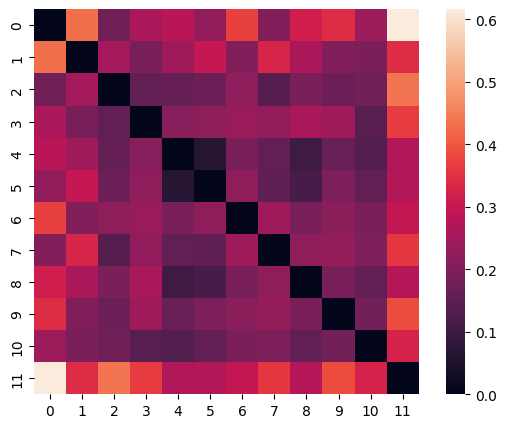

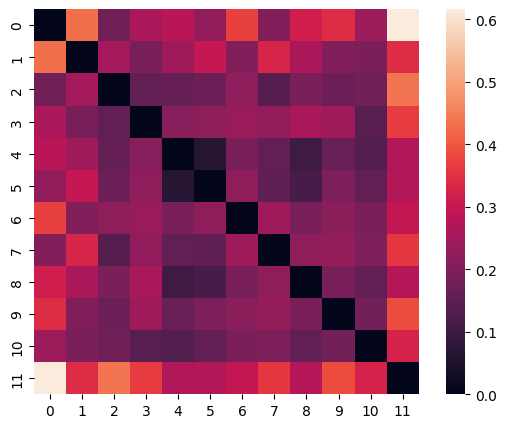

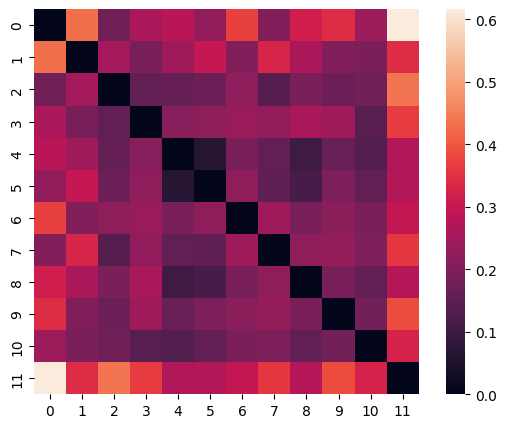

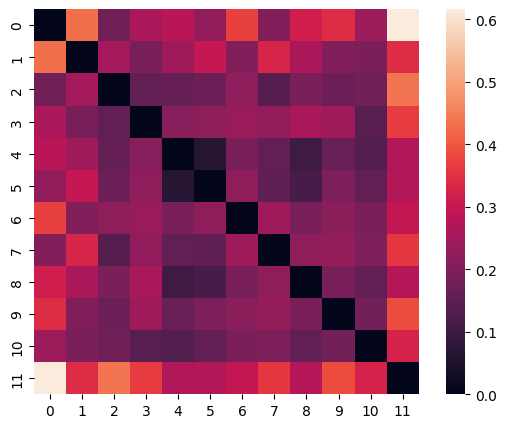

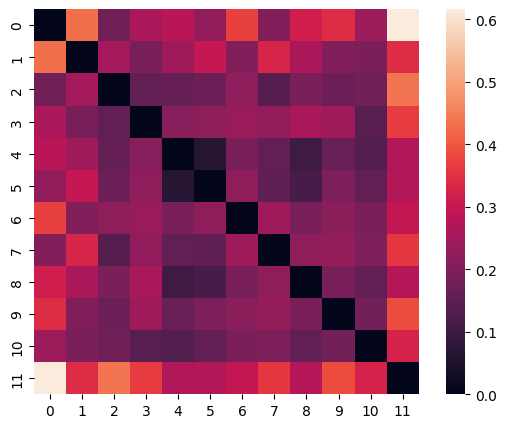

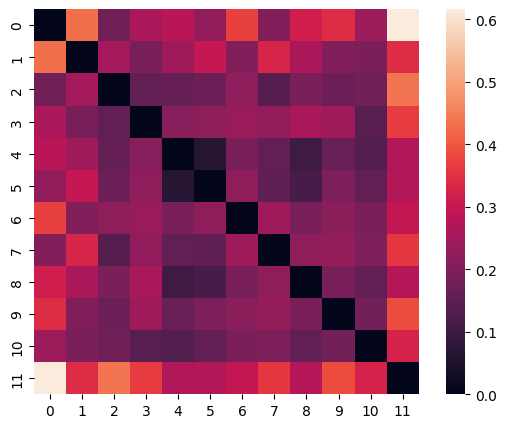

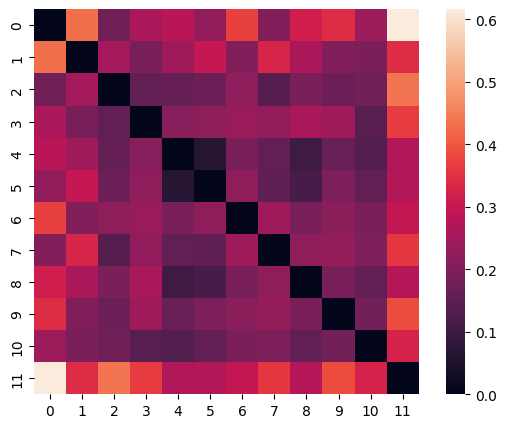

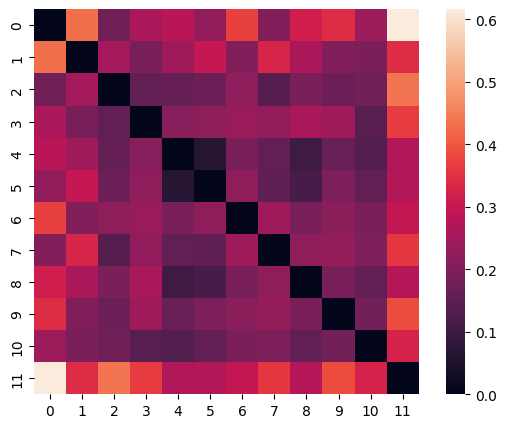

In [12]:
####### all

t_items = ['Reeval', 'Certainty', 'Cost', 'If_help', 'Intention', 'Allocation', 'Mood', 'Surprise'] # 'Reeval',

sub7001_data = data[data.X['Subject']==7001]
sub7001_bdata = data.X[data.X['Subject']==7001]

for t_item in t_items:
    print(t_item)
    sub7001_bdata[t_item].values.reshape(-1,1) # 行为数据

    # For one ROI
    ROI_mask = mask_all[mask_all.X['Cluster_num']==1]
    masked_data  = sub7001_data.apply_mask(ROI_mask)    
    ROI_dist = masked_data.distance(metric = 'correlation')
    ROI_dist.plot()

    subID = data.X['Subject'].unique()

    sub_num = len(subID)

    results_r = np.zeros((200,sub_num))
    results_p = np.zeros((200,sub_num))

    for i,sub in enumerate(subID):
        print (t_item, sub)
        sub_data = data[data.X['Subject']==sub]
        sub_bdata = data.X[data.X['Subject']==sub]
        
        pair_dist = pairwise_distances(sub_bdata[t_item].values.reshape(-1, 1), metric = 'euclidean')
        pair_dist = (pair_dist + pair_dist.T)/2
        
        model_dist = Adjacency(pair_dist)
        for k in mask_all.X['Cluster_num']:  
            print (t_item, sub, k)
            ROI_mask = mask_all[mask_all.X['Cluster_num']==k]
            masked_data  =  sub_data.apply_mask(ROI_mask)    
            ROI_dist = masked_data.distance(metric = 'correlation')
            Brain_Beha_corr = ROI_dist.similarity(model_dist,plot = False, n_permute = 10000, metric='spearman')

            results_r[k-1,i] = Brain_Beha_corr['correlation']
            results_p[k-1,i] = Brain_Beha_corr['p']  

    results_dir = 'D:/CBCS_fMRI/LiuXuqi_CMF/04_RSA/20230818_RSA_12Onset/WSRSA_condition_results_20230818_12Onset/'
    results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
    results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'

    np.savetxt(results_r_dir,results_r)    
    np.savetxt(results_p_dir,results_p)  

    print(t_item, ' finished!')
    
# t_items = [  'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

In [ ]:
#

In [11]:
results_dir = 'D:/CBCS_fMRI/LiuXuqi_CMF/04_RSA/20230818_RSA_12Onset/WSRSA_condition_results_20230818_12Onset/'

if os.path.exists(results_dir):
    print(f"The directory '{results_dir}' exists.")

The directory 'D:/CBCS_fMRI/LiuXuqi_CMF/04_RSA/20230818_RSA_12Onset/WSRSA_condition_results_20230818_12Onset/' exists.


In [21]:
results_dir = 'D:/CBCS_fMRI/LiuXuqi_CMF/04_RSA/20230810_RSA_6Onset/WSRSA_condition_results_20230810_6Onset/'
results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'

np.savetxt(results_r_dir,results_r)    
np.savetxt(results_p_dir,results_p)  

# test (because pairwise_distances seems not to generate the symmetric matrix)

# subID = 7003
# sub_data = data[data.X['Subject']==subID]
# sub_bdata = data.X[data.X['Subject']==subID]

# pair_dist = pairwise_distances(sub_bdata["Allocation"].values.reshape(-1, 1), metric = 'euclidean')
# print(pair_dist)
# # print(pair_dist.T - pair_dist)
# pair_dist = (pair_dist + pair_dist.T)/2
# print(pair_dist)

# model_dist = Adjacency(pair_dist)

# print(type(pairwise_distances(sub_bdata["Allocation"].values.reshape(-1, 1), metric = 'euclidean')))
# print(model_dist)

Reeval 0.03259348130373925
Reeval 197  (sig)
Certainty 0.022795440911817635
Certainty 93  (sig)
Cost 0.04099180163967207
Cost 194  (sig)
If_help 0.04439112177564487
If_help 177  (sig)
Intention 0.0001999600079984003
Intention 0  (sig)


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\nilearn\plotting\displays\_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


Allocation 0.041991601679664065
Allocation 170  (sig)
Mood 0.014397120575884824
Mood 59  (sig)
Surprise 0.0001999600079984003
Surprise 0  (sig)


C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\nilearn\plotting\displays\_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


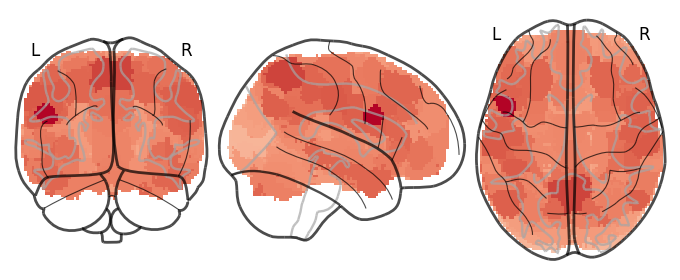

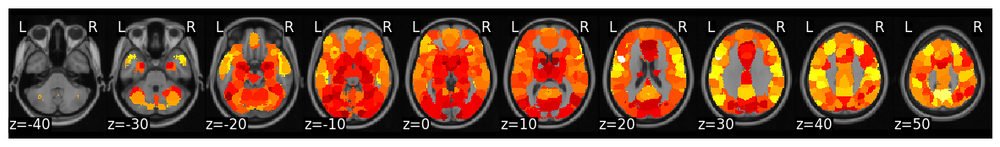

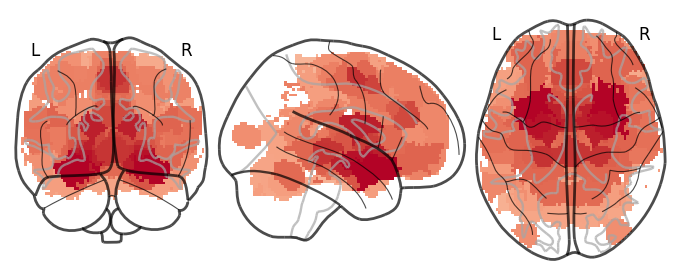

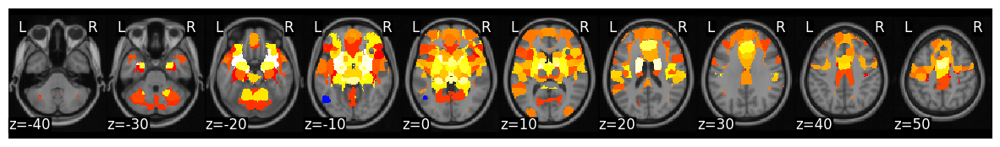

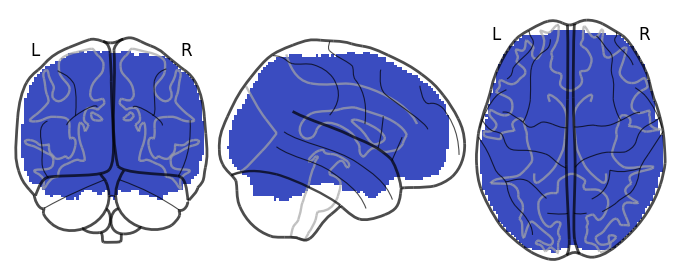

...

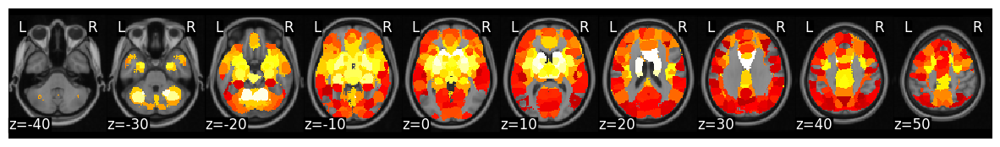

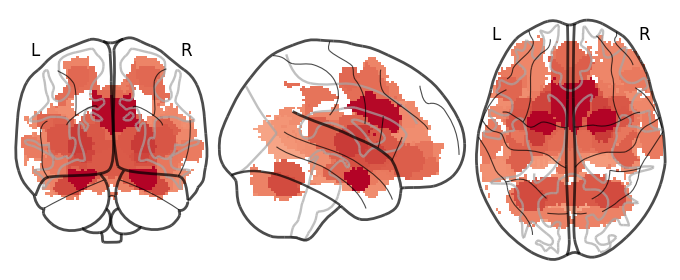

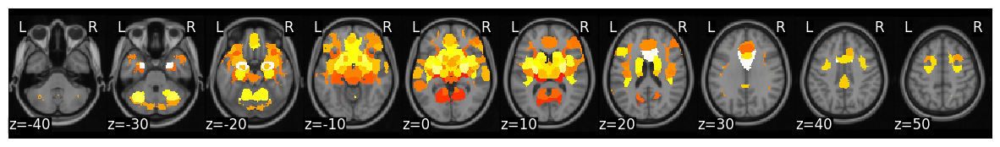

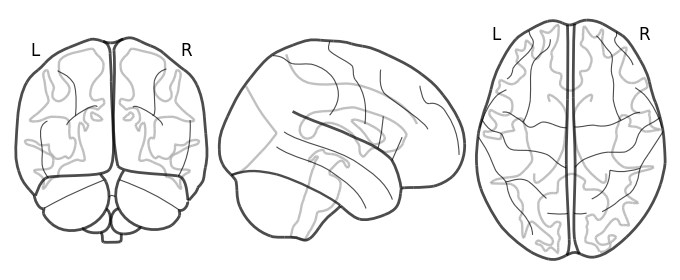

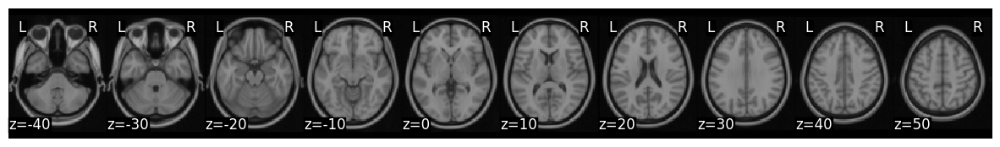

In [13]:
threshold_list = []
rsa_p_list = []
# t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

t_items = ['Reeval', 'Certainty', 'Cost', 'If_help', 'Intention', 'Allocation', 'Mood', 'Surprise'] # 'Reeval',

for t_item in t_items:
    rsa_stats = []
    
    results_dir = 'D:\\CBCS_fMRI\\LiuXuqi_CMF\\04_RSA\\20230818_RSA_12Onset\\WSRSA_condition_results_20230818_12Onset\\'
    results_r_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_r_value.txt'
    results_p_dir = results_dir + 'Withinsubject_RSA_'+ t_item + '_200_p_value.txt'
    
    results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)
    results_p = np.loadtxt(results_p_dir,delimiter = ' ', skiprows = 0)

    for k in mask_all.X['Cluster_num']:
        rsa_stats.append(one_sample_permutation(np.array(fisher_r_to_z(results_r[k-1,:])),n_permute=5000))

    rsa_p_list.append(rsa_stats)
    
    fdr_p = fdr(np.array([x['p'] for x in rsa_stats]), q=0.05)
    print(t_item, fdr_p)
    
    count = sum(1 for x in rsa_stats if x['p'] < fdr_p)
    print(t_item, count, " (sig)")

    rsa_r = Brain_Data([x*y['mean'] for x,y in zip(mask_all, rsa_stats)]).sum()
    rsa_p = Brain_Data([x*y['p'] for x,y in zip(mask_all, rsa_stats)]).sum()

    thresholded = threshold(rsa_r, rsa_p, thr=fdr_p)

    plot_glass_brain(thresholded.to_nifti(), cmap='coolwarm')

    thresholded.write(os.path.join(results_dir,str('Withinsubject_RSA_' + t_item + '_200_fdr.nii.gz')))

    thresholded.plot()
    
    threshold_list.append(thresholded)
    
    # t_items = [  'Reeval', 'Certainty', 'Cost', 'Intention', 'Gratitude', 'Allocation'] # 'Reeval',

In [5]:
results_r_dir = results_dir + 'Withinsubject_RSA_Gratitude_200_r_value.txt'

results_r = np.loadtxt(results_r_dir,delimiter = ' ', skiprows = 0)

In [11]:
# for i in range(len(results_r[118])):
#     print(results_r[118][i],',')

In [20]:
one_sample_permutation(np.array(fisher_r_to_z(results_r[51,:])),n_permute=1000)

{'mean': 0.051278478995045534, 'p': 0.08391608391608392}

In [15]:
fisher_r_to_z(results_r[51,:])

array([ 0.28402743, -0.1284919 ,  0.01057085,  0.5500589 ,  0.0168139 ,
        0.02110279,  0.08733462, -0.18623966, -0.1172469 ,  0.63064904,
        0.10148884, -0.08634614, -0.15000625, -0.01908985,  0.30099553,
        0.20773238,  0.10071389,  0.14802268,  0.14761061,  0.0490529 ,
       -0.02851963,  0.05953599,  0.04434963, -0.14240824, -0.12574943,
        0.14720958,  0.00616885,  0.35094524,  0.02553409, -0.0901029 ,
        0.01136347,  0.01280552, -0.09159015, -0.09475719,  0.14560318,
       -0.12354944, -0.02085809,  0.45720234, -0.02651182, -0.06427534,
       -0.04668969, -0.13543421,  0.50240867, -0.13414294, -0.17454375,
       -0.07393737])

In [16]:
results_r[51,:]

array([ 0.27662845, -0.1277894 ,  0.01057046,  0.50056435,  0.01681232,
        0.02109965,  0.08711325, -0.18411587, -0.11671258,  0.55849897,
        0.10114183, -0.08613219, -0.14889115, -0.01908753,  0.2922234 ,
        0.204795  ,  0.10037475,  0.14695098,  0.14654778,  0.04901359,
       -0.0285119 ,  0.05946575,  0.04432058, -0.1414533 , -0.12509077,
        0.14615534,  0.00616878,  0.33721356,  0.02552855, -0.08985985,
        0.01136298,  0.01280482, -0.0913349 , -0.0944746 ,  0.14458289,
       -0.12292461, -0.02085506,  0.4278013 , -0.02650561, -0.06418697,
       -0.04665579, -0.13461218,  0.46400934, -0.13334409, -0.17279257,
       -0.07380293])

# Changed_Data Check

In [24]:
mask_all[51].iplot()

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

In [22]:
results_1012_dir = 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\20241012_rsa_12Onset\\WSRSA_condition_results_20241012_12Onset\\'

results_1012_r = np.loadtxt(os.path.join(results_1012_dir,'Withinsubject_RSA_Intention_200_r_value.txt'),delimiter = ' ', skiprows = 0)
print(results_1012_r[51])

[-0.0370498  -0.25512368 -0.14196919 -0.18299169  0.03598184 -0.17263915
 -0.05598559  0.0237722  -0.02743387 -0.17443698 -0.04253231 -0.02152715
  0.19523657  0.15894484 -0.01867951  0.00845147  0.11020857 -0.04638433
 -0.03825206  0.04382183  0.01910855  0.13055064 -0.14376083  0.08512727
  0.07890918 -0.25425723 -0.05348231 -0.15310414  0.18075732 -0.06647251
 -0.03006828 -0.0367119  -0.10514668  0.37429271  0.07847521 -0.11631298
 -0.03348548 -0.11376276  0.14083534  0.22034762 -0.10874809 -0.07466387
 -0.06471899 -0.07531802  0.0288817   0.21163525]


In [28]:
results_0909_dir = 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\20240909_rsa_12Onset_intention\\WSRSA_condition_results_20240909_12Onset\\'

results_0909_r = np.loadtxt(os.path.join(results_0909_dir,'Withinsubject_RSA_Intention_200_r_value.txt'),delimiter = ' ', skiprows = 0)
print(results_0909_r[51])

[ 0.45206278  0.05536696  0.08571645  0.20358113  0.07286218  0.04612788
  0.01508368  0.19200463 -0.03340711  0.13379869  0.11963332 -0.04886759
  0.03801448  0.3388744   0.26015771  0.2196072   0.1193653   0.16628841
  0.130643    0.14151495  0.00545958  0.07545752 -0.02007489 -0.1267922
 -0.27904501  0.12759294  0.03704363  0.11676593  0.27034214 -0.03870766
  0.22670491  0.18688329  0.0483002   0.03611413  0.3329748  -0.09595193
 -0.11806585  0.29440354  0.07959724  0.1078563  -0.04027981  0.03827699
  0.44654684  0.16976333 -0.07063714  0.03493058]


In [36]:
print(one_sample_permutation(np.array(fisher_r_to_z(results_0909_r[51,:])),n_permute=100000))

{'mean': 0.10189763760741831, 'p': 4.999950000499995e-05}


In [32]:
results_0906_dir = 'E:\\lxq\\jupyter\\CMF2024\\fmri\\03_rsa\\20240906_rsa_12Onset\\WSRSA_condition_results_20240906_12Onset\\'

results_0906_r = np.loadtxt(os.path.join(results_0906_dir,'Withinsubject_RSA_Intention_200_r_value.txt'),delimiter = ' ', skiprows = 0)
print(results_0906_r[51])

[ 0.4460596   0.06794566  0.07383583  0.2023749   0.08923035  0.08466843
  0.03031681  0.02441878 -0.03069086  0.14275721  0.13893471 -0.05453824
 -0.0139044   0.23976199  0.26304031  0.21252542  0.12946428 -0.01011675
  0.12692825  0.13858472  0.00545958  0.09288294 -0.00694249 -0.06468586
 -0.27422977  0.10917369  0.04581811  0.11676593  0.28008552 -0.01271412
  0.23921238  0.12522855  0.05714584  0.03261437  0.33280424 -0.09595193
 -0.13135699  0.37992403  0.1055151   0.08651418 -0.12956641  0.00693429
  0.46735866  0.18478605 -0.07063714  0.07044062]


In [35]:
print(one_sample_permutation(np.array(fisher_r_to_z(results_0906_r[51,:])),n_permute=100000))

{'mean': 0.09544730013192258, 'p': 6.999930000699993e-05}


In [34]:
import sys
sys.version

'3.8.10 (tags/v3.8.10:3d8993a, May  3 2021, 11:48:03) [MSC v.1928 64 bit (AMD64)]'